# Aggregation des Bildes dessen was und wie annotiert wurde

In [65]:
#das gilt für den aggregation der gelabelte Episoden und Motive im Einzelne
maerchen="" 
import xml.etree.ElementTree as ET
root_node = ET.parse('gesamt_märchen.xml').getroot()
for ganze in root_node.findall(".//{http://www.tei-c.org/ns/1.0}text"):
    if 'zyx_' in ganze.attrib['{http://www.w3.org/XML/1998/namespace}id']:
        for body in ganze.findall(".//{http://www.tei-c.org/ns/1.0}body"):
            for division in body.findall(".//{http://www.tei-c.org/ns/1.0}div"):
                for content in division.findall(".//{http://www.tei-c.org/ns/1.0}*"):
                    for decls in division.findall(".//{http://www.tei-c.org/ns/1.0}p"):
                        label=content.attrib['{www.dglab.uni-jena.de/kf}ana']
                        quelle=decls.attrib['decls']
                        inhalt=content.text.lower()
                        if label.startswith(('e')):
                            maerchen+=quelle+'|'+label+'|'+inhalt+'|0'+'\n'
with open("text_roh.csv", 'w', encoding='utf-8') as f:
    f.write('quelle|index_string|episode|index_binar\n')
    f.write(maerchen)

In [66]:
fin = open('text_roh.csv','r', encoding ='utf-8')
fout = open('text_rein.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace("ä","ae").replace("ü","ue").replace("ö","oe").replace("ß","ss")
        .replace(",","").replace("«","").replace("»","").replace(".","").replace(":","")
        .replace(";","").replace('"',"").replace("?","").replace("!","").replace("á","a")
        .replace(",","").replace("\t"," ").replace("'","").replace("‹","").replace("›","")
        .replace("-"," ").replace("'('","").replace("')'","").replace('>','').replace("    "," ")
        .replace("   "," ").replace("  "," ").replace('–','').replace('—','').replace('<','').replace("Â", "A")
        .replace("ø", "oe").replace('“','').replace('„','').replace('(','').replace(')','').replace("‚", "")
        .replace ('|',',').replace('*','').replace("\n","\n").replace("=", ""))
fin.close()
fout.close()

# erthaos - Jagd auf die Z-Label-Datensatz

In [143]:
#das gilt für den Aggregation der ungelabelte Episoden und Motive von gelabelten wird nur Z abgerufen
maerchen="" 
import xml.etree.ElementTree as ET
root_node = ET.parse('gesamt_märchen.xml').getroot()
for ganze in root_node.findall(".//{http://www.tei-c.org/ns/1.0}text"):
    if 'zyx_' in ganze.attrib['{http://www.w3.org/XML/1998/namespace}id']:
        for body in ganze.findall(".//{http://www.tei-c.org/ns/1.0}body"):
            for division in body.findall(".//{http://www.tei-c.org/ns/1.0}div"):
                for content in division.findall(".//{http://www.tei-c.org/ns/1.0}*"):
                    for decls in division.findall(".//{http://www.tei-c.org/ns/1.0}p"):
                        label=content.attrib['{www.dglab.uni-jena.de/kf}ana']
                        quelle=decls.attrib['decls'] 
                        inhalt=content.text
                        if not label.startswith(('f','m')):
                            maerchen+=quelle+'|'+label+'|'+inhalt+'|0'+'\n'
with open("text_roh.csv", 'w', encoding='utf-8') as f:
    f.write('quelle|index_string|episode|index_binar\n')
    f.write(maerchen)

In [144]:
fin = open('text_roh.csv','r', encoding ='utf-8')
fout = open('text_rein.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace("ä","ae").replace("ü","ue").replace("ö","oe").replace("ß","ss")
        .replace(",","").replace("«","").replace("»","").replace(".","").replace(":","")
        .replace(";","").replace('"',"").replace("?","").replace("!","").replace("á","a")
        .replace(",","").replace("\t"," ").replace("'","").replace("‹","").replace("›","")
        .replace("-"," ").replace("'('","").replace("')'","").replace('>','').replace("    "," ")
        .replace("   "," ").replace("  "," ").replace('–','').replace('—','').replace('<','').replace("Â", "A")
        .replace("ø", "oe").replace('“','').replace('„','').replace('(','').replace(')','').replace("‚", "")
        .replace ('|',',').replace('*','').replace("\n","\n").replace("=", ""))
fin.close()
fout.close()

In [145]:
custom_stop_word_list=['']
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
NLTK_stop_words_list=stopwords.words('russian')
ru = custom_stop_word_list + NLTK_stop_words_list

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\elguj\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [146]:
import pandas as pd
from collections import Counter
df = pd.read_csv('text_rein.csv',  encoding='utf-8')
indexliste=Counter(df.index_string)
#print(indexliste, sep='\n')

In [147]:
df.loc[df['index_string'] == 'e516_k_gewinnung_des_OB']

,quelle,index_string,episode,index_binar


In [148]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
vectorizer = TfidfVectorizer
vectorizers = vectorizer(analyzer='word', ngram_range=(1,1), 
                         min_df = 2, stop_words = ru)
vokabular =  vectorizers.fit_transform(df.episode)
metrik = cosine_similarity
def find_similar(vokabular, index, top_n =-1):   
    metriks = metrik(vokabular[index:index+1], vokabular).flatten()
    related_docs_indices = [i for i in metriks.argsort()[::-1] 
                            if i != index]
    return [(index, metriks[index]) for index 
            in related_docs_indices][0:top_n]

In [149]:
n_te = 11144
print(df.quelle[n_te],'-', df.episode[n_te])

zyx_ava_rus_122 -  Друг мой сказал старший из муталимов Сейчас каждый из нас возвратится в свой аул и мы будем редко видеться Но есть средство чтобы наша дружба не прервалась Давай породнимся Когда моя дочь подрастет я выдам ее за твоего сына


In [150]:
for index, score in (find_similar(vokabular, n_te)):
     if (df.index_string[index]=="0" and index>=0):
        print(index,'-', score,'-', df.quelle[index],'-', 
           df.episode[index], '-',  df.index_string[index],'-', df.index_binar[index],'\n' )

3829 - 0.2356758885967173 - zyx_kum_rus_9 - Выдам - 0 - 0 

19315 - 0.18993993664613362 - zyx_ava_rus_194 - 1 Балхар  аул лакских гончаров  - 0 - 0 

3577 - 0.1729941597644234 - zyx_kum_rus_7 - Раз так пошли хану весть я выдам дочь за тебя сказал отец девушки - 0 - 0 

5675 - 0.1619011486800238 - zyx_lbe_rus_10 - Старший брат сказал - 0 - 0 

12772 - 0.1619011486800238 - zyx_nog_rus_25 - Старший брат сказал  - 0 - 0 

23917 - 0.1619011486800238 - zyx_ttt_rus_33 - Старший брат сказал - 0 - 0 

6238 - 0.1619011486800238 - zyx_ttt_rus_6 - Старший брат сказал - 0 - 0 

6922 - 0.1571132854901354 - zyx_rut_rus_8 - Знаешь друг давай мы пойдем каждый своей дорогой Я хочу уйти от тебя - 0 - 0 

10285 - 0.15371785815334427 - zyx_ava_rus_91 - Понял тут Насреддин что и ему не провести веселых муталимов - 0 - 0 

9606 - 0.14921312442771156 - zyx_ava_rus_54 - Не к добру это подумала лиса ибо знала что дружба с сильным опасна для слабого Но волк уговорил ее уж очень льстила ему дружба с царем зверей 

13745 - 0.06632096213262442 - zyx_nog_rus_48 -  Давай расскажем друг другу сказку Чья сказка окажется интереснее тому проигравший даст пуд муки  - 0 - 0 

13749 - 0.06632096213262442 - zyx_nog_rus_48 -  Давай расскажем друг другу сказку Чья сказка окажется интереснее тому проигравший даст пуд муки  - 0 - 0 

13746 - 0.06632096213262442 - zyx_nog_rus_48 -  Давай расскажем друг другу сказку Чья сказка окажется интереснее тому проигравший даст пуд муки  - 0 - 0 

14799 - 0.06631082898850522 - zyx_khv_rus_71 -  Спасибо тебе старший брат если бы не ты то шакал съел бы меня  сказал кот льву  - 0 - 0 

8330 - 0.06630296327030227 - zyx_ava_rus_30 - Давай обменяй волов на эту лошадь - 0 - 0 

1960 - 0.0662979272892607 - zyx_dar_rus_5 - В один из дней он услышал как старший брат застонал - 0 - 0 

4129 - 0.06629289244243491 - zyx_dar_rus_12 - Ты привел свою дочь - 0 - 0 

19493 - 0.06628538970732717 - zyx_ava_rus_145 -  Это  моя жена Отныне мы будем жить все вместе Но пока никто не должен знать 

1196 - 0.052557767447630965 - zyx_dar_rus_2 - Как жаль твой дворец оставлять здесь Хорошо было бы если бы на месте дворца талхана оказался твой а на месте твоего талхана сказал опять Али - 0 - 0 

10746 - 0.052540523574742 - zyx_ava_rus_104 -  Я знаю этого нарта Он злой колдун Но есть средство и против его колдовства Когда ты прибудешь к нарту он попросит тебя разрубить дерево собрать дрова и затопить печь Не выполняй ни одной его просьбы А когда он сам залезет в печь задвинь его там камнем И нарта настигнет смерть - 0 - 0 

26814 - 0.05252739199285931 - zyx_dar_rus_163 -  Мне уже пора улетать давай ка разделим наши богатства - 0 - 0 

6193 - 0.05249699845148524 - zyx_ttt_rus_6 - Младший сказал - 0 - 0 

15192 - 0.052489994401520496 - zyx_lez_rus_25 -  Давай меняться предлагает он юноше ты мне саз я тебе невесту  - 0 - 0 

26717 - 0.0524772642379484 - zyx_dar_rus_156 - Ради Аллаха друг не рассказывай в ауле что видел меня здесь - 0 - 0 

2875 - 0.052471942094941104 - zyx_dar_rus_9 - Не

9263 - 0.04343751465060221 - zyx_ddo_rus_12 - Пришел он к верующему человеку Сказал он ему Бог сказал тебе из семи адов в самый плохой ад бросит он тебя Пришел к вору Сказал он воруБог сказал тебе из восьми раев в самый хороший рай бросит он тебя Пришел к волку Сказал оп волку Тебе бог указал лекарство мозг глупого человека Тогда волк встал и напал на того человека Где же найду я человека имеющего мозг глупее твоего сказав растерзал убил его и съел его мозг Волк оказывается выздоровел - 0 - 0 

23424 - 0.04343719646968575 - zyx_ttt_rus_30 -  Нет надишах Я хочу купить Лес не для себя а для одного человека моего работника Он каждый день возит мне дрова из этого лесаПадишах опять засмеялся и говорит - 0 - 0 

7235 - 0.043433793960143165 - zyx_kum_rus_22 - Услышав об этом отец и мать не согласились еще раз позвали сына говорят - 0 - 0 

15299 - 0.04341415171040485 - zyx_ava_rus_124 -  Народ ходит на поклонение святым местам в Мекку давай ка и мы пойдем туда  - 0 - 0 

26481 - 0.04337722964

4419 - 0.03797884577826027 - zyx_kum_rus_10 - Привел ее в свой дом совершил мусульманский обряд бракосочетания и стала она его женой - 0 - 0 

1347 - 0.03792978233981273 - zyx_kum_rus_4 - Мы джинны Люди которых ты видел во дворцах каждый из них визирь хана джиннов Мы пишем государственные документы ответили они - 0 - 0 

20361 - 0.03792594396729371 - zyx_ava_rus_182 - Приехал с пятнадцатью арбами отец и спрашивает сына  - 0 - 0 

5756 - 0.03791993041455536 - zyx_kum_rus_14 - Нет сказал Джамав - 0 - 0 

2137 - 0.037914209440354715 - zyx_rut_rus_1 - Старик сказал юноше - 0 - 0 

7099 - 0.03790367951591815 - zyx_kum_rus_21 - Наутро женщина через сына опять послала кадию хайт - 0 - 0 

16882 - 0.037894973435640765 - zyx_dar_rus_85 - Когда ханская дочь пошла к роднику за водой она ветре   - 0 - 0 

19793 - 0.037866847877500234 - zyx_ava_rus_162 -  Клянусь  сказал барсук  я был на свадьбе ханского сына там подавали самые вкусные куиианья какие только есть на свете и меня угощал сам хан Тогда

11490 - 0.032900375267829976 - zyx_agx_rus_46 -  Как сказали когда дошло это известие Царь сказал Я ему море показал Со мной спорить пе сможешь я море сказал Он мне сказал Если ты море то я сверху ходящий плывущий пароход Вторым вопросом я ему железо показал Я железо сказал Он мне гвоздь показал Я сквозь железо проникающий гвоздь сказал Я ему стальпоказал Он мне кремень от огнива показал Этим камнем я тебя износив прикончу сказал Потом я ему бороду показав сказал Ты маленький а я белобородый старик Со мной ты не сможешь тянуться спорить Он сказал Ум и в белой бороде не бывающий и у мальчика не бывающий Ум в голове должен быть Такими словами мальчик меня победил С сегодняшнего дня что я умный больше я нс скажу А этот мальчик моим советпикО’М пусть будет Окончилось - 0 - 0 

23962 - 0.032885822442537696 - zyx_ttt_rus_33 - Братья посмотрели друг на друга не зная признаться или промолчать Герои ие любят хвалиться  пусть их другие хвалят - 0 - 0 

8425 - 0.032877433997170136 - zyx_lbe_rus_1

27287 - 0.029503853104821513 - zyx_dar_rus_178 -  Давая скорее сюда дочь моя  оживился хан и быстро съел все мясо - 0 - 0 

18451 - 0.029495973538949623 - zyx_dar_rus_94 - Сын портного поднял все три сундука и узнал в каком сундуке кто находится И снова не сказал он хану об этом пока тот не дал слова выдать за него замуж свою дочь и освободить его из под стражи  - 0 - 0 

13991 - 0.029492995639775428 - zyx_khv_rus_4 - − Нет Никуда я отсюда не уйду И земля эта не твоя а Аллаха свт Я буду ходить по этой земле и пасти свой скот − твердо ответил юноша  - 0 - 0 

21192 - 0.029487524620422437 - zyx_ddo_rus_26 - Теперь этот дракон поднялся и сказал Одинраз гостъ второй раз гостъ третий раз гость а на следующий раз что ты хочешь Он сказал Молчаливый рот получает вознаграждение как за соблюдение поста Тебе тоже будет хорошо если будешь молчать сказал Аликилич и стал наполнятъ кувшин Ты вздумал меня учить пришелец сказал дракон и бросился на него - 0 - 0 

14016 - 0.029478271242099677 - zyx_khv_

2087 - 0.026462138971411257 - zyx_lez_rus_6 - Я дочь падишаха одного города однажды я пошла к девочкам во двор поиграть с ними они меня не приняли в игру и сказали что они не примут меня в игру потому что у меня нет брата Я расплакалась и рассказала об этом матери Мать сказала Пусть умрут все их братья милая дочка а у тебя было семеро братьев На мои расспросы что с ними случилось мать ответила Когда их как и тебя тоже не стали принимать в свой круг из за того что у них нет сестры они ушли из этих мест Ах сказала я матери тогда я тоже отправлюсь за братьями И вот сейчас я здесь - 0 - 0 

7050 - 0.026457246058714648 - zyx_kum_rus_20 - Бийи какое проклятье у нашего ребенка ведь и зубы выросли Если так рано вырастают зубы говорят это предвещает родителям ребенка беду Принеси ка щипцы пока никто не увидел давай вытащим его зубы сказал ее муж и не обращая внимания на крики муллы выдернул зубы и выбросил - 0 - 0 

22243 - 0.026445618821363905 - zyx_ttt_rus_19 - Шли дни В один из дней отец Рус

18316 - 0.023812309728137443 - zyx_ava_rus_135 - Он пригласил в гости и ее брата своего друга Родители очень обрадовались приезду своего сына и еще больше возвращению любимой невестки с внуком  - 0 - 0 

3987 - 0.023807476526973508 - zyx_lez_rus_12 - Услышав рассказ парня купец сказал - 0 - 0 

8505 - 0.02379262966699675 - zyx_rut_rus_11 - Снимите снимите с его шеи петлю крикнул падишах Мы сейчас должны наказать его мать Мы изгоним из села этого вора не разрешим ему никогда здесь появляться а мать лишим возможности видеть его там где он будет находиться Это для нее будет подобно смерти сына Может ли быть наказание страшнее этого Виновата в случившемся мать поэтому мы наказываем ее пусть мучается сказал падишах - 0 - 0 

16891 - 0.02378603308341383 - zyx_dar_rus_85 -  Мудрые змеи знают будущее Что ж пусть моя дочь станет женой охотника  - 0 - 0 

18888 - 0.02378154424931828 - zyx_lez_rus_36 - И шах обратясь к своему назиру сказал  - 0 - 0 

5327 - 0.02377305595627666 - zyx_rut_rus_7 - Б

25579 - 0.021886661761007706 - zyx_ttt_rus_54 - Верст десять проскакала девушка а сын шаха Аббаса не отстает Прискакала девушка к подножию горы соскочила с коня привязала его к дереву и спустилась в ущелье Шах заде остался у обрыва смотрит а в ущелье пируют сорок люти Старший люти увидел девушку и говорит ей - 0 - 0 

9892 - 0.021882526626235112 - zyx_ava_rus_65 - Девушка накалила свое клеймо и заклеймила ханского сына и везира так как обычно клеймят рабов И пришлось им обоим нести домой метку позора - 0 - 0 

2605 - 0.02188196945803043 - zyx_ttt_rus_2 - Жон ювелир сказала девушка войдя в лавку вот тебе два хурджуна золота Сделай мне пожалуйста золотой сундук на четырех колесах с окошком закрывающимся изнутри В этот сундук должны поместиться три человека За свой труд ты получишь еще один хурджин золота - 0 - 0 

4518 - 0.021868242109433774 - zyx_lbe_rus_8 - Была не была у одной бедной женщины была дочь которая съедала пять чуреков пока комнату подметет - 0 - 0 

20477 - 0.0218572343807

21618 - 0.020086630715937165 - zyx_ddo_rus_74 - В тот день там был и Мухаммед Когда он возвратился с пятничной молитвы Патимат увидела что отец огорчен и поэтому спросила его почему он такой грустный Сначала он пытался не говорить но потом дочь не отставала и он рассказал так мол и так хан на пятничной молитве задал вопрос самая черная самая мягкая и самая быстрая вещь что это такое Я никак не мог отгадать эту загадку поэтому я такой печальный Эх эх сказала дочь ты задумался не найдя ответ на такой простой вопрос А ты знаешь ответ спросил отец у дочери Знаю это человеческое сердце ответила дочь в состоянии злобы оно становится черным когда человек откликается на зов оно становится резвым а когда человек радуется оно становится мягким - 0 - 0 

11284 - 0.02008551201769329 - zyx_tab_rus_28 - Сосед спросил у него Почему кутаешь одной рукой где другая рука Гасан ударив о землю поломал байку и выскочив когда бежал то задел старуху находившуюся па лестнице и та упала Сельчане погнались за Га

24162 - 0.01836807976364924 - zyx_ttt_rus_36 - Но старый купец считал своего сына еще ребенком и стал его отговаривать А сын стоял на своем В конце концов после долгих уговоров отец согласился Он дал сыну три тысячи эршефи и отпустил его И юноша уехал с одним торговым обозом - 0 - 0 

13016 - 0.01835388124900572 - zyx_nog_rus_28 -  На спине у каждого раба по два клейма сказал юноша  - 0 - 0 

5750 - 0.01835133307186785 - zyx_kum_rus_14 - Вторую грушу дал Джамав Старик съел и ее и сказал - 0 - 0 

24625 - 0.018347955627185733 - zyx_ttt_rus_45 -  Могилами предков клянусь так и сказал  ответил слуга - 0 - 0 

3156 - 0.018344753408126763 - zyx_lbe_rus_5 - Не переживай и не печалься Мы возьмем тебе в жены девушку лучше ее любую дочь пачаха возьмем Позабудь об этой девушке - 0 - 0 

11311 - 0.018330272266980127 - zyx_tab_rus_33 - Поймав мышей открыв глаза нужно всыпать сказал - 0 - 0 

10121 - 0.01832981365883739 - zyx_ava_rus_76 - Когда они поели жена принесла арбуз Хозяин разрезал его и ск

4191 - 0.016672594799370416 - zyx_agx_rus_4 - Ничего сказал Самед я согласен выполнить твои условия Говори - 0 - 0 

523 - 0.016671162140437627 - zyx_lbe_rus_1 - Это золото и серебро передай старику Если старик будет предлагать приданое не смей его брать а попроси только его дочь На моего коня посади девушку а сам садись на своего коня - 0 - 0 

18489 - 0.01667049487064226 - zyx_lbe_rus_45 -  Жалею куса Клянусь если б знал что это так я бы не нанялся к тебе сказал юноша  - 0 - 0 

589 - 0.01666955320608228 - zyx_ava_rus_3 - И в третий раз распространился хабар что западный пачах отдаст младшую дочь тому чей конь перепрыгнет через башню Старшие братья снова стали готовиться в дорогу - 0 - 0 

6109 - 0.01666847732032186 - zyx_lez_rus_16 - Говорят что падишах переодевшись дервишем часто любил ходить по своим владениям чтобы посмотреть как живет народ узнать как служат его чиновники как они вершат свой суд И в этот раз одев лохмотья приняв вид странника он выехал в город Была студеная зимн

9292 - 0.014972074065661036 - zyx_dar_rus_74 -  Что это такое разве годятся эти шапки моим сыновьям сказал Мулла Насреддип - 0 - 0 

12138 - 0.014970340203495323 - zyx_nog_rus_19 - Аздаа с войском помчался дальше а юноша с девушкой приняли свой обычный вид вскочили на Елетпеса и помчались своей дорогой Скачут они скачут смотрят аздаа опять их нагоняет Они слезли с Елетпеса он тряхнул гривой и обернулся мечетью а юноша с девушкой стали стариком и старухой В руках у них по кумгану и спешат они на омовение Аздаа подскакал к ним и спрашивает  - 0 - 0 

11563 - 0.014968701333618618 - zyx_nog_rus_10 - Но все люди звери и птицы молчали Лишь один старик выступил вперед и сказал хану  - 0 - 0 

12297 - 0.014953687285734143 - zyx_nog_rus_20 - А младший сын падишаха снова обрел жену и детей Стариков которые вырастили девушку с золотыми волосами и юношу с серебряными бровями он назвал своими родителями Своего сына с серебряными бровями он женил на повелительнице джиннов Сарыгыз и все стали жить в 

2155 - 0.01374279431953684 - zyx_rut_rus_1 - Стыдно стало ему и он стал извиняться за свои глупые выходки и просить прощения у жены Долго он благодарил старика А тот понял что это и есть дочь падишаха которую он разыскивает Он снял с пальца кольцо и дал ей Она тоже дала ему свое кольцо чтобы старик показал его отцу и ее сестре - 0 - 0 

4701 - 0.013741782123643893 - zyx_agx_rus_17 -  Однажды Молла Насреддин пошел на пашню и поймал там зайца Принес он этого зайца домой Потом положил его в мешок завязав верх и оставил этот мешок в углу Он сказал своей жене Этот мешок не трогай Молла Насреддин сказал мужикам Я вам сейчас покажу кое что чего вы в жизни не видели Постойте тут Пошел Молла Насреддин домой принести зайца Когда Молла Насреддин ушел жена открыла мешок Заяц выпрыгнул и убежал Чтобы муж не узнал жена положила в мешок мерку для зерна Молла Насреддин пришел взял дома этот мешок и пошел Пошел и сел с мужиками Это чтобы не убежал сказал он Он открыл мешок взялся за нижние углы и вытря

1456 - 0.01219308158562419 - zyx_lez_rus_4 - Ах сказал падишах из за этой девушки утонуло в мире сколько моих воинов и я не смог ее взять а сын мой это сделал я не оставлю это дело так - 0 - 0 

25271 - 0.012189896794928006 - zyx_ttt_rus_49 - Искать любовника долго не пришлось он оказался совсем рядом Это был один из телохранителей падишаха Стал телохранитель навещать жену падишаха п даже на ночь оставался в ее покоях Так же поступили сше двадцать девять жен падишаха лишь тридцать ` первая жена  дочь пастуха  оставалась верной своему мужу - 0 - 0 

21218 - 0.012182244202569387 - zyx_ddo_rus_28 - Пришел хан домой и сказал новой жене В одном доме двум ханам нет места Возьми то что пожелаешь и иди к своим родителям - 0 - 0 

27135 - 0.012174740208676555 - zyx_dar_rus_175 - Когда то когда мир нашим был у моего отца было сорок ульев И вот пчел всех этих сорока ульев я пересчитывал каждый день  утром когда выпускал их и вечером когда они прилетали Я не просто считал их но и поглаживал каждую

651 - 0.010373682549284464 - zyx_ava_rus_3 - Сестра только спрятала его как явился нарт Что спрашивали старшие сестры то и она спросила что сказали старшие братья и он сказал Вывела она брата к нарту Обнялись они и младший брат рассказал о том что желает - 0 - 0 

16939 - 0.010371982414646033 - zyx_kum_rus_37 - Юноша спешился и начал рыть песок Вскоре показались кончики бычьих рогов Долго рыл юноша но откопал только рога Тогда конь ему сказал  - 0 - 0 

20780 - 0.010367043222437632 - zyx_ava_rus_188 -  Привет тебе отец мой Желаю тебе удачи в работе  сказал юноша  И тебе привет сын мой И тебе да будет удача отвечал старик  - 0 - 0 

22453 - 0.01036638176214746 - zyx_ttt_rus_19 - Тут Бежон подвел к деду свою невесту красавицу По душе пришлась старому Золу девушка Приказал он ради такого торжества зарезать сорок баранов выкатить из погребов сорок чанов вина Сорок дней и сорок ночей пировали во дворце Зола Много понаехало кунаков Л дервиша говорят Зол сделал своим зятем  отдал за него свою

85 - 0.00791748506101082 - zyx_ttt_rus_1 - После купания юноша вошел во дворец а Рустом не думая долго вышел из своего укрытия и последовал за ним Хозяин крепости прошел во вторую комнату и видит кто то съел часть плова и баранины Он удивленно оглянулся по сторонам и сказал О боже неужто на земле появился Рустом - 0 - 0 

1398 - 0.007912539642850184 - zyx_lez_rus_4 - Жил не жил один падишах звали его Жаган шах У Жаган шаха были жена и три сына Однажды Жаган шах вышел прогуляться шел он шел и оказался на берегу моря Когда он залюбовался морем из моря вышла девушка помахала ему рукой и скрылась в морских волнах Очень огорчился Жаган шах из за этого и подумал Когда завтра эта девушка выйдет на поверхность воды то прикажу своим воинам поймать ее С этими мыслями на следующий день он снова пошел на берег моря взяв с собой и воинов И снова из моря вышла девушка помахала рукой Шах приказал поймать ее и привести к нему Но как только воины вошли в воду она скрылась под водой а воины все утонули 

21101 - 0.00468364218755151 - zyx_kva_rus_12 - У старика было трое сыновей все трое были очень послушны отцу Они втроем вставая утром становились перед отцом что тебе нужно что тебе нужно В один маван день сыновья спрашивают чего они желают своему отцу Теперь они видели своего отца очень грустным что с тобой отец какая жалость спрашивают они своих сыновей Отец тяжело вздохнул и сказал своим сыновьям Я видел что то во сне прошлой ночью из за этого мне было очень грустно Теперь отец рассказывает сыновьям то что видел во сне в небе раздался рев море раскололось надвое и там изнутри вышла белая лошадь В мгновение ока лошадь трижды пересекла страну еще раз сделала круг и вошла в море - 0 - 0 

12103 - 0.004633424229156997 - zyx_nog_rus_19 - Шаар Солтан взял записку сел на первую арбу и поехал к морю Остальные аробщики поехали за ним Не доезжая берега аробщики побросали свои арбы и спрятались в лесу а Шаар Солтан один подъехал к морю Услышав конский топот из моря вылезло множество аздаа Они 

8427 - 0.0 - zyx_lbe_rus_18 - Я знаю говорит медведь что в пещере около этой мельницы много золота - 0 - 0 

7775 - 0.0 - zyx_lez_rus_22 - Мать ответила - 0 - 0 

9000 - 0.0 - zyx_tab_rus_16 - Что случилось джан племянничек почему не ешь А что с рукой Пока меня не было может руку поранил ножом Дай ка посмотрю - 0 - 0 

8457 - 0.0 - zyx_ddo_rus_1 - Волк рассказывает - 0 - 0 

7768 - 0.0 - zyx_lez_rus_22 - Виновница стала известна нукер и его хозяева были освобождены Караванщик подарил ему еще одного верблюда с товаром Купив все что им требовалось они возвратились домой - 0 - 0 

8443 - 0.0 - zyx_lbe_rus_18 - С моего дерева кто то сорвал листья - 0 - 0 

322 - 0.0 - zyx_kum_rus_1 - Иди скорее к своим братьям подними тревогу Что случилось то случилось от пустых разговоров пользы нет - 0 - 0 

8444 - 0.0 - zyx_lbe_rus_18 - А медведь добавил - 0 - 0 

8439 - 0.0 - zyx_lbe_rus_18 - Кто то услышал наш разговор и унес все золото из моей пещеры - 0 - 0 

8445 - 0.0 - zyx_lbe_rus_18 - Может сейч

8357 - 0.0 - zyx_ava_rus_30 - Отдал за накидную бурку Чумарт ответил - 0 - 0 

7957 - 0.0 - zyx_kum_rus_26 - Дети куда вы спросил Кульбай - 0 - 0 

8389 - 0.0 - zyx_lbe_rus_17 -  Я ее очень любил верил ей но она оказалась коварной В мое отсутствие она изменила мне Я не мог этого вынести и бросил ее в реку ответил ей хан - 0 - 0 

11870 - 0.0 - zyx_nog_rus_15 - Наконец все мыши пришли к тому месту и кошка сказала  - 0 - 0 

8359 - 0.0 - zyx_ava_rus_30 - За белую папаху отдал - 0 - 0 

11880 - 0.0 - zyx_nog_rus_15 - Но собака не стала слушать кошку Она запихнула кольцо в рот и конечно вскоре выронила его А кошка вообще боявшаяся собак ничего не сказала тем более что они были посреди моря  - 0 - 0 

8051 - 0.0 - zyx_dar_rus_25 - За то что Накрикуцул заставил их убить своих матерей богачи сожгли его дом Тогда Накрикуцул попросил у них - 0 - 0 

364 - 0.0 - zyx_kum_rus_1 - Отвечает Энем - 0 - 0 

8049 - 0.0 - zyx_dar_rus_25 - Накрикуцул с важным видом вернулся в свое село с большим почетом 

399 - 0.0 - zyx_kum_rus_1 - Девушка говорит - 0 - 0 

11854 - 0.0 - zyx_nog_rus_15 - Юноша с помощью кольца возвел себе дворец не хуже ханского и стал жить там с молодой женой  - 0 - 0 

8542 - 0.0 - zyx_dar_rus_27 - Подожди мулла дай мне сказать Что ты шепнул зайцу на ухо спрашивает у него Кадир - 0 - 0 

8086 - 0.0 - zyx_dar_rus_25 - Накрикуцул отвечает - 0 - 0 

8239 - 0.0 - zyx_nog_rus_6 - Однажды его спутница сшила шубу Юноша обменял ее на корову с сорока телятами а корову поменял на коня с седлом и уздечкой Все это он обменял на бурку бурку на кнут кнут на койку а койку с моста ветер унес в реку - 0 - 0 

11980 - 0.0 - zyx_nog_rus_17 -  Что с тобой отчего ты повесил голову  - 0 - 0 

7856 - 0.0 - zyx_kum_rus_25 - Кульбай вставай вставай Так как ты заболел я позвала кадия чтобы тебя вылечить а он взял да умер сказала воскликнула женщина подняв крик Нас заподозрят в убийстве скорее Кульбай найди способ как нам избавиться от покойника - 0 - 0 

8806 - 0.0 - zyx_ttt_rus_12 - Как ни у

8074 - 0.0 - zyx_dar_rus_25 - Я буду Я буду закричал человек из мешка - 0 - 0 

11938 - 0.0 - zyx_nog_rus_17 -  Не бойся акай ничего не случится я вернусь живым и невредимым  - 0 - 0 

8073 - 0.0 - zyx_dar_rus_25 - Почему ты мучаешь нас с криками они палками стали избивать того кто был в мешке - 0 - 0 

7880 - 0.0 - zyx_kum_rus_26 - А куда же ее класть говорит спрашивает Кульбай - 0 - 0 

8331 - 0.0 - zyx_ava_rus_30 - Чумарт обменял и пройдя немного встретил другого мужчину с буркой на плечах - 0 - 0 

8562 - 0.0 - zyx_rut_rus_12 - У меня есть для тебя хорошая работа но есть условие если ты выразишь недовольство я сниму с тебя кожу если я то ты с меня говорит этот мужчина - 0 - 0 

8332 - 0.0 - zyx_ava_rus_30 - Удачной торговли Чумарт - 0 - 0 

8563 - 0.0 - zyx_rut_rus_12 - Хорошо ответил юноша и последовал за ним - 0 - 0 

8693 - 0.0 - zyx_dar_rus_28 - Он лег спать и так провел ночь На следующий день он проснулся и увидел что на оставшиеся кости осла уселось много ворон и сорок Он тих

10332 - 0.0 - zyx_ava_rus_100 - Тут Насреддин вспомнил что у него не найдется угощения для гостя и воскликнул - 0 - 0 

10333 - 0.0 - zyx_ava_rus_100 -  Привяжи его к моему непутевому языку - 0 - 0 

11626 - 0.0 - zyx_nog_rus_12 -  Ах ты паршивая коза рассердился старик Из за тебя я прогнал дочерей и свою старуху Зарежу теперь тебя на курман  - 0 - 0 

11625 - 0.0 - zyx_nog_rus_12 -  Как же мне быть сытой Целый день меня гоняли по лугу Травинки во рту не было  - 0 - 0 

10334 - 0.0 - zyx_ava_rus_102 - Жена послала Насреддина на базар купить ковер и не велела платить больше десяти туманов - 0 - 0 

11623 - 0.0 - zyx_nog_rus_12 - На следующее утро старик сам отправился пасти козу Вот вечером вернулись они домой старик и спрашивает  - 0 - 0 

10335 - 0.0 - zyx_ava_rus_102 - Насреддин ходил на базар ради веселой суеты и совсем не умел торговаться Поэтому он сразу купил ковер за тринадцать туманов и стал развлекать народ - 0 - 0 

10336 - 0.0 - zyx_ava_rus_102 - Когда люди начали расходитьс

11078 - 0.0 - zyx_ava_rus_119 -  Не ходи на верную смерть отговаривал его хозяин Мне жалко тебя ты же ведь еще ребенок - 0 - 0 

91 - 0.0 - zyx_ttt_rus_1 - Кто ты и что это за город где нет ни одной живой души И почему ты назвал мое имя - 0 - 0 

11507 - 0.0 - zyx_agx_rus_48 -  Они там остались а я был гармонистом и шесть суток не опал и пи одной копейки денег не получил Под зад коленкой ударив прогнали меня сюда И сегодня мне письмо пришло Али говорит у них 8 дочерей и 13 сыновей а сами состарились самому 160 лет жене іі50 исполнилось Здесь этот раоска з среди 12 ти юношей 3 х девушек и при одной старухе рассказал Конец - 0 - 0 

11080 - 0.0 - zyx_ava_rus_119 - Дойдя до частокола он громко закричал - 0 - 0 

11103 - 0.0 - zyx_ava_rus_119 -  Готов ли ты к смерти спросил его хан - 0 - 0 

11105 - 0.0 - zyx_ava_rus_119 -  Готов ли ты к смерти спросил его хан - 0 - 0 

88 - 0.0 - zyx_ttt_rus_1 - Хозяин крепости растерялся и ответил - 0 - 0 

90 - 0.0 - zyx_ttt_rus_1 - Рустом спросил - 0 -

11037 - 0.0 - zyx_ava_rus_118 - Однажды глубокой ночью в ворота его дома громко постучали и раздался чей то голос Выходи Бахарчи хотел было выйти но жена сказала - 0 - 0 

11038 - 0.0 - zyx_ava_rus_118 -  Кто же покидает дом полуодетым Джигит должен выйти в полной готовности Я оседлаю коня а тем временем ты оденься и вооружись - 0 - 0 

11039 - 0.0 - zyx_ava_rus_118 - Вскоре бахарчи в полном вооружении вышел за ворота ведя за собой оседланного коня В темноте он увидел всадника который знаком предлагал ему следовать за собой Бахарчи повиновался - 0 - 0 

11512 - 0.0 - zyx_agx_rus_50 - К Молла Насреддииом заранее было сказано судье Корову если мне присудишь кувшин масла дам И Судья оказывается согласился на предложение Молла Наісреддяпа - 0 - 0 

11040 - 0.0 - zyx_ava_rus_118 - Они выбрались за город и молча поехали впереди незнакомец за ним бахарчи - 0 - 0 

11042 - 0.0 - zyx_ava_rus_118 -  Оставайся около коней и жди меня - 0 - 0 

11043 - 0.0 - zyx_ava_rus_118 - Бахарчи молча повинова

9576 - 0.0 - zyx_ava_rus_51 -  Кинь птенца а то дерево срублю - 0 - 0 

9577 - 0.0 - zyx_ava_rus_51 - Жалко было сороке птенца но побоялась она потерять весь выводок кинула и стала горько горько плакать Мимо шла собака - 0 - 0 

9389 - 0.0 - zyx_ava_rus_37 - Однажды Шудукай приготовила вкусную кашу Только думала разложить кашу по тарелкам да видит не хватает ложек - 0 - 0 

9388 - 0.0 - zyx_ava_rus_37 - Жила не жила Шудукай и было у нее пять дочерей - 0 - 0 

9387 - 0.0 - zyx_ava_rus_36 - Долго ждал волк а потом прибежали люди с палками и так его отколотили что он еле ноги унес - 0 - 0 

9386 - 0.0 - zyx_ava_rus_36 - Чего мне бояться у осла нет ни твердых копыт ни острых рогов решил волк и отпустил осла домой - 0 - 0 

9132 - 0.0 - zyx_dar_rus_33 - Адзи взял столько денег сколько стоит его бык и говорит - 0 - 0 

9133 - 0.0 - zyx_dar_rus_33 - Я взял столько сколько стоит мой бык больше я не беру смотрите - 0 - 0 

9134 - 0.0 - zyx_dar_rus_33 - Хоть денег было много Адзи взял ровно стол

11660 - 0.0 - zyx_nog_rus_13 - Человек так и сделал Спасенная змея стала просить  - 0 - 0 

10071 - 0.0 - zyx_ava_rus_70 -  Конечно ты засмеялся младший и показал штаны - 0 - 0 

209 - 0.0 - zyx_ttt_rus_1 - Жон брат не знаешь ли ты где Рустом спросила юношу сестра - 0 - 0 

10075 - 0.0 - zyx_ava_rus_70 - Здесь он задушил ханского сказителя и лег на его постель Вскоре пришел хан и тоже улегся - 0 - 0 

10076 - 0.0 - zyx_ava_rus_70 -  Эй сказитель Мне что то не спится Расскажи какую нибудь сказку потребовал он - 0 - 0 

10077 - 0.0 - zyx_ava_rus_70 -  Слушай же хан Сказка будет особенно интересной ответил вор и начал рассказывать все что случилось с ним и с его товарищем с тех пор как они покинули родной город Вор закончил сказку словами утром воры благополучно вышли из дворца и спросил хана - 0 - 0 

10059 - 0.0 - zyx_ava_rus_70 - Жили были два вора один молодой другой постарше раз отправились они побродить по свету На первом же привале оказалось что у обоих в числе прочих припасов было

9733 - 0.0 - zyx_ava_rus_60 - Наконец прошли сутки аульчане разрыли могилу и вытащили полумертвого бедняка Когда он очнулся все начали его поздравлять с легко приобретенным наследством - 0 - 0 

265 - 0.0 - zyx_agx_rus_1 - Так что же мне делать спросил Рустам - 0 - 0 

9734 - 0.0 - zyx_ava_rus_60 -  Не надо мне никакого наследства воскликнул бедняк Если меня так долго мучали за одного паршивого осла как я буду отвечать за целые стада и табуны - 0 - 0 

11734 - 0.0 - zyx_nog_rus_14 -  Отправь Яурынтака туда откуда не возвращаются  - 0 - 0 

264 - 0.0 - zyx_agx_rus_1 - Так ты не сможешь попасть в город тебя там сразу узнают ты же не похож на обычных людей у тебя широкие плечи ширина их двенадцать метров Они закроют перед тобою ворота и не впустят туда если их не перехитрить - 0 - 0 

9738 - 0.0 - zyx_ava_rus_61 -  Салам алейкум молодец Куда путь держишь - 0 - 0 

9740 - 0.0 - zyx_ava_rus_61 -  Скажи ка мне молодец что ты предпочтешь увидеть красавицу или послушаться совета старика - 0 - 

3516 - 0.0 - zyx_kum_rus_7 - Ты укусил нож спрашивает энем у ножа - 0 - 0 

3530 - 0.0 - zyx_kum_rus_7 - Девушка убрала свои колени из под головы энем положила ее голову на пол и немного покопавшись сказала - 0 - 0 

3517 - 0.0 - zyx_kum_rus_7 - Я не кусал говорит нож - 0 - 0 

3518 - 0.0 - zyx_kum_rus_7 - Топор укусил говорит тогда девушка - 0 - 0 

3519 - 0.0 - zyx_kum_rus_7 - Ты укусил топор спрашивает энем - 0 - 0 

3520 - 0.0 - zyx_kum_rus_7 - Я не кусал говорит топор - 0 - 0 

3521 - 0.0 - zyx_kum_rus_7 - Вон тот сосуд укусил сказала девушка - 0 - 0 

3522 - 0.0 - zyx_kum_rus_7 - Ты укусил сосуд говорит энем - 0 - 0 

3524 - 0.0 - zyx_kum_rus_7 - Энем подняла девушку окунула ее в сосуд и вынула оттуда уже всю будто в золоте - 0 - 0 

3526 - 0.0 - zyx_kum_rus_7 - Девушка обрадовалась и погоняя скот под вечер подошла к аулу Но когда она переходила реку на краю аула один из ее золотых башмаков упал и уплыл Сколько бы она ни старались не смогла поймать его и пришла домой - 0 - 0 

35

965 - 0.0 - zyx_ava_rus_4 - Коня которого ты видел во сне нет нигде на свете Ни под небом ни на земле не осталось места где бы мы ни побывали и ни искали его Мы даже не нашли ни одного человека который бы видел такого коня или слышал бы о нем сказали они отцу - 0 - 0 

969 - 0.0 - zyx_ava_rus_4 - Не пойду я ни за торговца хлебом ни за торговца мясом знаю кто мой избранник а они пусть берегутся говорила девушка - 0 - 0 

2870 - 0.0 - zyx_dar_rus_9 - Девушка сделала все так как посоветовал Агайхан только она схватила барабан с зурной и повернула обратно как стражник поднял шум - 0 - 0 

2871 - 0.0 - zyx_dar_rus_9 - Вставайте ворота поймайте девушку закричал он - 0 - 0 

2873 - 0.0 - zyx_dar_rus_9 - Девушка убежала а стражник за ней - 0 - 0 

2874 - 0.0 - zyx_dar_rus_9 - А ну собаки поймайте эту девушку крикнул стражник - 0 - 0 

967 - 0.0 - zyx_ava_rus_4 - Мы кричали предупреждали его но он не послушался нас и поехал по опасной дороге больше мы его и не видели и не знаем то ли умер он то

4109 - 0.0 - zyx_ava_rus_11 - И пошел побежал - 0 - 0 

837 - 0.0 - zyx_lbe_rus_2 - Я исполню любую работу какую мне поручат - 0 - 0 

4107 - 0.0 - zyx_ava_rus_11 - Хан думал что лучше бы он никогда и не видел бы этой скатерти и его нога не ступала бы на двор вдовы а когда вспоминал про палки у него пробегали по спине мурашки - 0 - 0 

836 - 0.0 - zyx_lbe_rus_2 - Юноша ответил - 0 - 0 

4092 - 0.0 - zyx_ava_rus_11 - Сын тут же решил испытать подарок и крикнул - 0 - 0 

4093 - 0.0 - zyx_ava_rus_11 - Ну ка палки - 0 - 0 

4094 - 0.0 - zyx_ava_rus_11 - И палки стали колотить и его и мать - 0 - 0 

4095 - 0.0 - zyx_ava_rus_11 - Хоть бы по жестким местам костям не били бы сказала мать - 0 - 0 

4096 - 0.0 - zyx_ava_rus_11 - Остановитесь закричал сын - 0 - 0 

4097 - 0.0 - zyx_ava_rus_11 - И палки перестали колотить - 0 - 0 

4098 - 0.0 - zyx_ava_rus_11 - Вот теперь то мне достался настоящий подарок решил парень и с чудесными палками отправился к хану - 0 - 0 

4099 - 0.0 - zyx_ava_rus_11 - 

3671 - 0.0 - zyx_tab_rus_7 - Услышав эти слова думая что на самом деле ее сын может уйти из жизни она в третий раз пошла к падишаху Когда придворные спросили чего она желает то она попросила отвести ее к падишаху - 0 - 0 

3675 - 0.0 - zyx_tab_rus_7 - Бедная женщина с грустью вернулась домой - 0 - 0 

3676 - 0.0 - zyx_tab_rus_7 - Почему грустишь мать спросил сын Какой ответ дал тебе падишах - 0 - 0 

3678 - 0.0 - zyx_tab_rus_7 - Так и скажи да мать А то зачем рассказываешь длинные истории Ты не переживай за поручение падишаха Приготовь мне на завтра еду в дорогу - 0 - 0 

3679 - 0.0 - zyx_tab_rus_7 - На следующий день попрощавшись с матерью парень двинулся в путь Был жаркий день Шел шел он и оказался на поляне возле родника Уставший он снял свои чарыки и опустил ноги в родник Ему стало легче и он произнес Ахчах Ахчах звали аждаху Как только он произнес Ахчах из родника высунулся аждаха схватил его и потащил в родник - 0 - 0 

3680 - 0.0 - zyx_tab_rus_7 - Под родником находился другой м

1635 - 0.0 - zyx_lez_rus_5 - Пока девушка подходила они спорили Наконец они решили проверить кто же это на самом деле - 0 - 0 

1636 - 0.0 - zyx_lez_rus_5 - Когда девушка подошла они поговорили с ней потом отец парня говорит - 0 - 0 

1759 - 0.0 - zyx_ava_rus_6 - Созвал хан со всех мест лекарей однако никто не смог юношу излечить Услышав о случившемся к хану пришла вдовушка Она сказала - 0 - 0 

1761 - 0.0 - zyx_ava_rus_6 - Через шесть дней пришел учитель к Исмаилу чтобы продолжить занятия Но до занятий ли было одурманенному любовью Исмаилу - 0 - 0 

2823 - 0.0 - zyx_dar_rus_9 - Все люди спокойно спят бодрствующих нет - 0 - 0 

1075 - 0.0 - zyx_kum_rus_3 - Пойду ка посмотрю что делает моя сестра и пришла к ней Увидев сестру веселой она очень удивилась Спрашивает ее - 0 - 0 

1881 - 0.0 - zyx_tab_rus_1 - А мать Ильяса на прощание дала сыну три яблока и посоветовала - 0 - 0 

1883 - 0.0 - zyx_tab_rus_1 - Так Ильяс отправился в чужие края Однажды он оказался у стен какого то города Ему на

1205 - 0.0 - zyx_lbe_rus_3 - Повязал он стальное оружие сел на доброго коня и пустился в путь Ехал он ехал темными лесами переезжал через высокие горы пробирался глубокими ущельями Долго ли он ехал коротко ли и выехал наконец на широкую поляну Смотрит он и видит под буркой спит человек а недалеко от него пасется красивый стреноженный конь Юноша остановился спрыгнул с коня стреножил его лег подле спящего накрылся буркой - 0 - 0 

1206 - 0.0 - zyx_lbe_rus_3 - Через некоторое время проснулся этот мужчина и увидел что около него спит молодой человек который так же как и он сам укрылся буркой Тогда он сильно разозлившись разбудил молодого человека толкнув его ногой и спросил - 0 - 0 

1207 - 0.0 - zyx_lbe_rus_3 - Кто же ты храбрец посмевший лечь подле меня - 0 - 0 

1208 - 0.0 - zyx_lbe_rus_3 - Может я не храбрец но и не трус чего же ты от меня хочешь ответил юноша - 0 - 0 

1209 - 0.0 - zyx_lbe_rus_3 - Он увидел перед собой безносого человека о котором говорила его девушка - 0 - 0 

1146 -

2737 - 0.0 - zyx_tab_rus_2 - По дороге они решили передохнуть в степи После еды трое братьев пошли поискать воды На опушке леса они наткнулись на заброшенный колодец - 0 - 0 

2720 - 0.0 - zyx_tab_rus_2 - Юноша юноша не приближайся иначе и тебя и меня аждаха разорвет на части - 0 - 0 

2721 - 0.0 - zyx_tab_rus_2 - Однако он не обращая внимания на предупреждение завел коня во двор крепости старшего аждахи и спросил - 0 - 0 

2722 - 0.0 - zyx_tab_rus_2 - Тетя Не переживай за меня не надо только скажи когда аждаха придет Я об этом позабочусь - 0 - 0 

2723 - 0.0 - zyx_tab_rus_2 - Семь дней как аждаха на охоте Сегодня он должен вернуться Придя он говорит Чую запах ягненка А когда прилетает сдувает все что находится во дворе Сам он садится посреди двора - 0 - 0 

2724 - 0.0 - zyx_tab_rus_2 - Через некоторое время прилетел аждаха и сел посреди двора Юноша неожиданно подошел к нему сзади и одним ударом меча разрубил его пополам - 0 - 0 

2725 - 0.0 - zyx_tab_rus_2 - Избавился он от аждахи и п

2399 - 0.0 - zyx_kum_rus_6 - Вернувшись домой парень подумал Люди верно говорят как я найду то чего не смог найти мой отец вошел он в свою комнату крепко запер дверь и окна положил башмак перед собой Буду смотреть на него пока не умру решил он Два дня три дня прошли ни еды ни воды парень не берет и дверь не открывает Оставьте меня Я хочу умереть говорит - 0 - 0 

2375 - 0.0 - zyx_rut_rus_2 - Хорошо согласились друзья - 0 - 0 

2372 - 0.0 - zyx_rut_rus_2 - С удовольствием ответил тот И они пошли втроем Через некоторое время они встретили человека который подставив рот под жернов съедал все что там мололось и кричал Я голоден Я голоден И его они пригласили в друзья и пошли все вместе - 0 - 0 

2341 - 0.0 - zyx_agx_rus_2 - Очнулся Ахмед и не понимает что с ним произошло Видит он что братьев нет нет его сумки и меча тоже а перед ним сидит старик с локоток борода в семь локтей Рассказал ему старик где он был и как снова оказался на мельнице Поняли они что братья замыслили нечестное дело и р

6954 - 0.0 - zyx_tab_rus_13 - Предупредив жену чтобы держала язык за зубами шейх закопал сдохшего осла в середине огорода - 0 - 0 

6955 - 0.0 - zyx_tab_rus_13 -  На следующий день на годекане шейх заявил народу - 0 - 0 

6957 - 0.0 - zyx_tab_rus_13 - Эй шейх откуда они кости спросил односельчанин Может быть в твоем огороде есть священные могилы Может там шахиды похоронены - 0 - 0 

6924 - 0.0 - zyx_rut_rus_8 - Хорошо уходи но сначала выслушай меня да ты прав и верно понял что я не человек Я Азраил Но мы делили с тобою кусок хлеба и я хочу хоть чем нибудь помочь твоей семье Ты возвращайся к себе домой и скажи что в поездке ты научился лечить людей Выстрой около дома будочку и объяви себя доктором Тебя начнут приглашать к больным придя к ним если увидишь что я сижу у изголовья видеть меня будешь только ты скажи Я вылечу больного Затем одним скажи чтобы зарезали черную овцу и раздали садака другим чтобы зарезали черную курицу и на ее крови сделали лекарство третьему чтобы зарезали черног

6546 - 0.0 - zyx_kum_rus_17 - Курбанали вернулся с базара поздно и не смог вечером проверить туши А когда утром встал прежде чем поесть открыл склад и проверил все пятнадцать туш осмотрел все вплоть до голов ног почек Увидел что нет половины одной печени - 0 - 0 

6547 - 0.0 - zyx_kum_rus_17 - Где половина этой печени спросил Курбанали позвав жену - 0 - 0 

6548 - 0.0 - zyx_kum_rus_17 - Жена ответила - 0 - 0 

6549 - 0.0 - zyx_kum_rus_17 - Так как бедняга Яман с утра до вечера на нас работал я дала ему чтобы покормить детей - 0 - 0 

6550 - 0.0 - zyx_kum_rus_17 - Ах ты негодница ты же разоряешь мой дом возмутился Курбанали и стал ругать жену - 0 - 0 

6551 - 0.0 - zyx_kum_rus_17 - Долго говорил ей такое что и собаке не скажешь потом крикнул - 0 - 0 

6552 - 0.0 - zyx_kum_rus_17 - Иди сейчас же принеси ту печень Если не принесешь увидишь что навлечешь на свою голову - 0 - 0 

6553 - 0.0 - zyx_kum_rus_17 - Слушайте с тех пор как был создан мир наверное такого не случалось Как мне попроси

7703 - 0.0 - zyx_lez_rus_22 - Возьми этот платок отнеси на базар и продай - 0 - 0 

7663 - 0.0 - zyx_dar_rus_24 - Смотри сын мой сколько в том проклятом ущелье голов и тел тех кто не дал правильный ответ Спасибо тебе сын мой - 0 - 0 

7704 - 0.0 - zyx_lez_rus_22 - Парень продал платок за один абаси  - 0 - 0 

7705 - 0.0 - zyx_lez_rus_22 - В этом селении жили мудрые старики которые знали много мудрых слов умных изречений Неграмотные необразованные люди попавшие в беду часто обращались к ним за советом и поступали так как они им советовали И когда этот бедняга с абасом в руке возвращался домой на улице его увидел один старик - 0 - 0 

7708 - 0.0 - zyx_lez_rus_22 - Что по душе всегда красиво произнес старик - 0 - 0 

7709 - 0.0 - zyx_lez_rus_22 - Парень запомнил эти слова и печальный вернулся домой - 0 - 0 

7710 - 0.0 - zyx_lez_rus_22 - Что случилось спросила жена - 0 - 0 

7711 - 0.0 - zyx_lez_rus_22 - Парень рассказал все как было - 0 - 0 

7712 - 0.0 - zyx_lez_rus_22 - Хорошо сделал в

7284 - 0.0 - zyx_ava_rus_27 - После этого юноша опять уехал в город чтобы рассчитаться с купцом - 0 - 0 

7285 - 0.0 - zyx_ava_rus_27 - А его жена и мать спокойно жили в ауле Однажды молодой женщине захотелось выглянуть в окно А в это время мимо дома проходил один торговец Увидев жену парня у него торговца пораженного ее красотой так закружилась голова что он едва не свалился с ног Торговец очень влюбился в нее и стал наведываться в те места где был их дом но больше он ее не видел Тогда томимый страстью торговец поручил своей соседке разузнать о ней все Соседка пошла к матери юноши и начала выспрашивать ее о сыне и его жене Мать нечаянно проговорилась что невестка у нее красавица а сын уехал в город и назвала его адрес - 0 - 0 

493 - 0.0 - zyx_lbe_rus_1 - Я еще остался без жены - 0 - 0 

492 - 0.0 - zyx_lbe_rus_1 - Из отряда вышел один воин и доложил - 0 - 0 

491 - 0.0 - zyx_lbe_rus_1 - С сегодняшнего дня никто не должен совершать набеги теперь у каждого достаточно богатства и жен а 

5208 - 0.0 - zyx_kum_rus_12 - Смотри сынок будь осторожен посоветовал старик - 0 - 0 

5209 - 0.0 - zyx_kum_rus_12 - Попрощался Гусейн со стариком сел на коня и уехал Уехал он но больше не вернулся - 0 - 0 

5211 - 0.0 - zyx_kum_rus_12 - Где Гусейн Где мой сын - 0 - 0 

5212 - 0.0 - zyx_kum_rus_12 - Испугались ханские слуги не зная что ответить головы опустили Они боялись говорить хану куда ушел Гусейн так как из за того что его одного на охоту отпустили хан им всем головы снесет - 0 - 0 

5213 - 0.0 - zyx_kum_rus_12 - Наступила ночь Хан мучился не находил себе места Наконец вызвал он слуг и повелел им - 0 - 0 

5216 - 0.0 - zyx_kum_rus_12 - Они нашли тело Гусейна ночью Он лежал под большим деревом с зияющими ранами на груди оказывается кабан клыками вспорол ему сердце Переживая и боясь слуги думали Что же теперь с нами будет Как сказать хану о случившейся беде - 0 - 0 

5218 - 0.0 - zyx_kum_rus_12 - Вы все знаете пастуха Али Он хоть и бедный но очень искусный и умный человек Он все зн

4822 - 0.0 - zyx_aqc_rus_4 - После этого мать р ешила что она его до женитьбы не будет выпускать из дома - 0 - 0 

4823 - 0.0 - zyx_aqc_rus_5 - Была одна старая женщина У нее был один сын Онп были бедные У них поесть ничего не было Люди которых они встречали на дороге давали копейки Некоторое время они хранили эти деньги - 0 - 0 

4792 - 0.0 - zyx_aqc_rus_1 - Вы не бойтесь со мной так и так случилось рассказал чабан - 0 - 0 

4791 - 0.0 - zyx_aqc_rus_1 - Через некоторое время медведица днем стала отправляться за пропитанием уверенная в том что чабан не сбежит С каждым днем медведица за пределами дома берлоги начала проводить больше времени и возвращаться стала поздно Однажды чабану удалось сбежать домой Покрывшись медвежьей шерстью чабан стал очень лохматым Явился он к своей семье Жена и дети испугались чабана ставшего похожим на медведя - 0 - 0 

4790 - 0.0 - zyx_aqc_rus_1 - Чабан же с медведицей жил больше года У медведицы родился ребенок Медведица чтобы содержать своего ребенка и му

6120 - 0.0 - zyx_lez_rus_16 - Оставив падишаха в комнате мужчина вышел наружу Падишах осмотрел его дом заглянул во все уголки и понял что этот человек живет в ужасной нищете - 0 - 0 

6094 - 0.0 - zyx_dar_rus_19 -  Что вы сделали вскричал он Кто вам велел без всякого повода убить всех собак - 0 - 0 

6090 - 0.0 - zyx_dar_rus_19 -  Я понял содержание письма - 0 - 0 

6070 - 0.0 - zyx_dar_rus_19 - Жена исполнила указание мужа Взяв две курицы и золото парень пошел домой - 0 - 0 

6088 - 0.0 - zyx_dar_rus_19 - Я не понимаю смысла этого письма говорит ему богач - 0 - 0 

6071 - 0.0 - zyx_dar_rus_19 - Нукер говорит богачу - 0 - 0 

6072 - 0.0 - zyx_dar_rus_19 - Что же ты делаешь Вчера парень пришел с одной курицей ты ему отдал полмешка золота вместе с его курицей сегодня тоже отдал полмешка золота вместе с двумя курицами Если так поступать то золото в сундуке долго не задержится - 0 - 0 

6073 - 0.0 - zyx_dar_rus_19 - Нужно отобрать Иди отними если сможешь говорит ему богач - 0 - 0 

6074 - 

5619 - 0.0 - zyx_lez_rus_15 - И как мальчик ни пытался Сардар не слушая его пошел своей дорогой - 0 - 0 

5645 - 0.0 - zyx_lez_rus_15 - Ваалейкум салам сынок с прибытием тебя ответил хан и погладил свою бороду - 0 - 0 

5647 - 0.0 - zyx_lez_rus_15 - Хан побледнел попятился назад Он лишился дара речи Все кругом были ошарашены увидев хана в таком состоянии Мальчику стало неловко он пожелав хану всего доброго собрался уйти - 0 - 0 

672 - 0.0 - zyx_ava_rus_3 - И все таки он решил снова идти за женой Он не внял плачу сестры сел на коня и поехал Проделав ту же дорогу он пришел к жене и опять застал Черного нарта спящим - 0 - 0 

5681 - 0.0 - zyx_lbe_rus_10 - Самое жирное свинья нашего соседа она не поросилась семь лет самое быстрое это заяц самое приятное халва между правдой и ложью расстояние пятнадцатидневного пути - 0 - 0 

668 - 0.0 - zyx_ava_rus_3 - Каждую часть тела он уложил один к одному и вдохнул в него жизнь - 0 - 0 

5685 - 0.0 - zyx_lbe_rus_10 - Отец Почему ты так опечален Нас ж

22796 - 0.0 - zyx_ttt_rus_23 - Сыну падишаха красавица сказала Добрый юноша вот твои сорок инчегуз они живы и здоровы А тебе самому желаю всего ‘хорошего - 0 - 0 

22795 - 0.0 - zyx_ttt_rus_23 - Потом красавица велела своим сорока везирам снять с себя мужские шапки и горожане увидели сорок девушек одну красивее другой - 0 - 0 

22794 - 0.0 - zyx_ttt_rus_23 - Юноша бросился к ней они обнялись поцеловались и заплакали от радости - 0 - 0 

22773 - 0.0 - zyx_ttt_rus_23 -  Поклянись что ты говорил правду - 0 - 0 

22774 - 0.0 - zyx_ttt_rus_23 - И молодой падишах поклялся могилой своего отца - 0 - 0 

22775 - 0.0 - zyx_ttt_rus_23 - Затем на площадь привели двоюродного брата красавицы и он сквозь слезы рассказал всю свою историю Закончил он такими словами - 0 - 0 

22776 - 0.0 - zyx_ttt_rus_23 -  Как же я мог не вздохнуть увидев на воротах вашего города портрет моей любимой А вы не знаете где она Жива она или нет - 0 - 0 

22777 - 0.0 - zyx_ttt_rus_23 - Все горожане молчали  никто этого не зн

21976 - 0.0 - zyx_ttt_rus_17 -  Сдаюсь Сдаюсь  закричал в страхе атаман и стал просить пощады  Требуй чего хочешь только не убивай нас богатырь не убивай - 0 - 0 

21978 - 0.0 - zyx_ttt_rus_17 -  Ладно Не стану убивать Но требую чтобы все вы женились и навсегда бросили разбой - 0 - 0 

21979 - 0.0 - zyx_ttt_rus_17 - Вскоре в сорока дворах степного города забили барабаны и заиграла веселая музыка Все плясали пили вина ели вкусные кушанья и воздавали хвалу силе и справедливости Рустама Только Рустам не придавал этим лестным словам никакого значения Все это время он думал об одном о чем должен поведать путнику тот рисунок который довелось ему увидеть на скале у горной дороги Может быть кому то нужна его помощь - 0 - 0 

21980 - 0.0 - zyx_ttt_rus_17 - Всему приходит конец Пришел конец и радостным дням Поселили почтенные старцы Рустама в царский дворец и ушли по своим домам - 0 - 0 

21981 - 0.0 - zyx_ttt_rus_17 - Спустя несколько дней Рустам услышал как кто то стучится в дворцовые ворота -

23298 - 0.0 - zyx_ttt_rus_29 -  Зе куш - 0 - 0 

23299 - 0.0 - zyx_ttt_rus_29 - И пошла палка колотить вора по спине по ребрам по голове а дровосек опять говорит старику - 0 - 0 

23300 - 0.0 - zyx_ttt_rus_29 -  Верни мой бубен вор Верни говорю - 0 - 0 

23302 - 0.0 - zyx_ttt_rus_29 -  Перестань колотить Сейчас верну  - 0 - 0 

23304 - 0.0 - zyx_ttt_rus_29 -  Верни мой ларчик вор - 0 - 0 

23305 - 0.0 - zyx_ttt_rus_29 - А банщик стал выталкивать дровосека за дворь - 0 - 0 

23306 - 0.0 - zyx_ttt_rus_29 - Достал тогда дровосек свою чудесную палку коснулся ею спины банщика и говорит - 0 - 0 

23347 - 0.0 - zyx_ttt_rus_30 - Шах Аббас говорит - 0 - 0 

23349 - 0.0 - zyx_ttt_rus_30 - Выполнили везиры повеление шаха выкупали юношу накормили его и уложили спать - 0 - 0 

23408 - 0.0 - zyx_ttt_rus_30 -  Охош  воскликнул юноша Наконец то я нашел свое счастье - 0 - 0 

23396 - 0.0 - zyx_ttt_rus_30 - На следующий день хозяин заплатил юноше восемь аббаси и так с каждым днем увеличивал плату вдвое 

22928 - 0.0 - zyx_ttt_rus_26 - Сын отвечает - 0 - 0 

22929 - 0.0 - zyx_ttt_rus_26 -  Дорогой отец да быть тебе всегда здоровым я себя плохо чувствую - 0 - 0 

22932 - 0.0 - zyx_ttt_rus_26 -  Что случилось - 0 - 0 

22933 - 0.0 - zyx_ttt_rus_26 - Но сын богача и другу не хотел говорить ничего Так было несколько дней а потом сын бедняка пришел к своему другу высыпал у него в комнате мешок золы сел на пол и стал посыпать себе голову золой Долго смотрел на него сын богача но все же не выдержал н воскликнул - 0 - 0 

22934 - 0.0 - zyx_ttt_rus_26 -  Чтоб душа твоя растаяла Зачем ты меня терзаешь зачем ты это делаешь - 0 - 0 

22936 - 0.0 - zyx_ttt_rus_26 -  А ты разве не терзаешь мне душу своим молчанием Друзья должны делить поровну и радость и горе - 0 - 0 

22937 - 0.0 - zyx_ttt_rus_26 - Улыбнулся сын богача и говорит - 0 - 0 

22911 - 0.0 - zyx_ttt_rus_26 - Сошел он с коня и только тогда почувствовал как он устал как истомился жаждой - 0 - 0 

22909 - 0.0 - zyx_ttt_rus_26 - И юноша погна

20226 - 0.0 - zyx_ava_rus_180 - Пошел наконец младший Прищел и сел на отцовскую могилу Ровно в полночь явилея серый в иблоках конь заржал и стал лизать могильный камень Схватив коня за гриву младший брат вскочил на него  - 0 - 0 

20227 - 0.0 - zyx_ava_rus_180 -  Эй молодец На седьмое небо тебя забросить или под седьмую землю спросил его конь  - 0 - 0 

20228 - 0.0 - zyx_ava_rus_180 -  Делай как знаешь отвечал парень Трнжды взлетал конь вверх трижды спускался вниз  не свалился молодец даже не шелохнулея как вбитый гвоздь сидел  - 0 - 0 

20230 - 0.0 - zyx_ava_rus_180 - Молодец вырвал у коня волосок из гривы и конь умчался Во вторую ночь в такую же пору явился гиедой конь и повторилось все что было с первым Отпустил его молодец вырвав из гривы волосок На третью ночь пришел вороной конь и его тоже отпустил молодец вырвав из гривы волосок После этого ои вернулся домой  Что видел Что слыхал  спрангивали братья  - 0 - 0 

20231 - 0.0 - zyx_ava_rus_180 -  Ничего особенного То что вы видёли т

19713 - 0.0 - zyx_ava_rus_153 -  Что тут удивительного Если у нас в ауле мыши могут съесть сто раталов железа то не мудрено если орел уташит даже слона  возразил ему торговец Й созналея тогда убитый горем отец  - 0 - 0 

19715 - 0.0 - zyx_ava_rus_154 - Женщины вышли в поле помолиться о дожде  - 0 - 0 

19717 - 0.0 - zyx_ava_rus_154 -  Пусть они принесут пожертвования и дождь обязательно пойдет  - 0 - 0 

19718 - 0.0 - zyx_ava_rus_154 - Придя вскоре после этого в мечеть он увидел что жена напекла целую гору тонких круглых величиной со сковороду лепешек и щедро раздает их беднякам  - 0 - 0 

19861 - 0.0 - zyx_ava_rus_165 -  К чему тебе третий совет когда ты и двух первых не сумел понять Вся то я меньше куриного яйца а ты поверил что у меня в зобу кусок золота величиной с яйцо Да хоть бы и так зачем ты пожалел о том что было и что минуло  - 0 - 0 

19862 - 0.0 - zyx_ava_rus_165 - Сказав это птичка улетела  - 0 - 0 

20022 - 0.0 - zyx_ava_rus_174 -  Здравствуй хозяин Не желаешь ли гостя  с

21254 - 0.0 - zyx_ddo_rus_33 - На третий день лиса опять пришла к дереву и крикнула птице Или ты мне птенчика брось или я завалю дерево и тебя тоже съем вместе с птенчиком Птица ответила Даже человек топором так легко не может завалитъ сосну Как ты можешь завалитъ ее ударом хвоста Когда лиса услышала что говорила птица сказала Пустъ сведет рот тому кто это тебе рассказал Не зная что делать лиса пошла за добычей в другую сторону - 0 - 0 

21255 - 0.0 - zyx_ddo_rus_33 - После этого птица продолжала спокойно кормить своего птенчика - 0 - 0 

21256 - 0.0 - zyx_ddo_rus_34 - Былговорят не был один человек У него было три дочери Отец не выпускал их из дома Девочки долго и упорно просипи отца Пусти нас в лес за черникой Видя что они никак не отстают отец согласился дал самой старшей зеркало средней иголку младшейрасческу Они вам пригодятся в пути  и отпустил за черникой Пока они в лесу собирали чернику незаметно прошло время и стемнело Хотя самая младшая сестра настаивала скорее пойти домой по

20660 - 0.0 - zyx_ava_rus_186 - Валетела орлица и с каждым взмахом крыльев то горы оставались позади нее то реки то целые страны Летела она летела и наконец вела на выеоком холме возле башен упирающихся в небо Спустив юнонгу на землю сказала  - 0 - 0 

20662 - 0.0 - zyx_ava_rus_186 - Юноша пошел к башиям  - 0 - 0 

20730 - 0.0 - zyx_ava_rus_187 -  Триста туманов  - 0 - 0 

20715 - 0.0 - zyx_ava_rus_187 - После каждого урока он снрашивал  - 0 - 0 

20701 - 0.0 - zyx_ava_rus_187 - С этим ответом вернулся старик домой Пришел и сын Все рассказал ему отец  - 0 - 0 

20703 - 0.0 - zyx_ava_rus_187 -  Что же мы сделаем с телятами Ведь хозяева нас не отпустят  возразил отец  Телят пусть съедят волки а хозяева пусть подохнут от горя Не о них у меня теперь забота  отвечал сын  - 0 - 0 

20704 - 0.0 - zyx_ava_rus_187 - Встав рано утром они пошли и шли пока не дошли до холма Сильно устал старик сел и вздохнул  - 0 - 0 

20705 - 0.0 - zyx_ava_rus_187 -  У у ф ф  - 0 - 0 

20706 - 0.0 - zyx_ava_rus_1

26087 - 0.0 - zyx_dar_rus_108 - Бесновался он бесновался перед запертой дверью да от злости и досады лопнул Лопнул и издох Тут ослица и дети вышли из дома содрали с волка шкуру и сшили из нее всем шубы  одному без рукавов другому  без воротпика третьему  без подола четвертомубез спилки по зато всем по шубе вышло Нарядились они в свои обновки и стали плясать и напевать веселую песенку - 0 - 0 

26088 - 0.0 - zyx_dar_rus_108 - Уж как сшили мы ту бейки - 0 - 0 

26089 - 0.0 - zyx_dar_rus_108 - I олушубки душегрейки - 0 - 0 

26068 - 0.0 - zyx_dar_rus_108 - Вот пошла она однажды на речку по воду Набрала воды в кувшины взвалила их на спину и зашагала домой тихонько напевая себе под пос какую то песенку как вдруг вырос перед пей голодный волк - 0 - 0 

26067 - 0.0 - zyx_dar_rus_108 - Жила была ослица и было у нее три сынка Первого звали Досочкой второго  Встанькой третьего  Незнайкой - 0 - 0 

26066 - 0.0 - zyx_dar_rus_107 -  Ну ладно когда опа попадется мне еще раз я от  вочу сут и сомкну ч

25662 - 0.0 - zyx_ttt_rus_56 - Всю неделю лакомилась хитрая лиса курятиной Ела и смеялась над глупым доверчивым медведем  - 0 - 0 

25663 - 0.0 - zyx_ttt_rus_57 - Поспорили как то комар муха и муравей кто из них сильнее И решили они испробовать свою силу на бедном верблюде - 0 - 0 

25664 - 0.0 - zyx_ttt_rus_57 - Сел комар верблюду на нос и стал его кусать Верблюд фыркнул и комар тут же упал на землю и разбился - 0 - 0 

25666 - 0.0 - zyx_ttt_rus_57 - Муравей же забрался верблюду под копыто и стал щекотать Верблюд кричит стучит копытом об землю а муравью хоть бы что  щекочет и щекочет - 0 - 0 

25667 - 0.0 - zyx_ttt_rus_57 - До тех пор щекотал пока у верблюда сердце не лопнуло - 0 - 0 

25668 - 0.0 - zyx_ttt_rus_57 -  Ну как Кто сильнее  закричал муравей - 0 - 0 

25669 - 0.0 - zyx_ttt_rus_57 - Да перед кем ему теперь хвалиться Разве что перед собой  - 0 - 0 

25670 - 0.0 - zyx_ttt_rus_58 - Жила в наших краях лиса Хорошо жила Но вот пришла к ней старость и лиса уже не могла добывать се

27076 - 0.0 - zyx_dar_rus_172 -  А как ты туда добрался - 0 - 0 

27077 - 0.0 - zyx_dar_rus_172 -  Раскалил добела лом приставил ого к потолку и по нему взобрался  говорит ей мальчик - 0 - 0 

27078 - 0.0 - zyx_dar_rus_172 - Решила ведьма поймать мальчика и раскалив лом стала взбираться по пему к балке Когда она добралась до потолка то руки ноги и живот со сгорели и опа свалилась вниз как куль Когда мальчик увидел что опа ужо не может встать он слез взял топор и прикончил ее Убив ее он отправился домой к отцу и рассказал обо всех своих приключениях с самого первого дня А в доме ведьмы надо сказать все вплоть до колышка в стене было из золота и отец с сыном пришли в ее дом взяли все ее богатства и перенесли к себе И зажили онц счастливой жизнью а я их там оставил п сюда пришел - 0 - 0 

27080 - 0.0 - zyx_dar_rus_173 -  Раз я могу одним ударом сразу сорок свалить зачем же я пасу этих овец Пет пе пристало мне возиться с ними - 0 - 0 

27082 - 0.0 - zyx_dar_rus_173 - Что это за человек поя

27278 - 0.0 - zyx_dar_rus_178 -  Яд несут я умираю нс пускайте людей которые идут сюда - 0 - 0 

27279 - 0.0 - zyx_dar_rus_178 - Напрасно его уверяли что это лекарство оп неизменно повторял что запах мяса убивает его и врач догадался что мясо и впрямь ядовитое и велел выбросить его - 0 - 0 

27280 - 0.0 - zyx_dar_rus_178 - А младшая дочъ тем временем сварила мясо и понесла отцу маленький кусочек уместившийся в разбитой миске которую она получила от отца в приданое Стоило ей зайти во двор как хан закричал - 0 - 0 

27281 - 0.0 - zyx_dar_rus_178 -  Кто это идет Поторопите этого человека он песет мне исцеление - 0 - 0 

27282 - 0.0 - zyx_dar_rus_178 -  Как бы пе так  заворчали старшие дочери это твоя навозница идет Откуда ее оборванец достанет мяса когда паши доблестные мужья ие достали - 0 - 0 

27283 - 0.0 - zyx_dar_rus_178 - Но хан закричал - 0 - 0 

27284 - 0.0 - zyx_dar_rus_178 -  Я приказываю - 0 - 0 

27286 - 0.0 - zyx_dar_rus_178 -  Вот отец  сказала она  я приносла тебе мяса кото

26893 - 0.0 - zyx_dar_rus_167 -  Ой ой дракон  закричала она входя к ттему  выйди ка на двор и прислушайся может услышишь что нибудь - 0 - 0 

26894 - 0.0 - zyx_dar_rus_167 - Вышел дракой прислушался  барабанный бой слышится - 0 - 0 

26895 - 0.0 - zyx_dar_rus_167 -  Это войска посланные против тебя  говорит лиса - 0 - 0 

26896 - 0.0 - zyx_dar_rus_167 -  Куда же мне деться перепугался дракон - 0 - 0 

26897 - 0.0 - zyx_dar_rus_167 -  Прячься в стогу  посоветовала лиса - 0 - 0 

26898 - 0.0 - zyx_dar_rus_167 - Забрался он в стог а лиса подожгла сетго и дракон с ним сгорел Лиса все приготовила к свадьбе а тут вскоре подоспел и Сухнат со своей невестой В прекрасном двор ЦО дракона устроили пышную свадьбу пили брагу лучшими яствами заедали Ханские нукеры побыли там не делю попировали повеселились и домой уехали Л молодые зажили счастливо не зная пп горя ни печали Лиса вместе с ними жила и содержали они ее как свое дитя  с собой за стол сажали сами па мягкую постель укладывали - 0 - 0 

26

24674 - 0.0 - zyx_ttt_rus_46 -  Добрый чужестранец почти нас посиди с нами отведай нашего угощения сказали опи пахарю  - 0 - 0 

24675 - 0.0 - zyx_ttt_rus_46 - Пахарь пожелал благополучия и счастья молодым но к столу не подошел - 0 - 0 

24595 - 0.0 - zyx_ttt_rus_45 -  Что он ровня мне и моим друзьям - 0 - 0 

24594 - 0.0 - zyx_ttt_rus_45 -  Ты бы брата своего иногда на пиры приглашал Но муж отвечал - 0 - 0 

24593 - 0.0 - zyx_ttt_rus_45 - Не раз умная и справедливая жена говорила своему мужу - 0 - 0 

24522 - 0.0 - zyx_ttt_rus_44 - Видит Иса что Муса не работает но заставить его работать не решается А между тем время идет Иса все работает и работает не поднимая головы - 0 - 0 

24513 - 0.0 - zyx_ttt_rus_44 - Так они познакомились и зашагали вместе - 0 - 0 

24514 - 0.0 - zyx_ttt_rus_44 - Кто знает сколько они шли но к полудню прибыли в город и стали во все ворота стучаться и кричать - 0 - 0 

24515 - 0.0 - zyx_ttt_rus_44 -  Есть ли у кого какая работа Есть ли у кого какая работа - 0 -

24255 - 0.0 - zyx_ttt_rus_38 -  Хамекук мы пришли Готово - 0 - 0 

24246 - 0.0 - zyx_ttt_rus_38 -  Хамекук выходи - 0 - 0 

24247 - 0.0 - zyx_ttt_rus_38 - Испугался кожевник стал серым как зола Ну думает  пропал Убьют А Ахсо толкает мужа и говорит - 0 - 0 

24248 - 0.0 - zyx_ttt_rus_38 -  Да возьми ты себя в руки дурак Открой двери и скажи что еще не готово  - 0 - 0 

24249 - 0.0 - zyx_ttt_rus_38 - Кое как открыл Хамекук двери и поборов страх говорит - 0 - 0 

24250 - 0.0 - zyx_ttt_rus_38 -  Валлах заходите посидите будьте гостями - 0 - 0 

24251 - 0.0 - zyx_ttt_rus_38 -  Некогда нам сидеть говорят сыновья бека Мы за товаром пришли Готово - 0 - 0 

24252 - 0.0 - zyx_ttt_rus_38 -  Ваше здоровье сыновья знатного бека еще не готово Зайдите через недельку  отвечает Хамекук - 0 - 0 

24253 - 0.0 - zyx_ttt_rus_38 -  Ладно Через неделю зайдем но чтобы все было готово  сказали сыновья бека и ушли - 0 - 0 

24254 - 0.0 - zyx_ttt_rus_38 - Незаметно прошла и неделя Заказчики пришли снова и еще с 


25233 - 0.0 - zyx_ttt_rus_49 - Красавица похвалила работу падишаха и дала свое согласие - 0 - 0 

25235 - 0.0 - zyx_ttt_rus_49 - Другие жены все это видели и от зависти целыми днями ругались между собой А падишаху надоели их свары Он переоделся в наряды дервиша и взяв с собой одного своего телохранителя ушел скитаться по соседним городам - 0 - 0 

25388 - 0.0 - zyx_ttt_rus_51 -  Хорошо  согласилась жена Зарежем и съедим - 0 - 0 

25389 - 0.0 - zyx_ttt_rus_51 - Тогда везир зарезал козленка ноги и голову выбросил в реку а тушу принес и отдал жене  - 0 - 0 

25391 - 0.0 - zyx_ttt_rus_51 - В тот день оба лакомились шашлыком запивая МЯСО ВИНОМ - 0 - 0 

25539 - 0.0 - zyx_ttt_rus_53 - Шах Аббас закричал - 0 - 0 

25528 - 0.0 - zyx_ttt_rus_53 - Привез падишах Чимечина мальчика во дворец одел его в дорогие наряды и оставил жить при себе - 0 - 0 

25529 - 0.0 - zyx_ttt_rus_53 - Прошли голы и мальчик стал юношей  - 0 - 0 

25531 - 0.0 - zyx_ttt_rus_53 -  Отец Я уже вырос Отпусти меня на охоту М

25073 - 0.0 - zyx_ttt_rus_48 -  Конечно людей больше в земле сколько поколе ний ушло в землю и назад не вернулось им и счету нет А на земле всегда велся и ведется счет - 0 - 0 

25074 - 0.0 - zyx_ttt_rus_48 - Как только Якуб ответил на последний вопрос тут же по приказу шаха Аббаса забили барабаны Побежденный гость поблагодарил и шаха Аббаса и мудрого Якуба и собрался было уходить но тут Якуб обратился к нему - 0 - 0 

25075 - 0.0 - zyx_ttt_rus_48 -  Почтенный гость нашего великого шаха Аббаса Теперь я хотел бы задать тебе всего два вопроса - 0 - 0 

25077 - 0.0 - zyx_ttt_rus_48 -  Первый вопрос такой кто от кого зависит  солнце от земли или земля от солнца А второй вопрос такой что такое добро и что такое зло - 0 - 0 

25081 - 0.0 - zyx_ttt_rus_48 -  Когда ты появился здесь - 0 - 0 

25097 - 0.0 - zyx_ttt_rus_48 -  Во все времена солнце зависело от земли а земля от солнца - 0 - 0 

25082 - 0.0 - zyx_ttt_rus_48 -  Вот уже пятьдесят лет А ты - 0 - 0 

25083 - 0.0 - zyx_ttt_rus_48 -  Я т

14971 - 0.0 - zyx_khv_rus_101 -   Как быть куда везти мать чтобы подлечить  начал советоваться с женой муж  - 0 - 0 

14972 - 0.0 - zyx_khv_rus_101 -  Никуда не нужно везти мать Ей лекарство  это выдать замуж  ответила жена мужу  - 0 - 0 

14973 - 0.0 - zyx_khv_rus_101 -  Ты чего рехнулась Беззубую старую женщину  и замуж  возмутился муж  - 0 - 0 

14974 - 0.0 - zyx_khv_rus_101 -  Твоя мать хоть и беззубая пусть пожуёт сушеную фасоль  продолжала настаивать на своём жена  Скажи ей Если ты эту фасоль пожуёшь замуж тебя выдадим  - 0 - 0 

14975 - 0.0 - zyx_khv_rus_101 - Сначала мужчина не обратил внимания на разговор с женой но потом когда жалобы матери усилились ему самому интересно стало проследить за реакцией матери И вот однажды взяв из дома сушёную фасоль пошёл сын к своей матери  - 0 - 0 

14979 - 0.0 - zyx_khv_rus_102 - Жил один человек на краю своего села откуда была проложена дорога в другие сёла Какой бы гость ни прибы вал в село или какой бы путник ни шёл по дороге мимо его дом

14049 - 0.0 - zyx_khv_rus_6 -  Смотри береги этот волос с моей головы Ни в коем случае ни при каких обстоятельствах терять этот волос нельзя  - 0 - 0 

14050 - 0.0 - zyx_khv_rus_6 - Муж положил в карман волосок жены и носил его с собой Но однажды когда он нагнулся волосок выпал из кармана в воду Каспийского моря Не заметил муж пропажу волоса жены А волос в воде Каспийского моря стал толстым и длинным как огромное бревно При солнечных лучах это бревно из волоса блестело Люди узнали что это не бревно а волос красивой ханской дочери жены охотника жившего в лесу Узнал об этом и сын русского князя Он собрал народ и повелел узнать где в каком месте находится его возлюбленная А тому кто первый принесёт доброе известие он сделает щедрый подарок  - 0 - 0 

14051 - 0.0 - zyx_khv_rus_6 - Между тем муж дочери чеченского хана отправился на охоту и встретил сгорбившуюся старуюпрестарую бабушку  - 0 - 0 

14052 - 0.0 - zyx_khv_rus_6 -  Ты откуда и как оказалась в этом дремучем лесу  спросил старуху о

15518 - 0.0 - zyx_ava_rus_126 - Жили когда то два друга барсук и лиса Однажды мочью отправились они за добычей и украли толстую сушеную колбасу  - 0 - 0 

15519 - 0.0 - zyx_ava_rus_126 -  Мы съедим ее только тогда когда очень проголодаемся решили звери и припрятали колбасу  - 0 - 0 

15520 - 0.0 - zyx_ava_rus_126 - Однажды вечером когда обоим очень хотелось есть лиса предложила  - 0 - 0 

15522 - 0.0 - zyx_ava_rus_126 - Барсук согласился и друзья улеглись Лиса дождалась пока барсук захрапел встала съела колбасу и снова легла  - 0 - 0 

15523 - 0.0 - zyx_ava_rus_126 - От голода барсук скоро проснулся и разбудил лису  - 0 - 0 

15524 - 0.0 - zyx_ava_rus_126 -  Ну рассказывай что видел во сне спрашивает лиса  - 0 - 0 

15526 - 0.0 - zyx_ava_rus_126 - Лиса и говорит  - 0 - 0 

15527 - 0.0 - zyx_ava_rus_126 -  Я тоже видела этот сон Гляжу ты ешь и пьешь я пе стала тебя будить и сама съела колбасу  - 0 - 0 

15528 - 0.0 - zyx_ava_rus_126 - Бедняга барсук очень рассердился  - 0 - 0 

15529 - 

15185 - 0.0 - zyx_lez_rus_25 - Или лаваши верните или овец отдайте Или лаваши верните или овец отдайте  - 0 - 0 

15187 - 0.0 - zyx_lez_rus_25 - Увидели хозяева гостя с богатыми дарами и в знак особого уважения велели сыграть для него ковху Воробышек протанцевал почетный танец с невестой и сел за стол Тем временем его овец зарезали и принесли к столам дымящиеся шашлыки Но как назло в небе снова появился ястреб и пришлось воробышку спрятаться Долго крутил в небе ястреб  - 0 - 0 

15189 - 0.0 - zyx_lez_rus_25 -  Или овец верните или невесту отдайте Или овец верните или невесту отдайте  - 0 - 0 

15148 - 0.0 - zyx_khv_rus_85 - − Ты что делаешь −Что я могу делать Прибыл сюда чтобы научиться читать Коран Учёба мне не задалась а домой вернуться нет средств Вот пришёл просить тебя чтоб ты помог мне домой возвратиться  - 0 - 0 

15190 - 0.0 - zyx_lez_rus_25 - Пришлось жениху отдать воробышку невесту где же бедняк возьмет семь овец Забрал воробышек невесту и снова отправился в дорогу Встретился

12675 - 0.0 - zyx_nog_rus_25 -  Скажи сын Болата Батырбек кому должна принадлежать девушка  - 0 - 0 

12676 - 0.0 - zyx_nog_rus_25 -  Девушка должна принадлежать тому кто ее оживил ответил Батырбек  - 0 - 0 

12679 - 0.0 - zyx_nog_rus_25 - У слышав голос Сойлемес Батырбек радостно воскликнул  - 0 - 0 

12680 - 0.0 - zyx_nog_rus_25 -  Если девушка принадлежит старшему брату то ты принадлежишь мне  - 0 - 0 

12683 - 0.0 - zyx_nog_rus_25 -  Это правда спрашивает хан у вазиров подслушивавших у дверей  - 0 - 0 

12594 - 0.0 - zyx_nog_rus_25 -  Хозяин этого дома нищий говорят ему Он пошел по дворам просить милостыню  - 0 - 0 

12591 - 0.0 - zyx_nog_rus_25 - На следующее утро Болат встал пораньше сел на коня которого Батырбек водил на водопой и отправился искать скакуна Девять дней и девять ночей среди девяти тысяч ханских коней искал Болат хорошего скакуна но не нашел Он хотел уже повернуть назад но тут один табунщик посоветовал ему осмотреть десятую тысячу коней может там найдется подходящи

12181 - 0.0 - zyx_nog_rus_19 -  Если Шаар Солтан забыл Шаархан то почему я не могу тебя забыть  - 0 - 0 

12182 - 0.0 - zyx_nog_rus_19 - Услышав эти слова Шаар Солтан вскочил подбежал к девушке и говорит  - 0 - 0 

12183 - 0.0 - zyx_nog_rus_19 -  Откуда эти голуби знают про Шаархан Ведь она утонула  - 0 - 0 

12184 - 0.0 - zyx_nog_rus_19 - Тут девушка говорит ему  - 0 - 0 

12185 - 0.0 - zyx_nog_rus_19 -  Разве ты не узнаёшь меня Ведь я Шаархан  - 0 - 0 

12186 - 0.0 - zyx_nog_rus_19 - Так Шаар Солтан и Шаархан встретились снова  - 0 - 0 

12188 - 0.0 - zyx_nog_rus_20 - Много ли времени прошло мало ли только две старшие сестры не выполнили обещанного А младшая тем временем понесла Увидев это старшие сестры затаили злобу против младшей и решили помешать ей выполнить свое обещание  - 0 - 0 

12189 - 0.0 - zyx_nog_rus_20 - Они позвали повитуху дали ей золота серебра и сказали  - 0 - 0 

12191 - 0.0 - zyx_nog_rus_20 - Повитуха согласилась Они вместе приготовили все необходимое и стали ждат

13649 - 0.0 - zyx_nog_rus_45 -  А что бы ты ответила  - 0 - 0 

13638 - 0.0 - zyx_nog_rus_45 -  Вы мои рабы и то что я прикажу должны исполнить не позднее завтрашнего утра иначе не сносить вам головы У такой то балки лежит камень Вы должны содрать шкуру с того камня и утром принести мне Не принесете прикажу всех убить  - 0 - 0 

13639 - 0.0 - zyx_nog_rus_45 - Люди стали роптать но ни один не посмел возразить хану Весь день народ пребывал в печали и горести  - 0 - 0 

13641 - 0.0 - zyx_nog_rus_45 -  О чем ты думаешь отец Что нибудь случилось спрашивает Шахаржан  - 0 - 0 

13642 - 0.0 - zyx_nog_rus_45 -  Что тебе до моих дум бедовая отвечает старик  - 0 - 0 

13643 - 0.0 - zyx_nog_rus_45 -  Почему ты не поведаешь мне о своей печали отец Может я сумею помочь тебе  - 0 - 0 

13644 - 0.0 - zyx_nog_rus_45 - Касым рассердился  - 0 - 0 

13645 - 0.0 - zyx_nog_rus_45 -  Ах ты бедовая Мало мне забот так еще ты последнюю ночь не даешь мне покоя  - 0 - 0 

13647 - 0.0 - zyx_nog_rus_45 -  Наш хан с

13095 - 0.0 - zyx_nog_rus_30 -  Раз готов то садись на коня и скачи вслед за мной С этими словами девушка выбежала из дому вскочила на серого коня и понеслась  - 0 - 0 

13096 - 0.0 - zyx_nog_rus_30 - Не долго думая пастух помчался следом на черном коне  - 0 - 0 

13097 - 0.0 - zyx_nog_rus_30 - Они скакали долго всю ночь Когда стало светать девушка обернулась и увидела пастуха  - 0 - 0 

13098 - 0.0 - zyx_nog_rus_30 -  Кто ты спросила она Как ты оказался здесь  - 0 - 0 

13099 - 0.0 - zyx_nog_rus_30 - Пастух рассказал ей обо всем Тогда девушка говорит  - 0 - 0 

13100 - 0.0 - zyx_nog_rus_30 -  Тот всадник на черном коне мой жених Он хотел меня украсть Да видно Аллаху угодно чтобы моим мужем стал ты Нам надо торопиться отец может пуститься в погоню  - 0 - 0 

13101 - 0.0 - zyx_nog_rus_30 - Они поскакали дальше Наконец пастух и девушка достигли какого то аула Они остановились на окраине аула и стали жить там в шалаше  - 0 - 0 

13129 - 0.0 - zyx_nog_rus_30 -  Этого юношу не так то легко 

18380 - 0.0 - zyx_lbe_rus_44 -  Он избил меня ответил ей гоноша с разбитым ртом  - 0 - 0 

18381 - 0.0 - zyx_lbe_rus_44 - Тогда девушка приказала принести жар из печки и дать в руки драчуну  - 0 - 0 

18382 - 0.0 - zyx_lbe_rus_44 -  У меня сгорят руки воскликнул тот и отказался взять жар  - 0 - 0 

18383 - 0.0 - zyx_lbe_rus_44 - Тогда царица сказала ему  - 0 - 0 

18384 - 0.0 - zyx_lbe_rus_44 -  Ты знаешь что от жара сгорят ру’ки а когда ты бил товарища разве не знал что это кончится кровыо Иди и запомни что от жара руки горят а от драки течет кровь  - 0 - 0 

18385 - 0.0 - zyx_lbe_rus_44 - Спустя несколько дней она опять сидя у окна увидела как двое мужчин с руганью вошли во двор ведя жеребенка  - 0 - 0 

18418 - 0.0 - zyx_ttt_rus_15 - Охотник схватился за ружье и стал целиться но не мог различить за листьями соловья хотя и слышал его голос  - 0 - 0 

18420 - 0.0 - zyx_ttt_rus_15 -  Ой милый соловей помоги мне  - 0 - 0 

18358 - 0.0 - zyx_lbe_rus_44 -  Вы идите к царю попросите у него

18558 - 0.0 - zyx_lbe_rus_45 -  Что случилось с девушкой  - 0 - 0 

18559 - 0.0 - zyx_lbe_rus_45 -  Ты разве не говорил чтоб мотыжной пяткой ударить се по голове Я ударил и она умерла ответил он  - 0 - 0 

18560 - 0.0 - zyx_lbe_rus_45 - Куса крикнул  - 0 - 0 

18561 - 0.0 - zyx_lbe_rus_45 -  Ох чтоб твой дом сгорел Сколько же мне терпеть от тебя что мне теперь делать  - 0 - 0 

18562 - 0.0 - zyx_lbe_rus_45 -  Ну что куса жалеешь спросил слуга  - 0 - 0 

18563 - 0.0 - zyx_lbe_rus_45 -  Нет не жалею  - 0 - 0 

18564 - 0.0 - zyx_lbe_rus_45 - Вернулись они на кладбище и вырыли могилу похоронили и дочку Домой куса пришел опечаленный  - 0 - 0 

18566 - 0.0 - zyx_lbe_rus_45 -  Жена теперь беда нас постигла Эта беда от нас никогда не уйдет Ты собери самые хорошие вещи и золото положи в сундук и вынеси его во вдор Как только слуга заснет мы убежим  - 0 - 0 

18567 - 0.0 - zyx_lbe_rus_45 - Жена сложила все в сундук и вынесла его во двор  - 0 - 0 

18568 - 0.0 - zyx_lbe_rus_45 - А юноша подслушал

18070 - 0.0 - zyx_lez_rus_31 -  Вчера когда потух огонь я пошла в дом аждаха Он дал мне огонь в сите наполненном золой Идя домой я оставляла след золы Сегодня когда вы пошли на охоту пришел аждаха и выпил у меня кровь  - 0 - 0 

18098 - 0.0 - zyx_dar_rus_92 -  Остался один пастух который живет на горе ответили ему  - 0 - 0 

18101 - 0.0 - zyx_dar_rus_92 - Приближенные хана начали смеяться над пастухом и не допустили его к хану  - 0 - 0 

18103 - 0.0 - zyx_dar_rus_92 -  Мы поедем в чужую страну и привезем невесту хану только крепко держись в седле когда я буду скакать по морям и океанам и они тронулись в путь  - 0 - 0 

18104 - 0.0 - zyx_dar_rus_92 - Конь летел стрелою и пастух даже не заметил как они доехали до моря Когда конь скакал через моря одна нога его была и воде а остальные н воздухе  - 0 - 0 

18106 - 0.0 - zyx_dar_rus_92 - Наконец пастух добрался до дворца владетельного старого хана Конь перескочил через высокий забор и очутился во дворе Привязав коня пастух пошел прямо во дв

19597 - 0.0 - zyx_ava_rus_148 - Чеченцу понравилась девушка просватанная его кунаку Но этого он не знал А дженгутаевец которому чеченец все рассказал сам поговорил с родителями девушки и убедил их отдать девушку чеченцу Девушку предупредили что она должна согласиться и под страхом смерти ничего не говорить чеченцу Затем соверитили брачный обряд сыграли свадьбу и проводили молодых в Чечню  - 0 - 0 

19598 - 0.0 - zyx_ava_rus_148 - Прошла неделя как приехали молодожены в Чечню но измять общую постель они так и не успели потому что все дни и ночи прошли в свадебных пирах Чеченец заметил только что его молодая жена о чем то горюет  - 0 - 0 

19599 - 0.0 - zyx_ava_rus_148 -  Что с тобой О чем ты грустишь  спрашивал он ее  - 0 - 0 

19601 - 0.0 - zyx_ava_rus_148 - Если расскажу дженгутаевец убьет Не расскажу чеченец убьет  подумала девушка и горько заплакала Наконец чеченец выведал у нее всю правду Он узнал что дженгутаевец уступил ему девуш  - 0 - 0 

19602 - 0.0 - zyx_ava_rus_148 - ку кото

19126 - 0.0 - zyx_dar_rus_96 - Он разжал руки и псе шестеро упали  - 0 - 0 

19125 - 0.0 - zyx_dar_rus_96 -  Подождите немного я вытру руки скользят  - 0 - 0 

19124 - 0.0 - zyx_dar_rus_96 - Через некоторое время первый говорит  - 0 - 0 

19104 - 0.0 - zyx_ava_rus_139 - Изумлению и возмущению братьев не было границ  - 0 - 0 

19105 - 0.0 - zyx_ava_rus_139 -  Эй братец ты будто за людей нас не считаешь Где твой салам где доброе пожелание удачи в тяжелом труде  - 0 - 0 

19106 - 0.0 - zyx_ava_rus_139 -  Братья не стыдите меня Все было и салам и пожелания Только ведь вы ничего не слышали из за шума реки  - 0 - 0 

19108 - 0.0 - zyx_ava_rus_139 -  А про воду то мы забыли  - 0 - 0 

19109 - 0.0 - zyx_dar_rus_95 - У цудахарца упал со скалы осел и разбился  - 0 - 0 

19110 - 0.0 - zyx_dar_rus_95 -  Гей Гей начал кричать цудахарец  - 0 - 0 

19111 - 0.0 - zyx_dar_rus_95 - На его крик сбежался народ  - 0 - 0 

19112 - 0.0 - zyx_dar_rus_95 -  Что с тобой случилось какая беда спросили его  - 0 - 

16822 - 0.0 - zyx_lbe_rus_37 - Аждаха немного остыл и спокойно встретил гостя Переодетая девушка рассказала аждаха о том куда едет и спросила его об окаменевшем городе  - 0 - 0 

16823 - 0.0 - zyx_lbe_rus_37 -  Я сам ничего не знаю ответил аждаха Поезжай дальше Там у подножия южной горы стоит крепость матери всех аждаха Ей ты передашь мое письмо  - 0 - 0 

16824 - 0.0 - zyx_lbe_rus_37 - И аждаха написал письмо и показал дорогу дальше На следующий день царевна добралась до крепости где жила мать аждаха  - 0 - 0 

16826 - 0.0 - zyx_lbe_rus_37 -  Говорят что город этот расположен за горой Мне девять тысяч лет а я еще не была там Слыхала я что прошло уже несколько сотен тысяч лет как окаменел этот город  - 0 - 0 

16827 - 0.0 - zyx_lbe_rus_37 - И еще говорят что по утрам как только солнечные лучи коснутся городских ворот город на мгновение оживает а потом опять превращается в камень Причины этого я не знаю  - 0 - 0 

16828 - 0.0 - zyx_lbe_rus_37 - Крепко задумалась девушка и все же решила 

16363 - 0.0 - zyx_ava_rus_130 -  Ну как исполнил мое поручение  - 0 - 0 

16364 - 0.0 - zyx_ava_rus_130 -  Все сделано ответил юноша  - 0 - 0 

16366 - 0.0 - zyx_ava_rus_130 -  Построй на лугу серебряный замок а вокруг него  - 0 - 0 

16367 - 0.0 - zyx_ava_rus_130 - серебряные дома  - 0 - 0 

16368 - 0.0 - zyx_ava_rus_130 - Опечаленный сидел юноша в комнате как вдруг снова прилетела белая голубка и спросила  - 0 - 0 

16369 - 0.0 - zyx_ava_rus_130 -  Что приказал тебе отец в этот раз  - 0 - 0 

16370 - 0.0 - zyx_ava_rus_130 - Выслушав ответ она сказала - 0 - 0 

16371 - 0.0 - zyx_ava_rus_130 -  Не печалься все будет сделано Если отец спросит ты ответишь что все построено Но только смотри не обмолнись обо мне  - 0 - 0 

16373 - 0.0 - zyx_ava_rus_130 -  Чтобы стояла на том лугу оседланная лошадь готовая к походу и чтобы вся ее сбруя была золотой Если ты этого не сделаешь я отрублю тебе голову  - 0 - 0 

16375 - 0.0 - zyx_ava_rus_130 -  Что сегодня поручил тебе отец  - 0 - 0 

16337 - 0.0

17730 - 0.0 - zyx_dar_rus_89 - И ведьма показала где прятала его братьев  - 0 - 0 

17731 - 0.0 - zyx_dar_rus_89 -  А сестру твою я съела сказала она  - 0 - 0 

17732 - 0.0 - zyx_dar_rus_89 -  Так получай же по заслугам воскликнул юноша взмахнул саблей и голова ведьмы отлетела в сторону  - 0 - 0 

17733 - 0.0 - zyx_dar_rus_89 - После этого юноша открыл яму и вывел оттуда своих братьев  - 0 - 0 

17734 - 0.0 - zyx_dar_rus_89 - Братья очень обрадовались и не знали как благодарить - 0 - 0 

17735 - 0.0 - zyx_dar_rus_89 - своего освободителя Потом все заторопились к матери лишь братья разбойники и младший брат остались чтобы вывезти добро ведьмы  - 0 - 0 

17736 - 0.0 - zyx_dar_rus_89 - Й тут братья разбойники решили все богатства ведьмы поделить между собой а младшего брата спасшего их бросили в яму  - 0 - 0 

17737 - 0.0 - zyx_dar_rus_89 - Приехав домой они солгали матери  - 0 - 0 

17738 - 0.0 - zyx_dar_rus_89 -  Младший брат поехал на охоту и вернется не раньше как через месяц  - 0 - 0

17292 - 0.0 - zyx_dar_rus_87 - Заяц слышал эти слова и когда охотник ушел стал просить мальчика  - 0 - 0 

17293 - 0.0 - zyx_dar_rus_87 -  Отпусти меня на волю Ведь хамский сын меня замучает  - 0 - 0 

17294 - 0.0 - zyx_dar_rus_87 - Мальчик его пожалел и согласился отпустить Тогда заяц вырвал у себя клочок шерсти дал мальчику и говорит  - 0 - 0 

17295 - 0.0 - zyx_dar_rus_87 -  Если я тебе понадоблюсь сожги несколько волосков  - 0 - 0 

17296 - 0.0 - zyx_dar_rus_87 - А потом заяц убежал со двора  - 0 - 0 

17297 - 0.0 - zyx_dar_rus_87 - Вернулся домой охотник и увидел что сын отпустил лица Охотник рассердился да что было делать Пошел оп к хаму и все ему рассказал  - 0 - 0 

17298 - 0.0 - zyx_dar_rus_87 - Разгневался хан и закричал  - 0 - 0 

17278 - 0.0 - zyx_ava_rus_133 - Закричала закашляла карт да без толку А Чилбик тащит сундук да приговаривает  - 0 - 0 

17277 - 0.0 - zyx_ava_rus_133 -  Эй карт А ведь я Чилбик  - 0 - 0 

17276 - 0.0 - zyx_ava_rus_133 - И Чилбик сделал сундук из ду

In [151]:
ziel = ' '
for index, score in (find_similar(vokabular, n_te)):  
    if ziel in str(df.quelle[index]) or ziel in str(df.index_string[index]):
        print([index], '-', df.quelle[index],'-', df.episode[index], '-', df.index_string[index],'-',df.index_binar[index],'\n')

[21648] - zyx_ddo_rus_76 - В таком случае мы пойдем за твоей любимой девушкой легким движением эта девушка превратилась в коня Он сел на него и они приехали в один город Девушка сказала ханскому сыну Там ты найдешь большую кастрюлю привяжи коня к ее ручке пойди и скажи людям которые будут там на улице хоть мол они могут шутить с тобой но над конем пусть не подшучивают Если они меня напугают кастрюля перевернется а ты ее подними носовым платком и поставь на место Как она сказала ханский сын привязал коня к ручке поздоровался с людьми которые стояли на улице и сказал Хотя вы можете шутить со мной но на этим конем не подшучивайте Тем не менее они как то напугали коня и опрокинули кастрюлю А он взял ее носовым платком и поставил ее на место - e516_ib_a___Auf dem Weg zum OB - 0 

[1922] - zyx_ava_rus_7 - Через три дня он дошел до сестры нарта - a556_The Shepherd in the Service of a Witch - 0 



# erthaos - synthetische Episode

In [1]:
#das gilt für den Aggregation der gelabelte Episoden und Motive in Episoden
import re
maerchen="" 
import xml.etree.ElementTree as ET
root_node = ET.parse('gesamt_märchen.xml').getroot()
inhalt_voll=""
never_saved = True
for ganze in root_node.findall(".//{http://www.tei-c.org/ns/1.0}text"):
    if 'zyx_' in ganze.attrib['{http://www.w3.org/XML/1998/namespace}id']:
        for body in ganze.findall(".//{http://www.tei-c.org/ns/1.0}body"):
            for division in body.findall(".//{http://www.tei-c.org/ns/1.0}p"):
                for content in division.findall(".//{http://www.tei-c.org/ns/1.0}*"):
                    label = content.attrib['{www.dglab.uni-jena.de/kf}ana']
                    inhalt = content.text.lower().strip()
                    for decls in division.findall(".//{http://www.tei-c.org/ns/1.0}phr"):
                        quelle=decls.attrib['n'] 
                        if label.startswith(('e')) and '_l' not in label and '_c' not in label:
                            if never_saved:
                                never_saved = False
                            else:
                                maerchen += quelle_alt+'|'+label_alt+'|'+inhalt_voll+'|0'+'\n'
                            quelle_alt = quelle
                            inhalt_alt = inhalt
                            label_alt = label
                            inhalt_voll=inhalt_alt
                        if label.startswith(('m')):
                            inhalt_voll+=' '+inhalt
maerchen += quelle_alt+'|'+label_alt+'|'+inhalt_voll+'|0'+'\n'                                              
with open("text_roh.csv", 'w', encoding='utf-8') as f:
    f.write('quelle|index_string|episode|index_binar\n')
    f.write(maerchen)

In [2]:
fin = open('text_roh.csv','r', encoding ='utf-8')
fout = open('text_rein.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace("ä","ae").replace("ü","ue").replace("ö","oe").replace("ß","ss")
        .replace(",","").replace("«","").replace("»","").replace(".","").replace(":","")
        .replace(";","").replace('"',"").replace("?","").replace("!","").replace("á","a")
        .replace(",","").replace("\t"," ").replace("'","").replace("‹","").replace("›","")
        .replace("-"," ").replace("'('","").replace("')'","").replace('>','').replace("    "," ")
        .replace("   "," ").replace("  "," ").replace('–','').replace('—','').replace('<','').replace("Â", "A")
        .replace("ø", "oe").replace('“','').replace('„','').replace('(','').replace(')','').replace("‚", "")
        .replace ('|',',').replace('*','').replace("\n","\n").replace("=", ""))
fin.close()
fout.close()

In [3]:
custom_stop_word_list=[]
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
NLTK_stop_words_list=stopwords.words('russian')
ru = custom_stop_word_list + NLTK_stop_words_list

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\elguj\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
import pandas as pd
from collections import Counter
df = pd.read_csv('text_rein.csv',  encoding='utf-8')
indexliste=Counter(df.index_string)
print(indexliste, sep='\n')

Counter({'e300_gb_Spannung': 18, 'e554_eb_Empfang': 18, 'e1641_e_der_fall': 16, 'e530_gc_Spannung': 15, 'e530_jc_Erfolg': 15, 'e530_ff_Ignoranz': 14, 'e301_ef_Empfang': 13, 'e530_hc_Misserfolg': 13, 'e513A_e_aufgabenstellung': 13, 'e301_ff_Ignoranz': 12, 'e650A_gc_Spannung': 11, 'e650A_jc_Erfolg': 11, 'e300_db_Interaktion': 11, 'e530_ec_Empfang': 11, 'e650A_dj_Interaktion': 10, 'e301_jc_Erfolg': 10, 'e300_jc_Erfolg': 10, 'e530_dl_Interaktion': 10, 'e513A_e_aufgabenloesung': 10, 'e545B_gc_Spannung': 10, 'e554_db_Interaktion': 9, 'e301_df_Interaktion': 8, 'e300_dl_Interaktion': 8, 'e530_fc_Ignoranz': 8, 'e707_e_eingangssituation_erstes_treffen_bis_zur_schwangerschaft': 8, 'e545B_gf_Spannung': 8, 'e300_gj_Spannung': 7, 'e545B_dc_Interaktion': 7, 'e545B_jc_Erfolg': 7, 'e545B_gi_Spannung': 7, 'e301_dd_Interaktion': 6, 'e301_ei_Empfang': 6, 'e301_dk_Interaktion': 6, 'e301_dl_Interaktion': 6, 'e301_fi_Ignoranz': 6, 'e301_dm_Interaktion': 6, 'e530_di_Interaktion': 6, 'e552_dl_Interaktion': 6, 

In [5]:
gesep = 'e550_ck_Krise'

In [6]:
for i, gesuchte_episode in enumerate(df.index_string):
    if (gesep in gesuchte_episode):
        df.index_binar[i]='1'
    else: 
            df.index_binar[i]='0'
df.to_csv('text_lab.csv', encoding='utf-8', index=False)

C:\Users\elguj\AppData\Local\Temp/ipykernel_9060/3385202883.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.index_binar[i]='0'


In [7]:
# for i, gesuchte_episode in enumerate(df.index_string):
#     if (gesuchte_episode == gesep):
#         df.index_binar[i]='1'
#     else: 
#             df.index_binar[i]='0'
# df.to_csv('episode_binar_train.csv', encoding='utf-8', index=False)

In [8]:
# gesep_1='e301_cd_Krise'
# gesep_2='e301_cb_Krise'
# gesep_3='e301_cc_Krise'

In [9]:
# for i, gesuchte_episode in enumerate(df.index_string):
#     if (gesep_1 in gesuchte_episode or gesep_2 in gesuchte_episode or gesep_3 in gesuchte_episode):
#         df.index_binar[i]='1'
#     else: 
#             df.index_binar[i]='0'
# df.to_csv('text_lab.csv', encoding='utf-8', index=False)

In [10]:
X_train=(df['episode'])
y_train=(df['index_binar'])
indexliste=Counter(df.index_binar)
print(indexliste, sep='\n')

Counter({0.0: 756})


In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(TfidfVectorizer(min_df=2, stop_words=ru, ngram_range=(1,1), norm=None), 
                     LogisticRegression())
param_grid = {'logisticregression__C': [0.001, 0.01, 0.1, 1, 10]}     
grid = GridSearchCV(pipe, param_grid, cv=5)
grid.fit(X_train, y_train)
print("Bester Score aus der Kreuzvalidierung: {:.2f}".format(grid.best_score_))

ValueError: 
All the 25 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "C:\Users\elguj\anaconda3\lib\site-packages\joblib\memory.py", line 349, in __call__
    return self.func(*args, **kwargs)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\pipeline.py", line 870, in _fit_transform_one
    res = transformer.fit_transform(X, y, **fit_params)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py", line 2079, in fit_transform
    X = super().fit_transform(raw_documents)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py", line 1338, in fit_transform
    vocabulary, X = self._count_vocab(raw_documents, self.fixed_vocabulary_)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py", line 1209, in _count_vocab
    for feature in analyze(doc):
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py", line 106, in _analyze
    doc = decoder(doc)
  File "C:\Users\elguj\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py", line 234, in decode
    raise ValueError(
ValueError: np.nan is an invalid document, expected byte or unicode string.


In [12]:
import numpy as np
vectorizer = grid.best_estimator_.named_steps["tfidfvectorizer"]
max_value = vectorizer.transform(X_train).max(axis=0).toarray().ravel()
sorted_by_tfidf = max_value.argsort()
feature_names = np.array(vectorizer.get_feature_names())
print("Gesamte Anzahl der Wörter: {}".format(len(vectorizer.vocabulary_)))

Gesamte Anzahl der Wörter: 4881


C:\Users\elguj\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


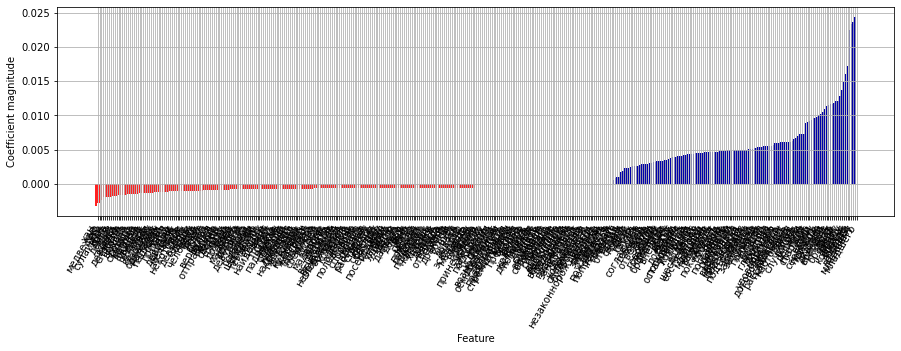

In [13]:
s_zahl = 200
import matplotlib.pyplot as plt
import mglearn
mglearn.tools.visualize_coefficients(
    grid.best_estimator_.named_steps["logisticregression"].coef_,
    feature_names,  n_top_features=s_zahl)
plt.grid()

In [14]:
n_zahl = 32
gio=(grid.best_estimator_.named_steps["logisticregression"].coef_[0])
n_top=np.argsort(gio)
text_pos=feature_names[n_top[-n_zahl:]]
text_neg=feature_names[n_top[0:n_zahl]]
print("Positive Merkmale:\n{}".format(text_pos))
print ("Negative Merkmale:\n{}".format(text_neg))

Positive Merkmale:
['случилось' 'вокруг' 'оба' 'решили' 'трое' 'пустили' 'старших' 'миг'
 'кони' 'ехали' 'середину' 'поймать' 'трижды' 'коня' 'пустим' 'сказали'
 'колодец' 'старшие' 'конь' 'брат' 'братьев' 'давай' 'овраг' 'брату'
 'колодцу' 'вскачь' 'братья' 'лошадь' 'брата' 'лошадей' 'младшему'
 'младшего']
Negative Merkmale:
['хан' 'медвежье' 'ухо' 'это' 'сулайман' 'тебе' 'дочь' 'лиса' 'домой'
 'сын' 'день' 'коней' 'девушка' 'жена' 'спросил' 'зулум' 'вместе' 'хана'
 'пошел' 'сказала' 'юноша' 'магома' 'отец' 'аждаха' 'увидел' 'пошли'
 'человек' 'царь' 'который' 'али' 'табулду' 'однажды']


In [15]:
import csv 
import shutil, os
filename = gesep
tit=(text_pos)
with open (filename+'.txt', 'wt', encoding='utf-8') as f:
    writer = csv.writer(f)
    writer.writerow(tit)


# erthaos - Vorhersage -Episode

In [16]:
#das gilt für den Aggregation der ungelabelte Episoden und Motive auch der Schatten nich
maerchen="" 
import xml.etree.ElementTree as ET
root_node = ET.parse('gesamt_märchen.xml').getroot()
for ganze in root_node.findall(".//{http://www.tei-c.org/ns/1.0}text"):
    if 'zyx_' in ganze.attrib['{http://www.w3.org/XML/1998/namespace}id']:
        for body in ganze.findall(".//{http://www.tei-c.org/ns/1.0}body"):
            for division in body.findall(".//{http://www.tei-c.org/ns/1.0}div"):
                for content in division.findall(".//{http://www.tei-c.org/ns/1.0}*"):
                    for decls in division.findall(".//{http://www.tei-c.org/ns/1.0}p"):
                        label=content.attrib['{www.dglab.uni-jena.de/kf}ana']
                        quelle=decls.attrib['decls'] 
                        inhalt=content.text
                        if not label.startswith(('e','m','f')):
                            maerchen+=quelle+'|'+label+'|'+inhalt+'|0'+'\n'
with open("text_roh.csv", 'w', encoding='utf-8') as f:
    f.write('quelle|index_string|episode|index_binar\n')
    f.write(maerchen)

In [17]:
fin = open('text_roh.csv','r', encoding ='utf-8')
fout = open('text_rein.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace("ä","ae").replace("ü","ue").replace("ö","oe").replace("ß","ss")
        .replace(",","").replace("«","").replace("»","").replace(".","").replace(":","")
        .replace(";","").replace('"',"").replace("?","").replace("!","").replace("á","a")
        .replace(",","").replace("\t"," ").replace("'","").replace("‹","").replace("›","")
        .replace("-"," ").replace("'('","").replace("')'","").replace('>','').replace("    "," ")
        .replace("   "," ").replace("  "," ").replace('–','').replace('—','').replace('<','').replace("Â", "A")
        .replace("ø", "oe").replace('“','').replace('„','').replace('(','').replace(')','').replace("‚", "")
        .replace ('|',',').replace('*','').replace("\n\n","\n").replace("=", ""))
fin.close()
fout.close()

In [18]:
import pandas as pd
from collections import Counter
df = pd.read_csv('text_rein.csv',  encoding='utf-8')
indexliste=Counter(df.index_string)
#print(indexliste, sep='\n')

In [19]:
import csv 
t_corpus = []
file = 'text_rein.csv'
with open(file, "r", encoding='utf-8') as maerchen:
    maerchen = df.episode
    reader = csv.reader(maerchen, delimiter = ",") 
    for row in reader:       
        lst = str(row)
        t_corpus.append(lst)

In [20]:
with open(filename+'.txt', 'r',encoding='utf-8') as file:
    file_contents = file.read().replace(",", " ").replace("\n", "")
    frt_contents = filename+',0'+','+file_contents+',0'
import os
os.remove(filename+'.txt')

In [21]:
row = [frt_contents]

with open("text_rein.csv", 'r',encoding='utf-8') as readFile:
    rd = csv.reader(readFile)
    lines = list(rd)
    lines.insert(1, row)

with open("text_rein.csv", 'wt',newline='',encoding='utf-8') as writeFile:
    wt = csv.writer(writeFile)
    wt.writerows(lines)

readFile.close()
writeFile.close()

fin = open('text_rein.csv','r', encoding ='utf-8')
fout = open('text_reich.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace('"', ''))
fin.close()
fout.close()

In [22]:
import csv 
from collections import Counter
df = pd.read_csv('text_reich.csv', encoding='utf-8')
indexliste=Counter(df.index_binar)
print(indexliste)
#entfernen('episode_temp_mess.csv')

t_corpus = []
file = 'text_reich.csv'
with open(file, "r", encoding='utf-8') as maerchen:
    maerchen = df.episode
    reader = csv.reader(maerchen, delimiter = "|") 
    for row in reader:       
        lst = str(row)
        t_corpus.append(lst)

Counter({0: 26750})


# CS

In [23]:
import csv 
t_corpus = []
file = 'text_reich.csv'
with open(file, "r", encoding='utf-8') as maerchen:
    maerchen = df.episode
    reader = csv.reader(maerchen, delimiter = ",") 
    for row in reader:       
        lst = str(row)
        t_corpus.append(lst)

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
vectorizer = TfidfVectorizer
vectorizers = vectorizer(analyzer='word', ngram_range=(1,1), 
                         min_df = 2, stop_words = ru)
vokabular =  vectorizers.fit_transform(t_corpus)
metrik = cosine_similarity
def find_similar(vokabular, index, top_n =-1):   
    metriks = metrik(vokabular[index:index+1], vokabular).flatten()
    related_docs_indices = [i for i in metriks.argsort()[::-1] 
                            if i != index]
    return [(index, metriks[index]) for index 
            in related_docs_indices][0:top_n]

In [25]:
n_te = 0
synt = t_corpus[n_te]
print(df.quelle[n_te],'-', synt)
#entfernen('Messdaten/'+'0_'+gesep+'.txt')

e550_ck_Krise - ['случилось вокруг оба решили трое пустили старших миг кони ехали середину поймать трижды коня пустим сказали колодец старшие конь брат братьев давай овраг брату колодцу вскачь братья лошадь брата лошадей младшему младшего']


In [26]:
for index, score in (find_similar(vokabular, n_te)):
        print(index,'-', score,'-', df.quelle[index],'-', 
           t_corpus[index], '-',  df.index_string[index],'-', df.index_binar[index],'\n' )

9011 - 0.4091054755391771 - zyx_aqc_rus_18 - ['Братья сказали Ну ладно давай хоть для веселья поскачем Тогда согласившись с ними он сел па копя Братья поставили его в середину Пустили они своих лошадей вскачь Столкнув младшего брата с лошади они чуть не убили его Старшие братья решили поймать койя Поймать они его не смогли'] - 0 - 0 

9010 - 0.38170751518744345 - zyx_aqc_rus_18 - ['брату говорят Давайте наших лошадей пустим вскачь Младший брат на это не согласился Он сказал Разве вы не знаете моей лошади Аоя лошадь за один миг трижды оборачивается вокруг света'] - 0 - 0 

552 - 0.21125419438100015 - zyx_ava_rus_3 - ['Старик сказал младшему брату'] - 0 - 0 

228 - 0.2090571322286767 - zyx_kum_rus_1 - ['Однажды дэвы сказали младшему из братьев'] - 0 - 0 

13128 - 0.2066781574277239 - zyx_nog_rus_39 - ['Стали братья думать как отомстить младшему брату и решили убить его жену '] - 0 - 0 

7729 - 0.20347579535429688 - zyx_kum_rus_26 - ['На следующий день старшие братья сказали'] - 0 - 0 

1

238 - 0.0847349959984523 - zyx_kum_rus_1 - ['Оставьте мои старшие братья я нашел похожего на себя сироту и привел его'] - 0 - 0 

1833 - 0.08468851084251053 - zyx_dar_rus_5 - ['Хорошо ответил брат'] - 0 - 0 

16529 - 0.08467179889916145 - zyx_kum_rus_37 - ['Конь и говорит юноше '] - 0 - 0 

17563 - 0.08458235249216439 - zyx_lez_rus_31 - [' Милая сестра я не знаю где твои братья ты спроси у табушцика который пасет лошадей'] - 0 - 0 

17554 - 0.08417688238623194 - zyx_lez_rus_31 - [' Где же мои братья '] - 0 - 0 

18116 - 0.08417688238623194 - zyx_lbe_rus_45 - [' Где мои братья '] - 0 - 0 

13879 - 0.08417438014195398 - zyx_khv_rus_11 - ['Прошло немного времени умер мельник Как следует похоронив отца трое сыновей решили смотреть на то что им оставил отец в наследство Старшему и среднему отец оставил по мерке золота с драгоценными камнями а младшему − деревянную маленькую шкатулку '] - 0 - 0 

19704 - 0.08413874227010831 - zyx_ava_rus_180 - ['Спустя некоторое время стало известно что за т

20826 - 0.06414187193415866 - zyx_ddo_rus_58 - ['Встали и оба отправились вместе в путъ в село Затем когда Магомед устал снова сели Ахмед сказал Найти бы тебе тут коня чтобы оседлать Ты что хочешь чтобы по дороге тебе дали коня Ты наверное ненормальный юноша  сказал ему Магомед'] - 0 - 0 

1516 - 0.06413839989213362 - zyx_lez_rus_5 - ['Что случилось отец почему ты такой грустный'] - 0 - 0 

12146 - 0.06413756082214529 - zyx_nog_rus_22 - ['В тот же миг перед ними вырос красивый дом а в нем накрытый стол Чего только нет на столе '] - 0 - 0 

448 - 0.06412861533309465 - zyx_lbe_rus_1 - ['Наконец Унсук ударил плетью своего коня и конь прыгнул прямо до окна но он не сумел схватить девушку Вслед за ним конь друга взлетел до четвертого этажа друг схватил дочь шаха подмышку и они помчались во весь опор Войска шаха пытались их задержать но кони Унсука и его друга топтали и убивали шахских воинов больше чем сами их хозяева Проложив себе дорогу они доскакали до моря Оттуда быстро уплыли грудью ко

13826 - 0.05260840671382469 - zyx_khv_rus_9 - ['Тут встал младший сын в середине двора и вытащил волоски коней Потёр он красный  появился алый как кровь конь с красным седлом и с красными хурджунами потёр он чёрный  появился чёрный как уголь конь с чёрным седлом и чёрными хурджунами потёр он белый  появился белый как снег конь с белым седлом и белыми хурджунами Встав на дыбы выдыхая огонь из ноздрей ржали кони '] - 0 - 0 

10660 - 0.052496845709261 - zyx_ava_rus_116 - [' Давайте братья работать сообща предложил младший брат мельница у нас исправная и дела пойдут хорошо'] - 0 - 0 

19703 - 0.052481812807335715 - zyx_ava_rus_180 - [' Что случилось Девицу увез всадник на сером коне чтоб ему свет горек сделался Если бы не он была бы девица наша  отвечали братья '] - 0 - 0 

21916 - 0.05244359000400004 - zyx_ttt_rus_23 - ['Когда детям исполнилось по четырнадцать лет им сказали что они наречены быть мужем и женой Еще крепче полюбили друг друга двоюродные брат и сестра'] - 0 - 0 

10252 - 0.0

2750 - 0.04481965847147227 - zyx_dar_rus_9 - ['Сказав так одна из лучших лошадей подошла к ней дала ей в руки кнут и сказала Оседлай меня и гони меня'] - 0 - 0 

21197 - 0.04481293486646237 - zyx_ddo_rus_92 - ['Были говорят или не были семеро братьев у них была еще одна сестра Родители не выпускали на улицу одну единственную дочь Однажды к родителям дочери пришли девочки Пустите ее поиграть с нами Они отпустили ее вместе с ними так как те девочки были ее сверстницы Когда они играли неизвестно откуда появился девятиглавый дракон и забрал одну единственную дочь родителей среди семи братьев Родители и семеро братьев пришли в отчаяние'] - 0 - 0 

21518 - 0.04477062365928468 - zyx_ttt_rus_18 - [' А где же сын и дочь падишаха  забеспокоился Рустам Сел он на своего коня и поскакал искать сына и дочь падишаха Три дня и три ночи искал он юношу и девушку но так и не смог найти На четвертое утро нашел он их под одним деревом В пылу сражения брат поразил сестру сестра  брата Погоревал Рустам похор

23324 - 0.03896489712146143 - zyx_ttt_rus_33 - ['Затем хлестнул своего коня и ускакал'] - 0 - 0 

1658 - 0.03895367221678101 - zyx_ava_rus_6 - ['Долго он ехал и наконец попал туда где сражались ее братья'] - 0 - 0 

20836 - 0.0389396623952138 - zyx_ddo_rus_59 - ['На обратном пути орел спросил Видишь ли ты что нибудь Что то вроде дыма видно сказал охотник Там мой старший брат Он тебя спросит что тебе дать за спасение брата Ты скажи что тебе кроме той сумки ничего не надо что другой подарок не возьмешь'] - 0 - 0 

7946 - 0.03893652216777713 - zyx_kum_rus_27 - ['Кто же за угли дает золото сказали разозлились люди и избили их'] - 0 - 0 

15705 - 0.03891255350819071 - zyx_lbe_rus_34 - ['Унсук испугался и подумал Что это за девушка которая бьет таких сильных братьев '] - 0 - 0 

7799 - 0.03889855340698314 - zyx_lbe_rus_16 - ['Жили не жили в одном ауле жили два брата Одного брата звали Ярахмед другого Караахмед У них была мать Отец умер рано Ярахмед был умный а Караахмед глупый'] - 0 - 0 

12

18536 - 0.03438801391359924 - zyx_lez_rus_36 - ['На его зов вышли двое Один взял его лошадь под уздцы а другой показал куда идти Как только он ступил в комнату сразу провалился в глубокую яму '] - 0 - 0 

17414 - 0.03437500296279252 - zyx_lez_rus_30 - [' Нет брат ты не прав Женись на ней она очень хорошая девушка '] - 0 - 0 

11608 - 0.03436856536504901 - zyx_nog_rus_17 - ['Наступил вечер В доме стало темно и тут дурак вытащил из за пазухи золотое перышко Сразу вокруг все осветилось '] - 0 - 0 

1945 - 0.03436689934316831 - zyx_lez_rus_6 - ['У тебя было семь братьев милая дочка когда от них как и от тебя мальчики отвернулись потому что у них не было сестры они ушли из этих мест'] - 0 - 0 

8395 - 0.03436327799325828 - zyx_rut_rus_12 - ['Младший брат содрал с его спины кожу'] - 0 - 0 

11674 - 0.03435900848145232 - zyx_nog_rus_17 - [' Этому горю можно помочь отвечает волк Я обернусь Золотоволосой и ты отведешь меня к хану и обменяешь на лошадь Потом вы уезжайте а я догоню вас '] - 0 - 0

10189 - 0.03077623787233156 - zyx_ava_rus_109 - ['Поколебавшись купеческий сын согласился и все устроились на ночлег Лишь юноша остался у костра Он закутался в бурку и внимательно смотрел вокруг не подойдет ли лихой человек или зверь какой'] - 0 - 0 

22401 - 0.03077431877463889 - zyx_ttt_rus_27 - ['Пришпорил тогда младший сын своего коня и проехал по мужчинам'] - 0 - 0 

22388 - 0.030764357165428302 - zyx_ttt_rus_27 - [' Мой верный конь я хочу отправиться на тот свет к матери и спросить где она спрятала ключ Как ты относишься к моему желанию'] - 0 - 0 

1994 - 0.03074923227113729 - zyx_lez_rus_6 - ['В это время семеро братьев проходили мимо и услышав что отвечали мальчики на кваканье лягушки подошли к братьям и попросили'] - 0 - 0 

1828 - 0.030725600026511066 - zyx_dar_rus_5 - ['Мой брат не ешь кашу приготовленную моей матерью'] - 0 - 0 

13844 - 0.03072275341619562 - zyx_khv_rus_9 - ['Одевшись под цвет своих коней сев на них стали они втроём впереди следом в украшенной ханской карет

5479 - 0.026848506389281757 - zyx_lez_rus_15 - ['А теперь здесь когда мы подошли к вам вы погладили бороду и этим сказали Ты маленький и поэтому не переспоришь меня Я ответил вам погладив голову Ум не в бороде а в голове Вот и все что я видел закончил свой рассказ мальчик'] - 0 - 0 

20553 - 0.026834301039004093 - zyx_ddo_rus_20 - ['Хан огорчился и не знал что делать как поступитъ Как то он собрал всех мужчин живущих в его царстве Когда он обратился к ним все опустив головы стояли молча Потом дочь хана пошла к Мусе и рассказала о случившемся Муса обрадовался поцеловал дочь хана в лоб и сказал Я сяду на коня если ты со мной сядешь Девушка дала согласие Быстро побежав к отцу она успела только сказать Даешь ли ты согласие чтобы парень который сидит в тюрьме сел на этого коня Хан встал чтобы побить ее Затем немного подумав приказал чтобы к нему привели парня который сидит в тюрьме Хаи завел об этом разговор и паренъ согласился Перед тем как сесть на коня юноша сказал хану Сначала ты с доче

546 - 0.023575960005409513 - zyx_ava_rus_3 - ['Средний брат взял мешок лгал рассказывая всякие небылицы и отдал старику'] - 0 - 0 

18962 - 0.023570091252938775 - zyx_ava_rus_143 - ['Нохоронил отец своих сыновей в ущелье и нпощел в дом брата ожидать там прихода своего врага Тихо крадучись вошел юноша в родной дом Старик бросился к пему схватил его за руку и крикнул в отчаянны '] - 0 - 0 

607 - 0.023568190625535626 - zyx_ava_rus_3 - ['Ты убил моего мужа теперь уже некому прийти за мной расскажи мне без утайки где ты достал трехногого коня'] - 0 - 0 

19789 - 0.023568190625535626 - zyx_ava_rus_180 - [' Ты убил моего мужа теперь уже за мной некому прийти Но расскажи мне без утайки где ты достал трехногого коня '] - 0 - 0 

21283 - 0.023555822101984304 - zyx_ttt_rus_17 - ['Когда он подъехал к Рустаму и сошел с коня Рустам положил руку на спину скакуна Спина у жеребца согнулась еще чуть чуть и она моглабы сломаться'] - 0 - 0 

874 - 0.02355464096646115 - zyx_ava_rus_4 - ['Обрадовался пачах

20556 - 0.02142180122725965 - zyx_ddo_rus_20 - ['Муса один раз ударил плетью деревянный конь как ветер понесся по воздуху и доставил их в село отца девушки Хан очень обрадовался что исполнив его желание обратно вернулись здоровыми дочь и бедный юноша который помог ему в горе'] - 0 - 0 

4644 - 0.021415517985203476 - zyx_aqc_rus_3 - ['Только было собрались поставив поднос поесть хинкалы вдруг резко открыв дверь зашла Алай Муминат бабушка испугавшись подскочила Что случилось кто умер почему пришла сказала бабушка '] - 0 - 0 

561 - 0.02137996364326218 - zyx_ava_rus_3 - ['Клянусь Аллахом сын мой я только знаю что есть на свете Черный нарт но мне неведомо где он обитает и как его найти Теперь тебе остается надеяться только на твою удаль и удачу но даже если ты и найдешь свою жену она тебе не достанется Послушался бы моего совета и беды бы не случилось'] - 0 - 0 

2083 - 0.021355568765872072 - zyx_lez_rus_7 - ['Джан сынок у меня семеро сыновей Если они сейчас вернутся и увидят тебя они тебя

24592 - 0.01745492439733053 - zyx_ttt_rus_49 - ['Много дней и ночей шел отряд по следам разбойииков Наконец те добрались до своего города и вошли в лавку где томился в плену падишах А его жена возле лавки сошла с коня и сказала своей свите'] - 0 - 0 

13630 - 0.017453953015723445 - zyx_khv_rus_3 - ['Вдруг с потолка начали сыпаться деньги Глядя на деньги не понимая во сне это происходит или наяву правда это или неправда оглядываясь вокруг женщина увидела что на потолке чтото движется и потеряла сознание Пришёл муж и увидел жену лежащую на полу без чувств и обсыпанную деньгами и плачущего сына Он привёл её в чувства быстро собрал деньги спрятал их и успокоив сына попросил жену объяснить что произошло '] - 0 - 0 

1080 - 0.017446727141066206 - zyx_dar_rus_2 - ['Ох мой брат Пяху Али я слышала о тебе Много таких как ты приходили сюда и они как и ты звали меня но я не откликнулась и они замерзли Поднимись ко мне сказала Жами и впустила Али в дом'] - 0 - 0 

26679 - 0.017434633405736814 - zyx

11035 - 0.013064773943330605 - zyx_tab_rus_37 - ['Жим был один царь Шах Абае У него был брат Молла Насреддин У царя была дочь Одни юноша полюбил эту девушку Это юноша пришел царю просить руки дочери Царь сказал Если в эту ночь с вечера до утра останешься голым на крыше отдам дочь если в мире с крыши ты увидишь свет скажи мне Дочь пе отдам'] - 0 - 0 

20577 - 0.013027121603193009 - zyx_ddo_rus_25 - ['Затем к этой ханской дочери пошел свататься средний брат мол стань моей женой Ему она тоже сказала что выйдет если тот даст ей мерку золота Пришел и тот юноша с меркой золота чтобы получить ее согласие Получив золото ханская дочъ не дала согласия выйти за пего и прогнала Теперь все пи к чему сказал о и и тоже пошел по свету'] - 0 - 0 

4633 - 0.013007137283901717 - zyx_aqc_rus_2 - ['Арчинец начал эксплуатировать подвергать мучениям народ Увидев его жестокость не выдержав гнета все кто работал у нового хана ушли На третий день хан сказал Ты возьми коня оружие возьми сколько хочешь золота и с

8527 - 0.0 - zyx_nog_rus_7 - ['Хорошо сказало дерево'] - 0 - 0 

8523 - 0.0 - zyx_nog_rus_7 - ['Хорошо говорит дерево услышав желание старухи'] - 0 - 0 

11653 - 0.0 - zyx_nog_rus_17 - ['Юноша рассказал обо всем Упомянул и о хане обладателе золотой птицы '] - 0 - 0 

12233 - 0.0 - zyx_nog_rus_23 - ['Люди указывают на юношу '] - 0 - 0 

8533 - 0.0 - zyx_dar_rus_34 - ['Хотим конечно же заходи заходи сказав так они усадили его Ну что ты можешь угадать покажи попросили люди и стали его слушать'] - 0 - 0 

8532 - 0.0 - zyx_dar_rus_34 - ['Не хотите ли гадальщика'] - 0 - 0 

8531 - 0.0 - zyx_dar_rus_34 - ['Неся смолотую муку на спине и ворону в руке Чалтукхан пошел домой Оставив муку взяв с собой ворону он отправился в другое село Остановился у одного дома и стал заглядывать в приоткрытую дверь Он увидел как находящиеся в доме люди готовили разные кушанья и откладывали их в сторону Чалтукхан проследил куда уносят кушанья потом тихо вошел в дом и обращаясь к хозяевам спросил'] - 0 - 0 

8530 -

7529 - 0.0 - zyx_lez_rus_22 - ['Эй хозяин каравана здесь воды не бывает'] - 0 - 0 

7530 - 0.0 - zyx_lez_rus_22 - ['Вон там сынок видна вода но стоит эта вода очень дорого у нас нет столько денег чтоб ее купить ответил караванщик'] - 0 - 0 

7531 - 0.0 - zyx_lez_rus_22 - ['Дайте мне бурдюк я схожу за водой сказал нукер Взяв бурдюк он отправился за водой'] - 0 - 0 

8422 - 0.0 - zyx_lbe_rus_19 - ['Однажды они вдвоем упрямая женщина и пастух пошли на свое поле Проходя мимо чужого поля пастух ей говорит'] - 0 - 0 

8421 - 0.0 - zyx_lbe_rus_19 - ['Хорошо сказал пастух первой У меня красть нечего если захочешь кушать иди в погреб и ешь сколько хочешь Хорошо сказал он второй я вместо окна поставлю дверь и когда буду стучаться ты выводи любовника через вторую дверь чтобы я его не видел Хорошо найдем и для тебя что нибудь сказал третьей'] - 0 - 0 

7532 - 0.0 - zyx_lez_rus_22 - ['А у этого родника сидел аждаха Он обратился к аждахе'] - 0 - 0 

8420 - 0.0 - zyx_lbe_rus_19 - ['Я очень упрямая Бо

7392 - 0.0 - zyx_lez_rus_21 - ['Кричи как осел'] - 0 - 0 

7393 - 0.0 - zyx_lez_rus_21 - ['Иа иа иа'] - 0 - 0 

7394 - 0.0 - zyx_lez_rus_21 - ['Вой как волк'] - 0 - 0 

7395 - 0.0 - zyx_lez_rus_21 - ['О о ва о о ва о о ва'] - 0 - 0 

12241 - 0.0 - zyx_nog_rus_24 - ['На следующий год бай послал стеречь кобылу среднего сына Но и тот вернулся ни с чем '] - 0 - 0 

7400 - 0.0 - zyx_ttt_rus_10 - ['Этот пепел на голову того кто доверит свою тайну жене А этот на голову того кто возьмет взаймы деньги у человека который разбогател недавно А вот этот пепел на голову того кто длительное время служит одному государю'] - 0 - 0 

11635 - 0.0 - zyx_nog_rus_17 - ['Тогда юноша вложил саблю в ножны и рассказал волку о том кто он такой и что привело его сюда '] - 0 - 0 

7568 - 0.0 - zyx_lez_rus_22 - ['Люди принадлежит ли эта коса той девушке'] - 0 - 0 

8562 - 0.0 - zyx_dar_rus_29 - ['Вдруг невдалеке он увидел рой мух Подойдя к тому месту где были мухи он со всей силой ударил по ним своей длинной и глад

12138 - 0.0 - zyx_nog_rus_22 - [' Дай серую кобылицу из табунов '] - 0 - 0 

7731 - 0.0 - zyx_kum_rus_26 - ['Через некоторое время приходит медведь и говорит'] - 0 - 0 

8040 - 0.0 - zyx_nog_rus_6 - ['Ты смотри сын мой воскликнул старик На земле всего три верных спутницы две из них замужем а у третьей завтра свадьба Иди на эту свадьбу и скажи что попало тогда жених сын хана забеспокоится и с мансарды закричит Не слушайте этого щедрого на слова чудака ешьте веселитесь Разве нечего есть что ты даешь людям грызть кости Вот если бы я играл свадьбу то гостей угощал бы фруктами скажи ты тогда Если ты готов играть свадьбу я отдам тебе в жены свою невесту пообещает побледнев ханский сын'] - 0 - 0 

11963 - 0.0 - zyx_nog_rus_20 - [' Повелительница джиннов Сарыгыз выйди сюда '] - 0 - 0 

8039 - 0.0 - zyx_nog_rus_6 - ['Мне не надо богатства я ищу верную спутницу ответил третий'] - 0 - 0 

8038 - 0.0 - zyx_nog_rus_6 - ['А тебе что нужно сынок поглаживая лицо руками спросил старик у третьего юноши'

11805 - 0.0 - zyx_nog_rus_19 - ['Юноша тут же улегся под арбой и заснул а когда проснулся все сорок ароб были полны дров '] - 0 - 0 

8227 - 0.0 - zyx_lbe_rus_18 - ['Что ты знаешь волк спросил медведь'] - 0 - 0 

7597 - 0.0 - zyx_tkr_rus_4 - ['Есть один бедный парень Он ленив настолько что из дома никуда не выходит Кушать ему приносит старая мать она же и одевает его Дом их находится на краю селения ответили на вопрос сидящие на годекане мужчины'] - 0 - 0 

8226 - 0.0 - zyx_lbe_rus_18 - [' Я знаю что если взять лист дерева которое растет недалеко от мельницы и провести по глазам слепого то он будет видеть'] - 0 - 0 

12199 - 0.0 - zyx_nog_rus_23 - ['Однажды вазиры говорят хану '] - 0 - 0 

11806 - 0.0 - zyx_nog_rus_19 - ['Когда Шаар Солтан вернулся живым и невредимым к аздаа да еще привез сорок ароб дров тот понял что его не так то легко погубить Разожгу ка я костер из сорока ароб дров и брошу Шаар Солтана на уголья Уж тогда то он сгорит заживо решил аздаа И вот он приказал развести ог


8193 - 0.0 - zyx_lbe_rus_17 - [' Я ее очень любил верил ей но она оказалась коварной В мое отсутствие она изменила мне Я не мог этого вынести и бросил ее в реку ответил ей хан'] - 0 - 0 

8192 - 0.0 - zyx_lbe_rus_17 - ['Она вызвала хана и спросила почему он бросил свою жену в реку'] - 0 - 0 

7637 - 0.0 - zyx_tkr_rus_4 - ['Ахмед не мог поверить увиденному'] - 0 - 0 

7638 - 0.0 - zyx_tkr_rus_4 - ['На самом деле это дом Ахмеда спрашивает он'] - 0 - 0 

12185 - 0.0 - zyx_nog_rus_23 - ['Юноша согласился и остался у старика На другой день юноша пошел на охоту и настрелял много дичи '] - 0 - 0 

11877 - 0.0 - zyx_nog_rus_19 - ['Так Шаар Солтан и Шаархан встретились снова '] - 0 - 0 

11863 - 0.0 - zyx_nog_rus_19 - ['На следующий день женихи снова пришли к девушке и на этот раз с ними был Шаар Солтан Шаархан сразу узнала его но не подала виду А Шаар Солтан не узнал девушку ведь он думал что она утонула '] - 0 - 0 

11864 - 0.0 - zyx_nog_rus_19 - ['Между тем голубь поднялся и улетел Через не

10009 - 0.0 - zyx_ava_rus_85 - [' Восемьдесят мне'] - 0 - 0 

10010 - 0.0 - zyx_ava_rus_85 - [' А через сколько лет можно будет есть плоды с дерева которое ты сажаешь'] - 0 - 0 

10011 - 0.0 - zyx_ava_rus_85 - [' Через сорок лет ответил старик'] - 0 - 0 

10012 - 0.0 - zyx_ava_rus_85 - [' Так неужели ты надеешься прожить еще сорок лет и насладиться этими плодами спросил прохожий'] - 0 - 0 

10013 - 0.0 - zyx_ava_rus_85 - [' Нет Я уже насладился плодами деревьев посаженных отцами а плодами посаженного мною дерева насладятся наши дети ответил старик'] - 0 - 0 

10014 - 0.0 - zyx_ava_rus_87 - ['Однажды студеной зимой когда солнечные лучи не согревают землю и наступает царство холода возгордился окрепший лед'] - 0 - 0 

10015 - 0.0 - zyx_ava_rus_87 - [' Что мне солнце Оно уже бессильно против меня Вот и самое время засватать его дочь за моего сына Мало сказать нужно и делать'] - 0 - 0 

10016 - 0.0 - zyx_ava_rus_87 - ['И послал лед сватов к солнцу'] - 0 - 0 

10017 - 0.0 - zyx_ava_rus_87 -

10956 - 0.0 - zyx_tab_rus_22 - ['Когда прошел немного он вернулся обратно Он своему отцу Лекарство не нашел сказал'] - 0 - 0 

10954 - 0.0 - zyx_tab_rus_22 - ['Однажды царю приснился сон Во сне ему приснилась девушка Утром встал и пошел искать эту девушку У паря ослепли глаза Вернувшись царь приткел домой Своим сыповьям он сказал Ищите мне лекарство я ослеп'] - 0 - 0 

10953 - 0.0 - zyx_tab_rus_22 - ['Младший нас кобыл Среди кобыл был один хороший жеребенок Жеребенок был хорошим скакуном'] - 0 - 0 

10948 - 0.0 - zyx_tab_rus_21 - [' Вот жема принес стоимость нашего быка взяв у собак'] - 0 - 0 

9771 - 0.0 - zyx_ava_rus_72 - [' Он очумел этот аварец закричал куса Где это видано чтобы за такого осла просили столько денег'] - 0 - 0 

10952 - 0.0 - zyx_tab_rus_22 - ['Был пе был один царь  этого паря было три сына'] - 0 - 0 

9772 - 0.0 - zyx_ava_rus_72 - [' Он не простой Не успеешь сказать бисмилла как его хозяин наживет кучу денег Ведь он извергает чистое серебро Я его украл у самого туре

10462 - 0.0 - zyx_ava_rus_115 - ['Но не прошло и полугода как огромная змея захватила единственный в городе источник и никого не подпускала к воде Не находилось ни одного джигита который бы отважился прогнать чудовище Смельчаку была обещана награда ханская дочь и несметные сокровища'] - 0 - 0 

10463 - 0.0 - zyx_ava_rus_115 - ['Тогда уздень смело направился к источнику Подивился он что маленькая змея так скоро выросла и напомнил об уговоре'] - 0 - 0 

10464 - 0.0 - zyx_ava_rus_115 - [' Я сдержу свое слово и покину этот город но если ты еще раз придешь ко мне с подобной просьбой то будешь убит и с этими словами чудовище удалилось'] - 0 - 0 

10465 - 0.0 - zyx_ava_rus_115 - ['Не было предела радости горожан и они потребовали от хана выдать дочь за героя Хану ничего не оставалось как согласиться Сыграли пышную свадьбу и стал уздень жить припеваючи'] - 0 - 0 

10467 - 0.0 - zyx_ava_rus_115 - [' Возле единственного в городе источника поселилась ужасная змея Никому не дает она воды Слыхали м

8992 - 0.0 - zyx_ddo_rus_3 - [' Нет пет ты вставай сказал волк медведю'] - 0 - 0 

9030 - 0.0 - zyx_ddo_rus_6 - ['Младший юноша купил в магазине зеркало стекло в которое смотрятся При покупке спросил он Покупаю я это за три рубля но что за особенность у этого зеркала Оно это способно сделать следующее если любимая тебе женщина находится далеко на расстоянии трех месяцев ходьбы //езды и посмотришь в это зеркало то увидишь ты се'] - 0 - 0 

8991 - 0.0 - zyx_ddo_rus_3 - [' Вставай посмотри в чан'] - 0 - 0 

11315 - 0.0 - zyx_nog_rus_12 - ['На третий день пошла пасти козу младшая дочь '] - 0 - 0 

11314 - 0.0 - zyx_nog_rus_12 - ['Услышав эти слова старик и среднюю дочь выгнал из дому '] - 0 - 0 

8978 - 0.0 - zyx_ddo_rus_2 - ['Раз оказывается оп встретил человека который убивал змею Сейчас тому человеку бездельник он не дал возможности не пустил  убить гу змею Тогда эта змея сказала этому бездельнику Парень чего ты от меня хочешь Чего ты хочешь я все исполню тебе Змея вырвав свой волос отд

8819 - 0.0 - zyx_tkr_rus_5 - ['Разве в горах мало камней для чего ты везешь их туда спросил Фалый'] - 0 - 0 

11445 - 0.0 - zyx_nog_rus_14 - ['Бермес в это время была наверху и увидела Яурынтака '] - 0 - 0 

8820 - 0.0 - zyx_tkr_rus_5 - ['Я в Кахи на базаре купил четыре больших арбуза Один арбуз положил в одну суму три арбуза в другую Сума с тремя арбузами оказалась тяжелее чем с одним Поэтому для равновесия я положил в нее еще два больших камня Конечно же в горах эти камни не нужны'] - 0 - 0 

11444 - 0.0 - zyx_nog_rus_14 - [' Здесь живет дочь Алмас хана Бермес говорит орел '] - 0 - 0 

11443 - 0.0 - zyx_nog_rus_14 - ['Яурынтак сел на спину орлу и они полетели Вскоре они прилетели к дому в несколько этажей '] - 0 - 0 

11441 - 0.0 - zyx_nog_rus_14 - [' Пусть погибну И там смерть и здесь смерть '] - 0 - 0 

11436 - 0.0 - zyx_nog_rus_14 - [' Теперь привези дочь Алмас хана Бермес '] - 0 - 0 

11440 - 0.0 - zyx_nog_rus_14 - [' Пойдешь за ней погибнешь говорит орел '] - 0 - 0 

8822 - 0.0 

11080 - 0.0 - zyx_agx_rus_35 - ['Ему бросили без одной сто золотых монет в мешочке Он вынув посчитал Там было без одной сто золотых монет'] - 0 - 0 

11081 - 0.0 - zyx_agx_rus_35 - ['Молл а Насреддин сказал Тогда мне дававший рукой давал теперь дающий дает мне в мешочке Вместо одной золотой монеты пусть будет этот мешочек'] - 0 - 0 

9404 - 0.0 - zyx_ava_rus_54 - ['Отчаявшись звери совершили набег на аул и утащили осла козла и ягненка'] - 0 - 0 

9398 - 0.0 - zyx_ava_rus_53 - [' Отпустите меня ради маленьких птенцов взмолилась кукушка Пусть мои ноги будут всегда покрыты грязью но чистить озеро в следующий раз я прилечу первой'] - 0 - 0 

9399 - 0.0 - zyx_ava_rus_53 - ['Птицы сжалились над ней и с тех пор кукушка первой приходит чистить водоемы'] - 0 - 0 

9400 - 0.0 - zyx_ava_rus_54 - ['Встретились как то лев волк и лиса'] - 0 - 0 

9401 - 0.0 - zyx_ava_rus_54 - [' Давайте жить сообща предложил лев Будем вместе охотиться и вместе делить добычу'] - 0 - 0 

9402 - 0.0 - zyx_ava_rus_54 - 

9346 - 0.0 - zyx_ava_rus_49 - [' Давайте сделаем вид что мы с ним примирились Пригласим его в гости напоим накормим и убьем'] - 0 - 0 

9348 - 0.0 - zyx_ava_rus_49 - ['Вскоре пришли кот и лиса и начали пировать'] - 0 - 0 

9349 - 0.0 - zyx_ava_rus_49 - ['Вдруг в кустах раздался слабый шорох Уж не мышь ли это подумал кот и мгновенно прыгнул в кусты где скрывался волк От неожиданности волк испугался закричал и бросился бежать а за ним и медведь и кабан и лиса Долго бежали они а когда остановились начали думать что делать'] - 0 - 0 

11109 - 0.0 - zyx_agx_rus_39 - [' Пошел положил голову под жернов Лиса пошла пустила воду Мельница завертелась заработала У волка с головы содрало кожу'] - 0 - 0 

9350 - 0.0 - zyx_ava_rus_49 - [' Давайте уйдем подальше от этого опасного зверя сказал волк Ведь он житья нам не даст'] - 0 - 0 

11108 - 0.0 - zyx_agx_rus_39 - [' Лиса была на мельнице Лисе волк сказал Где мои дети Лиса сказала волку Я твоих детей нс видела я привыкла быть мельником Волк сказал ли

2785 - 0.0 - zyx_lez_rus_8 - ['Джан сестра дай немного закваски для теста'] - 0 - 0 

2786 - 0.0 - zyx_lez_rus_8 - ['Вон там джан сестра иди возьми'] - 0 - 0 

2787 - 0.0 - zyx_lez_rus_8 - ['Принеси ты сестра я не могу дойти туда сказала плешивая'] - 0 - 0 

2788 - 0.0 - zyx_lez_rus_8 - ['Девушка пошла за закваской Плешивая воду с платком вылила на крышу своего дома налила в таз другую воду'] - 0 - 0 

2789 - 0.0 - zyx_lez_rus_8 - ['Взяв закваску плешивая ушла Девушка постирала платок сперва вылила воду на свою крышу потом на крышу соседки На ее крыше выросли кусты держидерева а на крыше соседки выросли розы'] - 0 - 0 

2790 - 0.0 - zyx_lez_rus_8 - ['Через некоторое время пришли сваты от Читали забрать девушку'] - 0 - 0 

2792 - 0.0 - zyx_lez_rus_8 - ['О Аллах пусть мой отец превратится в черного змея обитающего в кустах держидерева а я в сизую голубку летающую в синем небе'] - 0 - 0 

2860 - 0.0 - zyx_lbe_rus_4 - ['Ой барчаман медовая река сказала девушка и выпила глоток воды а когда 

2351 - 0.0 - zyx_kum_rus_6 - ['Девушка обернула камень в вату и положила в сундук'] - 0 - 0 

2352 - 0.0 - zyx_kum_rus_6 - ['Так жили они три года Жена ни днем ни ночью не давала житья мужу говорила'] - 0 - 0 

2353 - 0.0 - zyx_kum_rus_6 - ['Из за тебя твой друг превратился в камень если в мире есть оживляющее снадобье для него ты должен найти его'] - 0 - 0 

2356 - 0.0 - zyx_kum_rus_6 - ['Энем пойдем на свадьбу'] - 0 - 0 

2413 - 0.0 - zyx_ava_rus_9 - ['Когда утром отец с сыном пошли пасти коров снова на ветке дерева появилась птичка и произнесла те же слова'] - 0 - 0 

2357 - 0.0 - zyx_kum_rus_6 - ['Когда энем сказала что у нее гость шайтан говорит'] - 0 - 0 

2358 - 0.0 - zyx_kum_rus_6 - ['Знаю сын друг такого то торговца превратился в камень и он выехал искать для него лекарство'] - 0 - 0 

2359 - 0.0 - zyx_kum_rus_6 - ['Его вылечить можно спрашивает энем'] - 0 - 0 

2360 - 0.0 - zyx_kum_rus_6 - ['Шайтан говорит'] - 0 - 0 

2361 - 0.0 - zyx_kum_rus_6 - ['Можно у них есть двухлетний

3646 - 0.0 - zyx_dar_rus_10 - ['Внезапно он очутился в густом лесу и увидел дерево на котором росли яблоки величиной с ослиную голову Иногда таким невезучим как я тоже везет подумав так он сорвал одно яблоко и начал есть Только он съел яблоко как у него сильно разболелась голова и на ней выросло дерево под тяжестью которого он не мог удержаться на ногах Я никому ничего плохого не сделал за что мне такое наказание подумав так он горько заплакал и посмотрел на дерево И тут он увидел что между большими яблоками растут совсем маленькие и горькие Парень сорвал и съел одно яблоко и дерево тут же исчезло'] - 0 - 0 

3702 - 0.0 - zyx_rut_rus_5 - ['Жена расплакалась Потом стала рассказывать'] - 0 - 0 

3647 - 0.0 - zyx_dar_rus_10 - ['Ага я поступлю с ними так же как они со мной подумал парень Взял два три больших яблока несколько маленьких и отправился домой поменял одежду и пришел в город Купите яблоки купите яблоки стал кричать он Дочь талхана посмотрела в окно и увидев яблоки необыкновенной 

3361 - 0.0 - zyx_tab_rus_4 - ['На следующую ночь сельчане были приглашены к беку прясть шерсть Там было много женщин Туда были приглашены старуха и Периханум В комнате с женщинами сидели ее мачеха и Айханум Рядом с Айханум стояла люлька сделанная из соснового дерева Зирк зизрик плешивая девушка Зирк зизрик плешивая девушка '] - 0 - 0 

3362 - 0.0 - zyx_tab_rus_4 - ['скрипела люлька когда ее качали'] - 0 - 0 

3364 - 0.0 - zyx_tab_rus_4 - ['Нет пусть никто никуда не выходит Оставайтесь там где сидите'] - 0 - 0 

3365 - 0.0 - zyx_tab_rus_4 - ['Когда она закончила рассказ бек поняв что произошло посадил мачеху и ее дочь на двух вороных коней и погнал кнутом'] - 0 - 0 

3366 - 0.0 - zyx_tab_rus_4 - ['Сын бека женился на Периханум Сыграли большую свадьбу Периханум ее муж и старуха с которой она пришла стали жить припеваючи и я тоже вернулся к себе домой'] - 0 - 0 

3367 - 0.0 - zyx_kum_rus_7 - ['В одном ауле жил один мужчина У этого мужчины умерла жена и осталась одна дочь По соседству с ни

1038 - 0.0 - zyx_dar_rus_2 - ['В одном селе в одном городе у одних бедных родителей был сын по имени Пяху Али’ Люди не знали что Пяху Али был очень сильным парнем Чтобы содержать себя и родных он работал у людей был таким сильным что ударом кулака мог убить животное'] - 0 - 0 

1036 - 0.0 - zyx_kum_rus_3 - ['Тогда парень бросил обе каменные головки от веретена сказав Пусть эти две головки веретена превратятся в два больших мельничных жернова раздавят и убьют двух сестер вместе с их ишаками Падающие сверху головки веретена превратились в два больших мельничных жернова и убили аждахов раздавив их'] - 0 - 0 

1014 - 0.0 - zyx_kum_rus_3 - ['Не унесу ты меня называла гнойной рекой она назвала рекой роз и переходя попила из меня говорит гнойная река'] - 0 - 0 

1035 - 0.0 - zyx_kum_rus_3 - ['Появились два высоких дерева Когда они почти взобрались на деревья подоспели обе аждахи и тоже начали взбираться на деревья'] - 0 - 0 

1015 - 0.0 - zyx_kum_rus_3 - ['Унеси ее кровавая река говорит кричи

82 - 0.0 - zyx_ttt_rus_1 - ['Когда девушка переоделась Рустом осторожно опустил ее вниз а сам надел свадебный наряд невесты и стал ждать прихода жениха'] - 0 - 0 

86 - 0.0 - zyx_ttt_rus_1 - ['Хватит плакать давайте лучше поедим'] - 0 - 0 

87 - 0.0 - zyx_ttt_rus_1 - ['Поели они сытно и легли спать'] - 0 - 0 

88 - 0.0 - zyx_ttt_rus_1 - ['Пусть молодые люди видят сладкие сны а я вам поведаю о том что делается во дворце падишаха Чиме чина'] - 0 - 0 

89 - 0.0 - zyx_ttt_rus_1 - ['Когда сын падишаха вошел в комнату своей невесты его друзья остались за дверью в ожидании жениха Долго ждали они но жених все не выходил из комнаты Тогда один из них не выдержал и постучался в дверь Ответа не было Постучали все поочередно опять молчание'] - 0 - 0 

90 - 0.0 - zyx_ttt_rus_1 - ['Пришли тогда друзья жениха к падишаху Чиме чина Понял падишах что здесь что то неладно Он прибежал к комнате невесты и приказал друзьям сына взломать дверь Те мигом взломали дверь и вместе с падишахом вошли в комнату А в к

1682 - 0.0 - zyx_ava_rus_6 - ['Отыскав муллу и свидетелей Исмаил обвенчался с Арабузан'] - 0 - 0 

1683 - 0.0 - zyx_ava_rus_6 - ['Ночью когда легли спать Исмаил положил свою саблю между собой и Арабузан и сказал'] - 0 - 0 

1684 - 0.0 - zyx_ava_rus_6 - ['Если твое платье коснется сабли твоя голова моя сабля'] - 0 - 0 

1652 - 0.0 - zyx_ava_rus_6 - ['Через шесть дней пришел учитель к Исмаилу чтобы продолжить занятия Но до занятий ли было одурманенному любовью Исмаилу'] - 0 - 0 

1650 - 0.0 - zyx_ava_rus_6 - ['Созвал хан со всех мест лекарей однако никто не смог юношу излечить Услышав о случившемся к хану пришла вдовушка Она сказала'] - 0 - 0 

1615 - 0.0 - zyx_dar_rus_3 - ['Хозяин на охоте ответила сестра уже время ему возвращаться а ты пока спрячься'] - 0 - 0 

1649 - 0.0 - zyx_ava_rus_6 - ['Зачем вы дали ему мясо с костью'] - 0 - 0 

1616 - 0.0 - zyx_dar_rus_3 - ['Внезапно поднялся сильный ветер От взмахов крыльев беркута закачались верхушки деревьев И тут вошел беркут'] - 0 - 0 

161

1076 - 0.0 - zyx_dar_rus_2 - ['Жами сестра моя где ты выйди'] - 0 - 0 

1078 - 0.0 - zyx_dar_rus_2 - ['Жами выйди сестра я мерзну'] - 0 - 0 

1081 - 0.0 - zyx_dar_rus_2 - ['Али увидел у нее много дорогих вещей которых не было даже у талхана'] - 0 - 0 

1082 - 0.0 - zyx_dar_rus_2 - ['И тут Жами говорит ему'] - 0 - 0 

1083 - 0.0 - zyx_dar_rus_2 - ['Талхан хотел погубить тебя потому он послал тебя сюда Чтобы убить тебя он посылал тебя вспахать поле за дровами в лес но ты настоящий храбрец Поэтому я выйду замуж за тебя а не за талхана'] - 0 - 0 

1084 - 0.0 - zyx_dar_rus_2 - ['А я тебя талхану и не отдам сказал Али'] - 0 - 0 

1085 - 0.0 - zyx_dar_rus_2 - ['Сейчас мы поедем к твоим родителям бери добра сколько тебе угодно сказала она'] - 0 - 0 

1086 - 0.0 - zyx_dar_rus_2 - ['Мне не нужно никакого добра кроме тебя сказав так Али ничего не взял'] - 0 - 0 

1089 - 0.0 - zyx_dar_rus_2 - ['Мне очень жаль людей замерзших в твоей башне сказал Али Жами'] - 0 - 0 

1091 - 0.0 - zyx_dar_rus_2 - ['

6161 - 0.0 - zyx_ava_rus_21 - ['Если не скажешь правду я убью себя пригрозил хан вытащив саблю'] - 0 - 0 

6162 - 0.0 - zyx_ava_rus_21 - ['После долгих лет ожидания у нас с твоим отцом родился сын который умер в первый же день Испугавшись гнева хана я взяла сына слуги и воспитала его Царство небесное хану твоему отцу он так и не узнал об этом поведала мать'] - 0 - 0 

6091 - 0.0 - zyx_lbe_rus_11 - ['Дровосеки согласились'] - 0 - 0 

6090 - 0.0 - zyx_lbe_rus_11 - ['Нужна ли помощь вам Могу поработать если желаете'] - 0 - 0 

6089 - 0.0 - zyx_lbe_rus_11 - ['После работы двери артели были заперты на замок и у порога дома расставлены караулы Опечалился сапожник и сам не свой пошел по улице вышел за город Он шел погруженный в раздумья и неожиданно для себя оказался в лесу А в лесу отдыхали дровосеки уставшие за весь день от работы Он спросил у них'] - 0 - 0 

6002 - 0.0 - zyx_ttt_rus_6 - ['Ты мой первенец и я люблю тебя больше всех Я хочу поведать тебе тайну но сначала дай мне слово что ты 

5711 - 0.0 - zyx_ava_rus_19 - ['Шесть Готовь ответ'] - 0 - 0 

5712 - 0.0 - zyx_ava_rus_19 - ['Если запрячь шесть быков пахота пойдет хорошо'] - 0 - 0 

5713 - 0.0 - zyx_ava_rus_19 - ['А семь'] - 0 - 0 

5714 - 0.0 - zyx_ava_rus_19 - ['Если семеро сыновей на годекане слово отца весомо'] - 0 - 0 

5715 - 0.0 - zyx_ava_rus_19 - ['Восемь'] - 0 - 0 

5716 - 0.0 - zyx_ava_rus_19 - ['Если в небе восемь звезд и ночью светло'] - 0 - 0 

5717 - 0.0 - zyx_ava_rus_19 - ['Как девятый'] - 0 - 0 

5718 - 0.0 - zyx_ava_rus_19 - ['Пригони во двор Боло кобылу не жеребившуюся девять лет крикнул гость'] - 0 - 0 

5719 - 0.0 - zyx_ava_rus_19 - ['Боло кобыла твоя придешь за ней утром сказал старшина и ушел'] - 0 - 0 

5720 - 0.0 - zyx_ava_rus_19 - ['Утром Боло пошел к старшине забрал кобылу и привязал ее у себя во дворе Теперь Боло стал думать как использовать кобылу то ли для перевозки зерна или же обменять ее на быков а жена твердила что без коровы не обойтись'] - 0 - 0 

5721 - 0.0 - zyx_ava_rus_19 - ['

6922 - 0.0 - zyx_ttt_rus_9 - ['Дорогой ты мастер тебе тут нечего делать Ты можешь играть на зурне'] - 0 - 0 

6923 - 0.0 - zyx_ttt_rus_9 - ['Наутро хозяин дал гостю зурну и барабан и тот отправился в путь Пришел домой к жене и говорит ей'] - 0 - 0 

6924 - 0.0 - zyx_ttt_rus_9 - ['Ай жена я оказывается очень хорошо умею играть на зурне Как я раньше не догадался что так хорошо умею играть'] - 0 - 0 

6925 - 0.0 - zyx_ttt_rus_9 - ['Жена сказала'] - 0 - 0 

6926 - 0.0 - zyx_ttt_rus_9 - ['В таком случае сыграй мне одну мелодию'] - 0 - 0 

6927 - 0.0 - zyx_ttt_rus_9 - ['Сейчас я не смогу сыграть тебе на зурне'] - 0 - 0 

6928 - 0.0 - zyx_ttt_rus_9 - ['Почему'] - 0 - 0 

6929 - 0.0 - zyx_ttt_rus_9 - ['Во первых у меня нет своего барабанщика во вторых я спешу на свадьбу'] - 0 - 0 

6930 - 0.0 - zyx_ttt_rus_9 - ['На чью свадьбу ты идешь спросила жена'] - 0 - 0 

6931 - 0.0 - zyx_ttt_rus_9 - ['В Рукель на свадьбу сына Пашибека иду'] - 0 - 0 

6932 - 0.0 - zyx_ttt_rus_9 - ['Муж взял зурну барабан

6526 - 0.0 - zyx_ava_rus_25 - ['Сказав себе самому что нельзя зря терять время из за потери кобыл я положил на плечи свою голову полную пчел и пошел По дороге поймал двух упитанных оленей Зарезал их мясо съел а шкуры повесил на ветки дерева Срубил дерево топорищем и смастерил себе телегу Две пчелы находившиеся в моей голове шумно заспорили между собой Каждая из них говорила что она дает больше меда по сравнению с другой Я сказал им что этот спор можно решить без драки пусть каждая принесет мед для меня и тогда посмотрим кто прав Обе пчелы принялись за мед Меда стало так много что он выливался из моих оленьих шкур'] - 0 - 0 

6525 - 0.0 - zyx_ava_rus_25 - ['Если вода даже здесь такая ледяная какова же она в истоке подумал я Я пошел к истоку речки и разжег там костер из собранных кустарников и колючек Из за костра зажженного мною вспыхнул пожар речка начала гореть Испугавшись огня мои кобылы разбежались Я вспомнил тут про топор который остался на дне речки смотрю расплавившись от огня он

6661 - 0.0 - zyx_tkr_rus_3 - ['Друг говорит ему'] - 0 - 0 

6662 - 0.0 - zyx_tkr_rus_3 - ['Вот то то же Я знаю что ты над этим не задумывался потому и пришел дать тебе один дельный совет только ты должен поделиться со мной доходами полученными от него Послушай вот что тебе надо сделать возьми и угони у хозяина двести триста голов баранов продай их а сам беги'] - 0 - 0 

6663 - 0.0 - zyx_tkr_rus_3 - ['Так он и поступил а вырученными за баранов деньгами поделился с другом'] - 0 - 0 

6664 - 0.0 - zyx_tkr_rus_3 - ['Но вскоре хозяин разыскал его и подал на него в суд Кадий назначил день суда Чабан побежал к своему другу за советом Друг говорит ему'] - 0 - 0 

6665 - 0.0 - zyx_tkr_rus_3 - ['Хорошо я дам тебе совет только ты поделишься со мной добычей'] - 0 - 0 

6666 - 0.0 - zyx_tkr_rus_3 - ['Хорошо согласен отвечает ему чабан'] - 0 - 0 

6667 - 0.0 - zyx_tkr_rus_3 - ['Тогда он говорит чабану'] - 0 - 0 

6668 - 0.0 - zyx_tkr_rus_3 - ['На суде когда кадий начнет задавать тебе вопросы ты долж

4532 - 0.0 - zyx_agx_rus_12 - [' Когда жена Моллы Насреддина уже спала за дверью на улице подрались Молла Насреддин услышал Он встал и вышел накинув одеяло Дерущиеся сорвали с него одеяло и ушли Когда Молла Насреддин вернулся жена спросила Кто дрался Это из за нашего одеяла дрались ответил Молла Насреддин Конец'] - 0 - 0 

4533 - 0.0 - zyx_agx_rus_13 - [' Молла Насреддин пошел в лес Он нашел зайца Он положил зайца в мешок и принес домой Он пошел к народу к сельчанам Он сказал всем Собирайтесь я вам одну вещь покажу Его жена не вытерпела Она развязала веревку на мешке и посмотрела Оттуда выпрыгнул заяц Выпрыгнул и убежал Она не знала что делать Она положила в мешок мерку для зерна Молла Насреддин пришел закинул за спину свой мешок и ушел Все собрались Он развязал веревку на мешке а там была мерка Тогда Молла Насреддин сказал Каждый пусть даст по одной мерке зерна Все дали по одной мерке зерна Так тот разбогател Конец'] - 0 - 0 

4534 - 0.0 - zyx_agx_rus_14 - [' Лиса и волк Шла одна лиса

4062 - 0.0 - zyx_ttt_rus_3 - ['Теперь она повадится сюда ходить сказал безногий Но я вот что придумал завтра вы идите на охоту а я с сестрой останусь в сакле Только вы посадите меня на притолоку я и буду сидеть там Когда Эней переступит порог я прыгну на нее и задушу ее'] - 0 - 0 

4052 - 0.0 - zyx_ttt_rus_3 - ['Ты зачем пришла спросила Эней басом Как ты нашла сюда дорогу'] - 0 - 0 

4053 - 0.0 - zyx_ttt_rus_3 - ['Я пришла попросить огня ответила девушка и рассказала о себе'] - 0 - 0 

4054 - 0.0 - zyx_ttt_rus_3 - ['Значит мы соседи Ну хорошо заходи будь гостьей сказала Эней и усмехнулась Она провела девушку в саклю сняла с гвоздя сито насыпала в него золы и нагребла из очага горящих углей'] - 0 - 0 

4055 - 0.0 - zyx_ttt_rus_3 - ['Девушка взяла сито с углями поблагодарила старуху и ушла Вернувшись домой она стала разжигать очаг но в это время в дверь постучали Девушка открыла дверь и видит на пороге стоит Эней'] - 0 - 0 

4056 - 0.0 - zyx_ttt_rus_3 - ['Скучно было мне одной потому я и

5506 - 0.0 - zyx_lbe_rus_10 - ['Хан так рассудил'] - 0 - 0 

5507 - 0.0 - zyx_lbe_rus_10 - ['Я решу ваш спор если ответите на мои вопросы Скажите мне что самое жирное на земле какое расстояние между правдой и ложью что самое быстрое и что самое приятное'] - 0 - 0 

5537 - 0.0 - zyx_nog_rus_3 - ['Джийренши купил у меня сад часть яблок съел сам другая часть яблок сгнила а после этого сад возвратил мне пожаловался он ему'] - 0 - 0 

5539 - 0.0 - zyx_nog_rus_3 - [' Я купил сад но в саду увидел следы медведя'] - 0 - 0 

5540 - 0.0 - zyx_nog_rus_3 - ['Хан услышав эти слова понял что Джийренши узнал о его намерениях смутился и сказал'] - 0 - 0 

5541 - 0.0 - zyx_nog_rus_3 - ['Хотя в твой сад заходил медведь но яблок не трогал будь спокоен и помирил Джийренши с женой'] - 0 - 0 

5542 - 0.0 - zyx_nog_rus_3 - ['Стали они жить в дружбе и согласии'] - 0 - 0 

5543 - 0.0 - zyx_nog_rus_3 - ['Однажды когда Джийренши отправился в путешествие у него умерла жена Один человек из дворца вышел навстречу Дж


5143 - 0.0 - zyx_nog_rus_1 - ['Обманываешь рассердился хан и позвал визирей Визири начали пытать старика'] - 0 - 0 

5077 - 0.0 - zyx_dar_rus_16 - ['Это не такое большое трудное дело говорит дочь Мама дай ка мне масло нашей коровы'] - 0 - 0 

5066 - 0.0 - zyx_dar_rus_16 - ['Не беспокойся отец говорит она утром когда проснешься я дам тебе эти ответы'] - 0 - 0 

5067 - 0.0 - zyx_dar_rus_16 - ['Бедняк в эту ночь думая переживая об этом никак не мог заснуть Утром когда встал он спросил у своей дочери как ему ответить талхану Девочка сказала так'] - 0 - 0 

5068 - 0.0 - zyx_dar_rus_16 - ['Когда талхан у тебя спросит что самое жирное ты ответь ему что земля спросит что самое мягкое скажи что мякоть мяса а самое вкусное это сон'] - 0 - 0 

5070 - 0.0 - zyx_dar_rus_16 - ['Талхан удивился его ответам и спросил сам ли он додумался или ему ктонибудь подсказал Бедняк сказал что он сам догадался так ответить Талхан ему говорит'] - 0 - 0 

5071 - 0.0 - zyx_dar_rus_16 - ['Если ты догадался сам ответ

22052 - 0.0 - zyx_ttt_rus_23 - [' Разрубите его на куски и бросьте собакам'] - 0 - 0 

22053 - 0.0 - zyx_ttt_rus_23 - ['И палачи выполнили приказ своего повелителя Изрубили они в куски тело бедного старика и бросили на съедение уличным псам'] - 0 - 0 

22031 - 0.0 - zyx_ttt_rus_23 - [' А теперь  говорит красавица  надевайте их одежду и берите их оружие'] - 0 - 0 

22029 - 0.0 - zyx_ttt_rus_23 - [' Вы сами не пейте а разбойников постарайтесь напоить иначе нам несдобровать'] - 0 - 0 

22006 - 0.0 - zyx_ttt_rus_23 - ['Рыбак пошел домой а девушка тем временем отвязала лодку подняла паруса да и уплыла в море Плывет она а куда  и сама не знает Наконец лодку пригнало ветром к какому то городу и вынесло на берег А девушка так устала что легла в лодке и заснула'] - 0 - 0 

22016 - 0.0 - zyx_ttt_rus_23 - ['А красавица предложила сорока девушкам'] - 0 - 0 

22007 - 0.0 - zyx_ttt_rus_23 - ['И надо же такому случиться в это самое время там гулял сын падишаха этого города в окружении сорока девушек 

21563 - 0.0 - zyx_ttt_rus_19 - ['С этого дня он поселился в крепости что находилась за семью горами А на попечении Зола остались жена Рустама и его тринадцатилетний сын по имени Бежон'] - 0 - 0 

21541 - 0.0 - zyx_ttt_rus_18 - [' А теперь дорогой Рустам сын Зола скажи мне найдешь ли ты могилы этих героев спрашивает падишах '] - 0 - 0 

21539 - 0.0 - zyx_ttt_rus_18 - ['  Успокойся добрый человек сын Зола говорит ему падишах Пейгамбер Пусть таких как ты добрых и мужественных людей будет больше в этом мире'] - 0 - 0 

21565 - 0.0 - zyx_ttt_rus_19 - ['Нелегко было Золу без сына Он был уже стар даи жены у него не было Дошли до дэвов слухи о том что Рустам обиделся на своего отца н уехал жить в крепость за семью горамн Предводитель дэвов собрал свой отряд и говорит ‘ '] - 0 - 0 

21526 - 0.0 - zyx_ttt_rus_18 - [' Только он может знать новости'] - 0 - 0 

21515 - 0.0 - zyx_ttt_rus_18 - [' Рустам мы знаем твою силу С тобой никому не сравниться Но мы сами хотим отомстить врагам за кровь ваших р

22958 - 0.0 - zyx_ttt_rus_32 - ['Еще издавна в тех местах жил падишах Был он очень богатым Имел семь дворцов и в каждом дворце по сорок балконов имел сады и виноградники табуны коней стада коров и буйволов отары овец  словом имел все что имели все падишахи в те времена'] - 0 - 0 

22959 - 0.0 - zyx_ttt_rus_32 - ['У этого падишаха было три сына старший средний и младший Они помогали отцу по хозяйству'] - 0 - 0 

22999 - 0.0 - zyx_ttt_rus_32 - [' А где же письмо что вы везете  спросила злодейка и караванщики показали ей письмо'] - 0 - 0 

23001 - 0.0 - zyx_ttt_rus_32 - ['Утром караванщики тронулись в путь Долго ли они шли или недолго но наконец дошли до тех мест где сражался муж безрукой красавицы Отдали они ему письмо и пошли дальше'] - 0 - 0 

22930 - 0.0 - zyx_ttt_rus_32 - ['Вот вернулся домой муж а женщина упала перед ним на колени и стала кричать'] - 0 - 0 

23039 - 0.0 - zyx_ttt_rus_32 - [' О сынок вот уже много лет как один прорицатель с седьмой реки превратил меня в серови Когда 

22546 - 0.0 - zyx_ttt_rus_29 - ['Три дня н три ночи провел бедный дровосек в семье зятя и дочери На четвертый день он сказал им'] - 0 - 0 

22547 - 0.0 - zyx_ttt_rus_29 - [' Дай бог чтобы стол ваш не пустовал и здоровье было крепкое Мне пора к себе возвращаться Дочери ждут не дождутся'] - 0 - 0 

22548 - 0.0 - zyx_ttt_rus_29 - ['Спросил падишах у тестя'] - 0 - 0 

22549 - 0.0 - zyx_ttt_rus_29 - [' Что же тебе подарить'] - 0 - 0 

22550 - 0.0 - zyx_ttt_rus_29 - ['А старый дровосек отвечает'] - 0 - 0 

22551 - 0.0 - zyx_ttt_rus_29 - [' Ваше здоровье'] - 0 - 0 

22552 - 0.0 - zyx_ttt_rus_29 - [' За добрые пожелания  спасибо А подарок я тебе должен сделать отвечает падишах'] - 0 - 0 

22553 - 0.0 - zyx_ttt_rus_29 - ['Подарил он старику бубен и говорит'] - 0 - 0 

22530 - 0.0 - zyx_ttt_rus_29 - [' Нет  сказала старшая дочь'] - 0 - 0 

22528 - 0.0 - zyx_ttt_rus_29 - ['И старик спросил старшую дочь'] - 0 - 0 

22555 - 0.0 - zyx_ttt_rus_29 - ['Попрощался старый дровосек с зятем дочерью со сват

22698 - 0.0 - zyx_ttt_rus_30 - [' Ничего не поделаешь доля наша такова Я наймусь а там будь что будет'] - 0 - 0 

22657 - 0.0 - zyx_ttt_rus_30 - [' О добрейший шах Аббас Я одинокий и бедный странник Ровно месяц шел я сюда Слышал я добрейший шах Аббас что ты никогда и никому ни в чем не отказываешь Я беден нет у меня ни одежды ни денег на пропитание И вот я прошу у тебя хорошего скакуна сбрую уздечку седло и еще сто туманов Еслн дашь  буду за твое здоровье ездить по горам пить гулять А теперь  хочешь убить  убей не хочешь  оставь среди живых На все твоя воля шах Аббас'] - 0 - 0 

22699 - 0.0 - zyx_ttt_rus_30 - ['Другие бедняки переглянулись и говорят'] - 0 - 0 

22700 - 0.0 - zyx_ttt_rus_30 - [' Ты глупец У тех кого он нанимает он с утра до вечера жилы вытягивает'] - 0 - 0 

22701 - 0.0 - zyx_ttt_rus_30 - ['Тем временем купец подошел и видит на всем фахлебазаре только один человек'] - 0 - 0 

22702 - 0.0 - zyx_ttt_rus_30 - [' Эй ты пойдешь ко мне работать  спрашивает купец'] - 0 - 0 

2

20220 - 0.0 - zyx_ava_rus_188 - [' И тебе привет сын мой Что так долго ездил '] - 0 - 0 

20221 - 0.0 - zyx_ava_rus_188 - [' Мне пришлось переплыть молочную реку и оставить позади себя места где среди зимы зреет виноград И лишь тогда прибыл я в такую землю '] - 0 - 0 

20222 - 0.0 - zyx_ava_rus_188 - ['где течет масляная река где грязь по колено и пыль стоит столбом из за засухи Там и нашел я райские сады Я уверен что это и есть салы Царь Девицы и набрал в них для тебя плодов '] - 0 - 0 

20223 - 0.0 - zyx_ava_rus_188 - [' Увы сын мой отвечал царь до земли которую ты посетил я в молодые мои годы добирался не успев выкурить трубку Но оттуда еще очень далеко до садов Царь Девицы '] - 0 - 0 

20225 - 0.0 - zyx_ava_rus_188 - [' Привет тебе отец мой Желаю тебе удачи в работе  сказал юноша  И тебе привет сын мой И тебе да будет удача отвечал старик '] - 0 - 0 

20226 - 0.0 - zyx_ava_rus_188 - [' Еду нарвать плодов в саду Парь Девицы Не дашь ли ты мне неразумному совета как туда добраться оте

19626 - 0.0 - zyx_ava_rus_178 - ['Но она все же разделась Красота ее озарила полину ярким светом словно лучами солнца Вышел молодой хан из кустов Сел на птичью одежду Гунзари и стал смотреть на красавицу Искупалась Гунзари и вышла на берег но тут она увидела молодого хана и стала просить чтобы он отошел от ее одежды Юноша сказал что уйдет но прежде пусть она обещает выйти за него замуж Гуизари обещала Юноша попросил чтобы она поклялась молоком матери Гунзари поклялась И только тогда молодой хан отдал ей одежду Оделась Гунзари позвала юношу к себе и объяснила что прежде чем выйти за него замуж ей нужно полететь к своему народу над которым она царствует уже тысячу лет и сказать своим подданным чтобы избрали себе другого царя потому что она выходит замуж '] - 0 - 0 

19627 - 0.0 - zyx_ava_rus_178 - ['Гунзари и молодой хан условились ветретиться через неделю на этом же месте возле молочного озера '] - 0 - 0 

19628 - 0.0 - zyx_ava_rus_178 - ['Вернувиись домой молодой хан все рассказал отцу

21286 - 0.0 - zyx_ttt_rus_17 - [' Лучше делать добро чем зло '] - 0 - 0 

21288 - 0.0 - zyx_ttt_rus_17 - [' Сколько в шайке мужчин'] - 0 - 0 

21298 - 0.0 - zyx_ttt_rus_17 - ['Спустя несколько дней Рустам услышал как кто то стучится в дворцовые ворота'] - 0 - 0 

21289 - 0.0 - zyx_ttt_rus_17 - [' Сорок  рассерженно ответил тот'] - 0 - 0 

21290 - 0.0 - zyx_ttt_rus_17 - [' Женить всех надо сурово проговорил Рустам и приказал атаману чтобы тот велел своей шайке спускаться вниз'] - 0 - 0 

21291 - 0.0 - zyx_ttt_rus_17 - ['Атаману поневоле пришлось покориться Свистнул он три раза махнул рукой  и разбойники мигом прискакали на своих скакунах и стали как вкопанные перед атаманом Стоят и ничего толком понять не могут Да и сам атаман не знает как быть что делать Вроде пе спит а все как во сне Как же так думает он я храбрый атаман испугался какого то полоумного Почувствовал он прилив сил глаза его налились злобой и с криком Гей гей бросился он на Рустама Бросились на Рустама и остальные разбойн

20657 - 0.0 - zyx_ddo_rus_34 - ['Вот чуть вдали они увидели огонъ Подумав что это их дом то падая то вставая девочки пошли к огню Подошли к дому открыли дверь посмотрели внутрь и увидели там маленькую девочку Увидев их маленькая девочка посмотрела на них с удивлением откуда мол они сюда попали Сестры рассказали что заблудились и не зная куда пойти увидев огонъ пришли сюда Девочка которая была дома сказала Мы тоже как и вы заблудившись оказались здесь Если до рассвета вы не покинете эти места то вас съест дракон'] - 0 - 0 

20658 - 0.0 - zyx_ddo_rus_34 - ['До утра остались у девочки как она сказала встали до рассвета и ушли оттуда Вдруг издалека послышался рев дракона преследующего их Когда они стали убегать от него старшая сестра бросила на землю зеркало которое дал ей отец Позади сестер образовалось большое море Дракон просил трех сестер Помогите мне перейти море Тем не менее он переправился перешел на другую сторону и когда стал догонять девочек средняя сестра бросила на землю иголку

25685 - 0.0 - zyx_dar_rus_131 - ['Не зная как вытянуть нить опа в то же время из гордости не желала спросить у людей как это делается считая это унизительным для себя'] - 0 - 0 

25686 - 0.0 - zyx_dar_rus_131 - ['И вот вьтшла опа из дому увидела соседку двор которой был рядом с ее двором и стала кричать ей'] - 0 - 0 

25687 - 0.0 - zyx_dar_rus_131 - [' Ах ты такая сякая если бы у тебя была оть кап  ля совести ты сказала бы мне о том что моя курица несется в твоем дворе сказала бы мп с хоть раз вот мол сестрица твое яйцо возьми его'] - 0 - 0 

25688 - 0.0 - zyx_dar_rus_131 - ['Соседка за такое несправедливое обвинение дала ей достойным ответ Слово за слово разгорелась большая ссора соседки стали говорить все более и более обидные и нехорошие слова Когда перепалка была в самом разгаре гордячка говорит соседке'] - 0 - 0 

25665 - 0.0 - zyx_dar_rus_128 - ['Так к рассвету была смолота вся пшеница и мулла с большими трудностями без верхней одежды еле еле выбрался из дома'] - 0 - 0 

25662 - 

25285 - 0.0 - zyx_dar_rus_102 - ['Спросили у лисы'] - 0 - 0 

25286 - 0.0 - zyx_dar_rus_102 - [' Когда ты родилась'] - 0 - 0 

25287 - 0.0 - zyx_dar_rus_102 - [' Я родилась во времена Ноя  отвечала лиса'] - 0 - 0 

25288 - 0.0 - zyx_dar_rus_102 - ['Спросили волка'] - 0 - 0 

25289 - 0.0 - zyx_dar_rus_102 - [' А ты когда'] - 0 - 0 

25290 - 0.0 - zyx_dar_rus_102 - [' Когда во времена Поя лиса родилась я был молодым волчонком  ответил тот'] - 0 - 0 

25292 - 0.0 - zyx_dar_rus_102 - [' Я не злато когда я родился но день моего рождения записан моими родителями на моем копыте Нагнитесь и прочтите'] - 0 - 0 

25293 - 0.0 - zyx_dar_rus_102 - ['Говорит волк лисе'] - 0 - 0 

25294 - 0.0 - zyx_dar_rus_102 - [' Посмотри на копыто узнай сколько ему лет'] - 0 - 0 

25297 - 0.0 - zyx_dar_rus_103 - ['Некогда подружились лиса и журавль У каждого из них было по три детеныша Однажды когда журавль был на охоте лиса придушила одного его птенца Когда журавль вернулся лиса с планом вышла ему навстречу'] - 0

26511 - 0.0 - zyx_dar_rus_178 - [' Тогда бежим скорее  сказала она'] - 0 - 0 

26512 - 0.0 - zyx_dar_rus_178 - [' Куда  возразил оп  И от кого Теперь мтл здесь хозяева А как ты сюда попала продолжал он'] - 0 - 0 

26513 - 0.0 - zyx_dar_rus_178 - [' Меня похитил одноглазый и хотел сделать своей женой Я дочь хана Возьми меня в жены  продолжала она  я буду тебе хорошей женой я так боюсь остаться одна'] - 0 - 0 

26514 - 0.0 - zyx_dar_rus_178 - [' Хорошо  сказал он но если я привезутебя с собой то все будут считать что я привез тебя как рабыню Лучше я поеду домой расскажу обо всем отцу и потом мы все приедем тебя сватать И тогда никто не попрекнет тебя что ты привезена за седлом'] - 0 - 0 

26515 - 0.0 - zyx_dar_rus_178 - ['Девушка согласилась и вот юноша отправился в обратный путь В дороге оп задумался и свернул со своей тропинки Когда он опомнился было уже поздно он заблудился Стал он по лесу плутать искать дорогу домой как вдруг услышал громкие стоны Он бросился в ту сторону и увидел ль

26166 - 0.0 - zyx_dar_rus_167 - ['Вышел хап с нукерами на двор Нукеры думали что это ручные зайцы и хотели их голыми руками взять да не тут то было Стали нукеры в зайцев стрелять Л хан думает'] - 0 - 0 

26167 - 0.0 - zyx_dar_rus_167 - [' Ну II ловок же тот человек который подарил мне зайцев Столько зайцев сюда привел не дал им разбежаться'] - 0 - 0 

26168 - 0.0 - zyx_dar_rus_167 - ['Лиса же в это время опять отправилась к Сухнату и попросила еще одного гуся Юноша дал его и опять лиса наевшись стала вопить и кричать на поляне Сбежались к ней антилопы и олени и спрашивают'] - 0 - 0 

26169 - 0.0 - zyx_dar_rus_167 - [' Откуда ты  такая храбрая а мы то даже днем боимся из лесу на поляну выйти'] - 0 - 0 

26171 - 0.0 - zyx_dar_rus_167 - ['Те согласились и лиса повела их опять к хану'] - 0 - 0 

26181 - 0.0 - zyx_dar_rus_167 - ['Послал тут Аллах сильный ливень и ручеек превратился в бурлящий поток'] - 0 - 0 

26172 - 0.0 - zyx_dar_rus_167 - [' Мир над тобой хап  сказала опа  Вот тебе мой х

23828 - 0.0 - zyx_ttt_rus_44 - ['Иса скинул с себя халат взял лопату и принялся вскапывать поле А Муса взобрался на пригорок воткнул лопату по самый черенок в землю повесил на нее халат Исы и сел в его тени Воткнет Иса лопату в землю а Муса с пригорка кричит Фу Откинет Иса землю а Муса опять Фу И так все время'] - 0 - 0 

23974 - 0.0 - zyx_ttt_rus_46 - ['Бедный пахарь вздохнул покачал головой и сказал'] - 0 - 0 

23976 - 0.0 - zyx_ttt_rus_46 - ['Вскоре купец поднял свой караван попрощался с пахарем и они расстались'] - 0 - 0 

24998 - 0.0 - zyx_ttt_rus_58 - ['Долго плакал юноша над телом своей любимой Да слезами мертвого не оживишь Выкопал он могилу и похоронил девушку А чтобы ее родители не узнали кто убийца юноша с тех пор стал скитаться по белу свету'] - 0 - 0 

24115 - 0.0 - zyx_ttt_rus_47 - ['Стали они шашлыки есть вкусные вина пить смеяться и шутить Лезет ростовщик целоваться а жена бедняка стыдит его'] - 0 - 0 

24106 - 0.0 - zyx_ttt_rus_47 - ['Усмехнулась ему жена бедняка и гов


23362 - 0.0 - zyx_ttt_rus_33 - ['А девушка в ответ'] - 0 - 0 

23396 - 0.0 - zyx_ttt_rus_34 - ['Огородник не успел оглянуться как у него не остаЛОСЬ НИ ОДНОЙ ДЫНИ'] - 0 - 0 

23344 - 0.0 - zyx_ttt_rus_33 - [' Тогда мы просим одного из вас стать нашим предводителем  сказал оружейник'] - 0 - 0 

23334 - 0.0 - zyx_ttt_rus_33 - [' О воины Я должен подчинить себе звезды и луну и стать хозяином неба Нужно готовиться к бою  воскликнул наш предводитель'] - 0 - 0 

23335 - 0.0 - zyx_ttt_rus_33 - ['Затрубили трубы забили барабаны и мы строем пошли туда где всегда прячется луна Долго шли мы через высокие горы и глубокие ущелья и наконец добрались до вершины горы и стали ждать луну Когда стало темнеть появилась луна предводитель и ее воинызвезды'] - 0 - 0 

23336 - 0.0 - zyx_ttt_rus_33 - ['Наш предводитель приказал'] - 0 - 0 

23337 - 0.0 - zyx_ttt_rus_33 - [' Стреляй '] - 0 - 0 

23338 - 0.0 - zyx_ttt_rus_33 - ['Начали мы стрелять От каждого выстрела горы дрожат скалы рушатся а звезды по прежнем

24747 - 0.0 - zyx_ttt_rus_52 - ['ЛИ Смотрит Нофтоли  на счастье ли на горе ли  перед ним сам шах Аббас Испугался Нофтоли с перепугу'] - 0 - 0 

24750 - 0.0 - zyx_ttt_rus_52 - ['Шах Аббас и Нофтоли перешли реку и присели отдохнуть Нофтоли достал из корзины самый спелый и крупный кишмиш и стал угощать шаха Аббаса'] - 0 - 0 

24751 - 0.0 - zyx_ttt_rus_52 - ['Поговорили они о том о сем и тут шах Аббас говорит'] - 0 - 0 

24752 - 0.0 - zyx_ttt_rus_52 - [' Сдается мне что ты хоть и стар да не умен'] - 0 - 0 

24753 - 0.0 - zyx_ttt_rus_52 - [' Нет правды в твоих словах почтеннейший шах возражает Нофтоли У меня и жена и дети есть По чему жея не умен  А потому что ты обратился ко мне не по имени'] - 0 - 0 

24681 - 0.0 - zyx_ttt_rus_51 - [' Никогда не доверяй своей тайны женщине'] - 0 - 0 

24679 - 0.0 - zyx_ttt_rus_51 - ['Везир и раньше знал о мудрости Бахлуа о том что за его советы люди платят не скупясь Решил везир узнать что же посоветует ему Бахлул и дал ему сто туме'] - 0 - 0 

24580 - 0.

24297 - 0.0 - zyx_ttt_rus_48 - [' Как я могу это доказать'] - 0 - 0 

24287 - 0.0 - zyx_ttt_rus_48 - [' О чем  спрашивают люди'] - 0 - 0 

24288 - 0.0 - zyx_ttt_rus_48 - [' Я думаю о том отвечал Якуб как было бы хорошо на эти деньги построить хорошие дома для жителей нашего аула'] - 0 - 0 

24289 - 0.0 - zyx_ttt_rus_48 - ['Все были так рады что не знали как и благодарить такого премудрого человека как Якуб'] - 0 - 0 

24290 - 0.0 - zyx_ttt_rus_48 - ['Наняли мастеров и стройка началась Вскоре от старого аула почти ничего не осталось Улицы теперь были прямые и широкие дома красивые и высокие Все были довольны и Якуб был рад'] - 0 - 0 

24291 - 0.0 - zyx_ttt_rus_48 - ['Расскажем теперь о шахе Аббасе'] - 0 - 0 

24293 - 0.0 - zyx_ttt_rus_48 - [' Много мудрых людей жило в вашей стране  сказал везир страны франков Их и сейчас немало  с гордостью ответил шах Аббас'] - 0 - 0 

24294 - 0.0 - zyx_ttt_rus_48 - ['Шах Аббас завершил свои дела и вернулся на родину Кто знает сколько времени прошло с 

24443 - 0.0 - zyx_ttt_rus_48 - [' Да буду я твоей жертвой великий шах Аббас  поклонившись сказал Якуб'] - 0 - 0 

24444 - 0.0 - zyx_ttt_rus_48 - ['Рассказал ему шах Аббас свой сон и спрашивает'] - 0 - 0 

24445 - 0.0 - zyx_ttt_rus_48 - [' Как там моя казна На месте или нет'] - 0 - 0 

24446 - 0.0 - zyx_ttt_rus_48 - ['Усмехнулся Якуб и говорит'] - 0 - 0 

24447 - 0.0 - zyx_ttt_rus_48 - [' О великий шах Аббас нзволь прийти и посмотреть'] - 0 - 0 

24448 - 0.0 - zyx_ttt_rus_48 - ['Вошел шах Аббас в зал где казпа хранилась и видит кругом чисто а вместо одного сундука стало трни'] - 0 - 0 

24449 - 0.0 - zyx_ttt_rus_48 - [' Что это  спрашивает он'] - 0 - 0 

24450 - 0.0 - zyx_ttt_rus_48 - ['Открыл Якуб крышки всех трех сундуков и говорит'] - 0 - 0 

24451 - 0.0 - zyx_ttt_rus_48 - [' Вот она твоя казна о великий шах Аббас'] - 0 - 0 

19394 - 0.0 - zyx_ava_rus_167 - ['медвежья шкура Сейчас придут ханские слуги они ищут медведя И затрясся тут медведь и зашептал Чакарилаву па ухо '] - 0 - 0 

1

14816 - 0.0 - zyx_lez_rus_25 - ['Увидели хозяева гостя с богатыми дарами и в знак особого уважения велели сыграть для него ковху Воробышек протанцевал почетный танец с невестой и сел за стол Тем временем его овец зарезали и принесли к столам дымящиеся шашлыки Но как назло в небе снова появился ястреб и пришлось воробышку спрятаться Долго крутил в небе ястреб '] - 0 - 0 

14827 - 0.0 - zyx_lez_rus_25 - ['За овечек внял невесту '] - 0 - 0 

14817 - 0.0 - zyx_lez_rus_25 - ['Тем временем и музыка смолкла и гости разошлись и столы опустели Выйдя из тайника заплакал воробышек '] - 0 - 0 

14818 - 0.0 - zyx_lez_rus_25 - [' Или овец верните или невесту отдайте Или овец верните или невесту отдайте '] - 0 - 0 

14819 - 0.0 - zyx_lez_rus_25 - ['Пришлось жениху отдать воробышку невесту где же бедняк возьмет семь овец Забрал воробышек невесту и снова отправился в дорогу Встретился им на пути юноша с сазом '] - 0 - 0 

14820 - 0.0 - zyx_lez_rus_25 - ['Сладко пел саз очень уж он понравился воробышку'


14571 - 0.0 - zyx_khv_rus_95 - ['Асият Расуловне часто приходилось ходить по этой тропинке Она работала в соседнем селе учительницей биологии Всё что окружало её по долгой дороге камень изпод которого бульканьем пробивалась минеральная вода Регьа деревья на скале водопада ручьи и реки родного Хваршинского ущелья  казалось ей чудом За всё это она воздавала хвалу Создателю свт А эта берёза была особой радостью на её трудном пути Она могла часами засиживаться под ней и писать Стихи тут сами напрашивались Осенью золотыми монетами листья падали в её записную книжку Некоторые из них она сохраняла на память Так проходило время '] - 0 - 0 

14557 - 0.0 - zyx_khv_rus_91 - ['После педучилища поступили на работу 3Т Насрудинов Герейхан Саидов Заза Магомедовна Гасанова Эта учительница оставила хорошую память о себе у её учащихся родителей и товарищей Она была награждена правительствен ной наградой Поступали в школу учителя и с высшим образованием  МА Алиева МП Магомедов М Махалиев и другие заочно 

15803 - 0.0 - zyx_lez_rus_30 - [' Путь до того места откуда ты привез глину я проделывал за один день Эта глина пе вылечит мои глаза '] - 0 - 0 

15814 - 0.0 - zyx_lez_rus_30 - ['Когда они подплывали к другому берегу с морского дна поднялись две жемчужины и стали играть Юноша схватил одну из них и спрятал Добравшись до суши юноша увидел город поехал туда и остановился на постой в одном доме '] - 0 - 0 

15804 - 0.0 - zyx_lez_rus_30 - ['Тогда средний сын сказал '] - 0 - 0 

15805 - 0.0 - zyx_lez_rus_30 - [' Отец я поеду за глиной для тебя '] - 0 - 0 

15806 - 0.0 - zyx_lez_rus_30 - ['Проехал он два дня набрал глины и привез ее отцу '] - 0 - 0 

15807 - 0.0 - zyx_lez_rus_30 - ['Но Джахан шах покачал головой '] - 0 - 0 

15808 - 0.0 - zyx_lez_rus_30 - [' Эта глина оттуда куда я на своем коне добирался за два дня Нет это не лекарство для моих глаз '] - 0 - 0 

15809 - 0.0 - zyx_lez_rus_30 - ['Тогда взял слово младший сын '] - 0 - 0 

15810 - 0.0 - zyx_lez_rus_30 - [' Отец теперь я поеду и 

15072 - 0.0 - zyx_kum_rus_31 - [' Разреши и мне эту ночь посидеть здесь Я тоже хочу наловить рыбы попросил волк '] - 0 - 0 

15073 - 0.0 - zyx_kum_rus_31 - ['Лиса разрешила и вечером волк опустил хвост в реку и стал ждать А лиса спрашивает '] - 0 - 0 

15074 - 0.0 - zyx_kum_rus_31 - [' Потяни хвост и скажи не болит ли он '] - 0 - 0 

15075 - 0.0 - zyx_kum_rus_31 - [' Валлах немного болит отвечает волк '] - 0 - 0 

15076 - 0.0 - zyx_kum_rus_31 - [' Надо сидеть пока сильно не заболит советует лиса '] - 0 - 0 

15204 - 0.0 - zyx_lbe_rus_25 - [' Ей богу сестра ничего у меня нет не знаю что и делать печально ответил верблюд '] - 0 - 0 

15205 - 0.0 - zyx_lbe_rus_25 - [' А я могу тебе кое что предложить продолжала лисица '] - 0 - 0 

15206 - 0.0 - zyx_lbe_rus_25 - [' Ну говори '] - 0 - 0 

15346 - 0.0 - zyx_tab_rus_43 - [' Тогда уверяю тебя что нигде ты не найдешь покоя '] - 0 - 0 

15337 - 0.0 - zyx_lbe_rus_28 - ['Заскулил волк и заковылял в лес на окровавленных огрызках А лисица догнала ег

12779 - 0.0 - zyx_nog_rus_30 - ['Они скакали долго всю ночь Когда стало светать девушка обернулась и увидела пастуха '] - 0 - 0 

12768 - 0.0 - zyx_nog_rus_30 - [' Нет ответил юноша '] - 0 - 0 

12769 - 0.0 - zyx_nog_rus_30 - [' Ну продай за сто овец '] - 0 - 0 

12770 - 0.0 - zyx_nog_rus_30 - [' Нет я сам пойду искать свой сон '] - 0 - 0 

12771 - 0.0 - zyx_nog_rus_30 - [' Ну тогда продай за всю отару '] - 0 - 0 

12773 - 0.0 - zyx_nog_rus_30 - ['Тем временем из окна дома выглянула девушка и крикнула '] - 0 - 0 

12774 - 0.0 - zyx_nog_rus_30 - [' Готов '] - 0 - 0 

12775 - 0.0 - zyx_nog_rus_30 - ['Растерявшийся пастух ответил '] - 0 - 0 

12776 - 0.0 - zyx_nog_rus_30 - [' Готов '] - 0 - 0 

12778 - 0.0 - zyx_nog_rus_30 - ['Не долго думая пастух помчался следом на черном коне '] - 0 - 0 

12780 - 0.0 - zyx_nog_rus_30 - [' Кто ты спросила она Как ты оказался здесь '] - 0 - 0 

12790 - 0.0 - zyx_nog_rus_30 - [' Мы уже столько времени живем здесь а ни разу не пригласили хана в гости Сходи

12330 - 0.0 - zyx_nog_rus_25 - [' Закрой глаза '] - 0 - 0 

12331 - 0.0 - zyx_nog_rus_25 - ['Он закрыл глаза '] - 0 - 0 

12333 - 0.0 - zyx_nog_rus_25 - [' Открой глаза '] - 0 - 0 

12334 - 0.0 - zyx_nog_rus_25 - ['Он открыл и видит что стоит в ауле хана Ольмеса посреди ханского двора Батырбек поклонился хану и сказал '] - 0 - 0 

12311 - 0.0 - zyx_nog_rus_25 - ['Эти одежды были девичьи В море купались три сестры Искупавшись сестры вышли из воды и не нашли своей одежды Они очень удивились '] - 0 - 0 

12307 - 0.0 - zyx_nog_rus_25 - ['Хан назначил день скачек и повелел сообщить об этом всем богачам ханства и соседним ханам пусть готовят своих скакунов '] - 0 - 0 

12336 - 0.0 - zyx_nog_rus_25 - [' Это верно ответил хан Тому кто заставит Сойлемес заговорить я отдам свою дочь в жены Но верно и то что я прикажу отрубить голову тому кто не сможет заставить мою дочь заговорить Уже много голов полетело с плеч джигитов Твоя видно следующая '] - 0 - 0 

12285 - 0.0 - zyx_nog_rus_25 - [' Эй друг

13784 - 0.0 - zyx_khv_rus_8 - ['− Вот видишь теперь мы вынуждены скитаться по белу свету − сказал Умник '] - 0 - 0 

13786 - 0.0 - zyx_khv_rus_8 - ['− Асаламу алейкум − Ва алейкум салам − Ты что тут делаешь − Я вот бурки шёл продавать но выпал снег и я не могу теперь никуда идти − Если правду говоришь женись на одной из нас'] - 0 - 0 

13790 - 0.0 - zyx_khv_rus_9 - ['Жил говорят один старик И было у него три сына Завещал отец сыновьям чтобы поставили после его смерти на могилу камень из соли и охраняли его Вскоре он умер и сыновья похоронили отца поставив на могилу по завещанию камень из соли '] - 0 - 0 

13792 - 0.0 - zyx_khv_rus_9 - [' Оторви один волосок с моего хвоста и отпусти меня Когда тебе понадоблюсь ты этот волосок потри и я к тебе явлюсь '] - 0 - 0 

13862 - 0.0 - zyx_khv_rus_10 - ['Наполнив пазуху и шапку спустился он к ней Высыпал изза пазухи а когда из шапки сыпал закинула она Магомеда в мешок Завязала мешок крепконакрепко закинула его на спину и пошла Даже воду пить не п

13351 - 0.0 - zyx_nog_rus_45 - [' Отнеси эту шерсть дочери говорит он Пусть к утру сошьет чепкен бурку и башлык чтобы я мог надеть все это и отправиться в путь '] - 0 - 0 

13352 - 0.0 - zyx_nog_rus_45 - ['Старик взял шерсть и с поникшей головой побрел домой '] - 0 - 0 

13353 - 0.0 - zyx_nog_rus_45 - [' Вот бедовая народ ты спасла от смерти а меня повергла в горе Из этой шерсти хан повелел тебе к утру сшить чепкен бурку и башлык '] - 0 - 0 

13354 - 0.0 - zyx_nog_rus_45 - [' Не волнуйся атай я найду выход отвечает дочь '] - 0 - 0 

13355 - 0.0 - zyx_nog_rus_45 - ['Старик лег спать а едва настало утро вскочил вспомнив наказ хана Смотрит шерсть лежит как лежала а Шахаржан спит '] - 0 - 0 

13356 - 0.0 - zyx_nog_rus_45 - [' Что я скажу хану воскликнул старик '] - 0 - 0 

13357 - 0.0 - zyx_nog_rus_45 - ['Шахаржан проснулась вышла из дому и вскоре вернулась с ивовым прутиком Она протянула его отцу и говорит '] - 0 - 0 

13358 - 0.0 - zyx_nog_rus_45 - [' Отнеси этот прутик хану и скажи ему 

18286 - 0.0 - zyx_lbe_rus_46 - [' Он спрашивает почему усталому вернувшемуся издалека хозяину дома дают толокно с бузой когда в доме есть вареники с яйцами '] - 0 - 0 

18287 - 0.0 - zyx_lbe_rus_46 - [' Есть у нас вареники жена Подай сейчас же приказал муж '] - 0 - 0 

18288 - 0.0 - zyx_lbe_rus_46 - [' Валлах я немного приболела и мне захотелось хинкала Я совсем о нем забыла сейчас принес} '] - 0 - 0 

18289 - 0.0 - zyx_lbe_rus_46 - ['Не успели они съесть два три вареника как гость снова'] - 0 - 0 

18290 - 0.0 - zyx_lbe_rus_46 - ['ударил пальцем ворона и тот снова каркнул '] - 0 - 0 

18292 - 0.0 - zyx_lbe_rus_46 - [' Что же он говорит гость что спросил хозяин '] - 0 - 0 

18280 - 0.0 - zyx_lbe_rus_46 - ['Нищий сел к столу посадив около себя ворона А женщина спрятав хорошие кушанья поставила на огонь посуду с водой начала готовить толокно и принесла бузы '] - 0 - 0 

18293 - 0.0 - zyx_lbe_rus_46 - [' Да нет Это ерунда Не обращай на него внимания '] - 0 - 0 

18294 - 0.0 - zyx_lbe_rus_

18430 - 0.0 - zyx_lez_rus_36 - ['Девушка была в мужском платье и старуха приняв ее за юношу ответила '] - 0 - 0 

18431 - 0.0 - zyx_lez_rus_36 - [' Милый сын в нашем городе есть такой адаг что пришелец останавливается у того кого он раньше всего встретит'] - 0 - 0 

18432 - 0.0 - zyx_lez_rus_36 - ['при входе в город '] - 0 - 0 

18433 - 0.0 - zyx_lez_rus_36 - [' Пусть будет так ответила девушка '] - 0 - 0 

18434 - 0.0 - zyx_lez_rus_36 - ['И она направилась вместе со старухой прямо к ней в дом '] - 0 - 0 

18435 - 0.0 - zyx_lez_rus_36 - ['Старуха жила очень бедно Все что было у нее сынсирота и один ослик И жила она тем что ее сын ездил па ослике в лес собирал там хворост возил его на базар и там продавал На эти гроши она и содержала свое хозяйство '] - 0 - 0 

18436 - 0.0 - zyx_lez_rus_36 - ['Так прожила девушка день два а на третий день и говорит старухе '] - 0 - 0 

18438 - 0.0 - zyx_lez_rus_36 - [' Как же так дорогой сын ответила старуха Если я не пошлю его в лес то нам не прокормит

17970 - 0.0 - zyx_dar_rus_94 - ['Между тем девушка все рассказала сыну портного и добавила '] - 0 - 0 

17971 - 0.0 - zyx_dar_rus_94 - [' Если хан спросит можешь ли ты определить какая из этих кобылиц старшая отвечай что можешь но сделаешь это только если хан даст слово выдать за тебя замуж свою дочь '] - 0 - 0 

17972 - 0.0 - zyx_dar_rus_94 - ['Юноша так и сделал '] - 0 - 0 

17997 - 0.0 - zyx_dar_rus_94 - ['Там он взял в жены и дочь своего хана '] - 0 - 0 

17998 - 0.0 - zyx_dar_rus_94 - ['Построив дом из трех комнат он в крайних комнатах поселил жен а в средней стал жить сам '] - 0 - 0 

17999 - 0.0 - zyx_dar_rus_94 - ['Так и жил некогда бедный сын портного Теперь он стал уже отцом двух мальчиков Однажды когда счастливый муж сидел в своей средней комнате из своих комнат вышли его жены с детьми Одна из них села по правую руку мужа а другая по левую Один из его сыновей полез на правое плечо отца а другой на левое В это время одна из жен увидела что к ним идет в гости хан Тогда жены за


19202 - 0.0 - zyx_ava_rus_150 - [' Хан оказывается был прав когда не учил этого балбеса Не станет дурак умнее от чужого ума '] - 0 - 0 

19212 - 0.0 - zyx_ava_rus_152 - ['Выслушав эту небылицу хан воскликнул '] - 0 - 0 

19203 - 0.0 - zyx_ava_rus_150 - ['С этим они и разошлись по домам '] - 0 - 0 

19204 - 0.0 - zyx_ava_rus_151 - ['Один богомольный человек прилег отдохнуть в тени раскидистого орешника и стал размышлять о мудрости божьей И вдруг взяло его сомнение Почему подумал он на столь могучем дереве растут такие мелкие плоды а вот на тонких стеблях стелющихся по земле такие огромные тыквы Видно аллах не подумал об этом '] - 0 - 0 

19205 - 0.0 - zyx_ava_rus_151 - ['Но тут с дерева упал орешек и больно ударил его по носу '] - 0 - 0 

19206 - 0.0 - zyx_ava_rus_151 - [' АЙ ОЙ  закричал он Велика мудрость аллаха Видно он и сам получил удар по носу а потом уже развесил эти плоды Что если бы на ореп1нике росли тыквы  раскололась бы тогда моя бедпая голова '] - 0 - 0 

19207 - 0.0 - zyx

18760 - 0.0 - zyx_dar_rus_98 - [' Что мы можем сделать ответил бог Ведь мы сами разрешили ему помолиться два раза Если же мы теперь заберем его душу то получится что мы обманули его '] - 0 - 0 

18761 - 0.0 - zyx_dar_rus_98 - ['Азраил вернулся к Насреддину и договорился странствовать с ним чтобы излечивая больных собрать богатство '] - 0 - 0 

18762 - 0.0 - zyx_dar_rus_98 - ['Азраил сказал '] - 0 - 0 

18763 - 0.0 - zyx_dar_rus_98 - [' Когда я буду садиться у изголовья больного ты садись у его ног говори родственникам больного что он умрет и ничего с них не требуй А когда я буду садиться у ног больного го ты садись у его изголовья и говори родственникам что больной выживет если они дадут вознаграждение '] - 0 - 0 

18765 - 0.0 - zyx_dar_rus_98 - ['Насреддин разложил все богатства но комнатам и стал отдыхать Азраил же еще не был у себя дома и ждал с нетерпением когда Насреддин поделит то что они привезли Но Насреддин и не думал делить имущество Азраил ждал пятнадцать дней наконец не выд

16619 - 0.0 - zyx_lbe_rus_38 - ['Поехали они дальше вдвоем и вскоре оказались на морском берегу Видят стоит водолей втягивает в рот сразу все море а потом выливает его обратно '] - 0 - 0 

16621 - 0.0 - zyx_lbe_rus_38 - [' Говорят Сунуна едет Вот жду его '] - 0 - 0 

16622 - 0.0 - zyx_lbe_rus_38 - [' Я и есть Сунуна '] - 0 - 0 

16623 - 0.0 - zyx_lbe_rus_38 - [' Так я буду твоим товарищем воскликнул водолей '] - 0 - 0 

16596 - 0.0 - zyx_lbe_rus_38 - ['На прощание Сунуна сказал отцу '] - 0 - 0 

16593 - 0.0 - zyx_lbe_rus_38 - ['Они обнялись и заочно обручили своих детей '] - 0 - 0 

16625 - 0.0 - zyx_lbe_rus_38 - ['дну на другой берег Затем водолей вылил море на прежнее место а у себя во рту на всякий случай оставил девяносто девять кувшинов воды '] - 0 - 0 

16580 - 0.0 - zyx_lbe_rus_38 - [' Здравствуй отец '] - 0 - 0 

16571 - 0.0 - zyx_lbe_rus_38 - ['Испугался царь и подумал Не к добру это И он приказал '] - 0 - 0 

16572 - 0.0 - zyx_lbe_rus_38 - [' Накормить их всех материнским мол

16122 - 0.0 - zyx_kum_rus_36 - [' Я иду отвечает младший сын разыскивать чудесную птицу которая у нас яблоки таскала '] - 0 - 0 

16123 - 0.0 - zyx_kum_rus_36 - [' Одному тебе трудно будет пошли вместе предложил волк '] - 0 - 0 

16125 - 0.0 - zyx_kum_rus_36 - [' Твоя птица живет здесь у хана говорит волк и караулят ее сорок воинов Ночыо заберись в ханский двор там на столе спит птица Но только держи ее вниз головой а не то она улетит '] - 0 - 0 

16108 - 0.0 - zyx_kum_rus_36 - ['Жил или не жил один человек и было у него три сына '] - 0 - 0 

16126 - 0.0 - zyx_kum_rus_36 - ['Юноша так и сделал забрался в ханский двор схватил птицу и понес ее вниз головой Но показалось ему будто птица подыхает и он посадил ее на руку Птица сразу же улетела Вернулся юноша к волку и все ему рассказал '] - 0 - 0 

16127 - 0.0 - zyx_kum_rus_36 - [' Ну что поделаешь ответил тот Попробуй еще раз а не удастся пеняй на себя '] - 0 - 0 

16128 - 0.0 - zyx_kum_rus_36 - ['На следующую ночь юноша снова отправился з

17702 - 0.0 - zyx_lez_rus_32 - [' Ку ку ку к это не калар а загалар  '] - 0 - 0 

17703 - 0.0 - zyx_lez_rus_32 - [' Кыш закричала плешивая '] - 0 - 0 

17704 - 0.0 - zyx_lez_rus_32 - ['Голубь вылетел а потом снова вернулся навеять прохладу на Чигали и досадить плешивой '] - 0 - 0 

17706 - 0.0 - zyx_lez_rus_32 - [' Вели ты зарежешь этого голубя и дашь мне поесть его мяса у меня родится ребенок а если не дашь не будет ребенка '] - 0 - 0 

17694 - 0.0 - zyx_lez_rus_32 - [' О Аллах сделай моего отца черной змеей и пусть он ползает в кустах держи дерева А меня Аллах преврати в голубого голубя '] - 0 - 0 

17707 - 0.0 - zyx_lez_rus_32 - ['Чигали отвечает '] - 0 - 0 

17708 - 0.0 - zyx_lez_rus_32 - [' Нельзя зарезать единственного голубя '] - 0 - 0 

17709 - 0.0 - zyx_lez_rus_32 - [' Нет возражает плешивая его обязательно надо зарезать но так чтобы ничего не забрызгать его кровью '] - 0 - 0 

17710 - 0.0 - zyx_lez_rus_32 - ['Чигали поймал голубя а голубь и говорит '] - 0 - 0 

17711 - 0.0 - 

17147 - 0.0 - zyx_lbe_rus_40 - [' Женись отец на соседке настаивала девушка '] - 0 - 0 

17148 - 0.0 - zyx_lbe_rus_40 - [' Подожди дочь моя пока хлеба поспеют '] - 0 - 0 

17149 - 0.0 - zyx_lbe_rus_40 - [' Вот и хлеба поспели Женись на соседке приставала девушка к отцу '] - 0 - 0 

17150 - 0.0 - zyx_lbe_rus_40 - ['Делать было нечего Отец наконец женился на вдове '] - 0 - 0 

17151 - 0.0 - zyx_lbe_rus_40 - ['И вот мачеха стала готовить пироги для себя с сыром или чабрецом а для падчерицы с песком или золою себе стлала тюфяк из мягкой соломы а девушку клала па постель из колючек '] - 0 - 0 

17153 - 0.0 - zyx_lbe_rus_40 - ['А мачеха все время клеветала на девушку и очень хотела выгнать падчерицу из дому '] - 0 - 0 

17141 - 0.0 - zyx_lbe_rus_40 - ['Жил не жил когда то один вдовец У него была единственная дочь Девушка часто ходила к соседке вдове то огня взять то соли попросить Вдова не только не отказывала ей но всякий раз давала ей или хлеба или пирога а иногда мяса или яблок И не раз в

In [27]:
ziel = 'zyx_agx_rus_16'
for index, score in (find_similar(vokabular, n_te)):  
    if ziel in str(df.quelle[index]) or ziel in str(df.index_string[index]):
        print([index], '-', df.quelle[index],'-', t_corpus[index], '-', df.index_string[index],'-',df.index_binar[index],'\n')

[4612] - zyx_agx_rus_16 - [' Однажды Молла Насреддин чтобы его не называли Моллой Насреддином угостил народ медом Все съели мед и разошлись Сказали Большое спасибо Молла Насреддин Когда Молле Насреддину так сказали он обиделся Теперь за мой мед принесите каждый по две мерки зерна сказал Молла Насреддин Люди согласились Через пару дней в селе умер один человек Когда все пошли на кладбище Молла Насреддин положил на осла хурджин сам сел задом наперед и поехал на кладбище Люди сказал Молла Насреддин В другом месте я так удачно всех вас не встречу Теперь все принесите мое зерно Все кто плакал сразу засмеялись Оставив покойника на своем месте люди схватили Моллу Насреддина и подмяли под себя Теперь побить тебя спросили люди Постойте сказал Молла Насреддин с земли коли так то и я всех вас мог побить когда вы были у нас дома Теперь и вы меня не бейте Сказал так Молла Насреддин и опять сел на своего осла После того как похоронили умершего Молла Насреддин взял у всех свое зерно Взял Молла Насред

# erthaos - synthetisches Motiv

In [ ]:
#das gilt für den Aggregation der ungelabelte Episoden und Motive auch der Schatten nich
maerchen="" 
import xml.etree.ElementTree as ET
root_node = ET.parse('gesamt_märchen.xml').getroot()
for ganze in root_node.findall(".//{http://www.tei-c.org/ns/1.0}text"):
    if 'zyx_' in ganze.attrib['{http://www.w3.org/XML/1998/namespace}id']:
        for body in ganze.findall(".//{http://www.tei-c.org/ns/1.0}body"):
            for division in body.findall(".//{http://www.tei-c.org/ns/1.0}div"):
                for content in division.findall(".//{http://www.tei-c.org/ns/1.0}*"):
                    for decls in division.findall(".//{http://www.tei-c.org/ns/1.0}p"):
                        label=content.attrib['{www.dglab.uni-jena.de/kf}ana']
                        quelle=decls.attrib['decls'] 
                        inhalt=content.text
                        if label.startswith(('m')):
                            maerchen+=quelle+'|'+label+'|'+inhalt+'|0'+'\n'
with open("text_roh.csv", 'w', encoding='utf-8') as f:
    f.write('quelle|index_string|episode|index_binar\n')
    f.write(maerchen)

In [ ]:
fin = open('text_roh.csv','r', encoding ='utf-8')
fout = open('text_rein.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace("ä","ae").replace("ü","ue").replace("ö","oe").replace("ß","ss")
        .replace(",","").replace("«","").replace("»","").replace(".","").replace(":","")
        .replace(";","").replace('"',"").replace("?","").replace("!","").replace("á","a")
        .replace(",","").replace("\t"," ").replace("'","").replace("‹","").replace("›","")
        .replace("-"," ").replace("'('","").replace("')'","").replace('>','').replace("    "," ")
        .replace("   "," ").replace("  "," ").replace('–','').replace('—','').replace('<','').replace("Â", "A")
        .replace("ø", "oe").replace('“','').replace('„','').replace('(','').replace(')','').replace("‚", "")
        .replace ('|',',').replace('*','').replace("\n","\n").replace("=", ""))
fin.close()
fout.close()

In [ ]:
custom_stop_word_list=[]
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
NLTK_stop_words_list=stopwords.words('russian')
ru = custom_stop_word_list + NLTK_stop_words_list

In [ ]:
import pandas as pd
from collections import Counter
df = pd.read_csv('text_rein.csv',  encoding='utf-8')
indexliste=Counter(df.index_string)
print(indexliste, sep='\n')

In [ ]:
gesmot='m300_c_fb_dem_HD_faellt_den_mangel_an_das_trinkwasser_auf'

In [ ]:
for i, gesuchte_motive in enumerate(df.index_string):
    if (gesmot in gesuchte_motive ):
        df.index_binar[i]='1'
    else: 
            df.index_binar[i]='0'
df.to_csv('text_lab.csv', encoding='utf-8', index=False)

In [ ]:
X_train=(df['episode'])
y_train=(df['index_binar'])
indexliste=Counter(df.index_binar)
print(indexliste, sep='\n')

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(TfidfVectorizer(min_df=2, stop_words=ru, ngram_range=(1,1), norm=None), 
                     LogisticRegression())
param_grid = {'logisticregression__C': [0.001, 0.01, 0.1, 1, 10]}     
grid = GridSearchCV(pipe, param_grid, cv=5)
grid.fit(X_train, y_train)
print("Bester Score aus der Kreuzvalidierung: {:.2f}".format(grid.best_score_))

In [ ]:
import numpy as np
vectorizer = grid.best_estimator_.named_steps["tfidfvectorizer"]
max_value = vectorizer.transform(X_train).max(axis=0).toarray().ravel()
sorted_by_tfidf = max_value.argsort()
feature_names = np.array(vectorizer.get_feature_names())
print("Gesamte Anzahl der Wörter: {}".format(len(vectorizer.vocabulary_)))

In [ ]:
s_zahl = 16
import matplotlib.pyplot as plt
import mglearn
mglearn.tools.visualize_coefficients(
    grid.best_estimator_.named_steps["logisticregression"].coef_,
    feature_names,  n_top_features=s_zahl)
plt.grid()

In [ ]:
n_zahl = 8
gio=(grid.best_estimator_.named_steps["logisticregression"].coef_[0])
n_top=np.argsort(gio)
text_pos=feature_names[n_top[-n_zahl:]]
text_neg=feature_names[n_top[0:n_zahl]]
print("Positive Merkmale:\n{}".format(text_pos))
print ("Negative Merkmale:\n{}".format(text_neg))

In [ ]:
import csv 
import shutil, os
filename = gesmot
tit=(text_pos)
with open (filename+'.txt', 'wt', encoding='utf-8') as f:
    writer = csv.writer(f)
    writer.writerow(tit)

# erthaos - Vorhersage - Motiv

In [ ]:
#das gilt für den Aggregation der ungelabelte Episoden und Motive auch der Schatten nich
maerchen="" 
import xml.etree.ElementTree as ET
root_node = ET.parse('gesamt_märchen.xml').getroot()
for ganze in root_node.findall(".//{http://www.tei-c.org/ns/1.0}text"):
    if 'zyx_' in ganze.attrib['{http://www.w3.org/XML/1998/namespace}id']:
        for body in ganze.findall(".//{http://www.tei-c.org/ns/1.0}body"):
            for division in body.findall(".//{http://www.tei-c.org/ns/1.0}div"):
                for content in division.findall(".//{http://www.tei-c.org/ns/1.0}*"):
                    for decls in division.findall(".//{http://www.tei-c.org/ns/1.0}p"):
                        label=content.attrib['{www.dglab.uni-jena.de/kf}ana']
                        quelle=decls.attrib['decls'] 
                        inhalt=content.text
                        if label.startswith(('')): #bzw. ''
                            maerchen+=quelle+'|'+label+'|'+inhalt+'|0'+'\n'
with open("text_roh.csv", 'w', encoding='utf-8') as f:
    f.write('quelle|index_string|episode|index_binar\n')
    f.write(maerchen)

In [ ]:
fin = open('text_roh.csv','r', encoding ='utf-8')
fout = open('text_rein.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace("ä","ae").replace("ü","ue").replace("ö","oe").replace("ß","ss")
        .replace(",","").replace("«","").replace("»","").replace(".","").replace(":","")
        .replace(";","").replace('"',"").replace("?","").replace("!","").replace("á","a")
        .replace(",","").replace("\t"," ").replace("'","").replace("‹","").replace("›","")
        .replace("-"," ").replace("'('","").replace("')'","").replace('>','').replace("    "," ")
        .replace("   "," ").replace("  "," ").replace('–','').replace('—','').replace('<','').replace("Â", "A")
        .replace("ø", "oe").replace('“','').replace('„','').replace('(','').replace(')','').replace("‚", "")
        .replace ('|',',').replace('*','').replace("\n","\n").replace("=", ""))
fin.close()
fout.close()

In [ ]:
import pandas as pd
from collections import Counter
df = pd.read_csv('text_rein.csv',  encoding='utf-8')
indexliste=Counter(df.index_string)
#print(indexliste, sep='\n')

In [ ]:
import csv 
t_corpus = []
file = 'text_rein.csv'
with open(file, "r", encoding='utf-8') as maerchen:
    maerchen = df.episode
    reader = csv.reader(maerchen, delimiter = ",") 
    for row in reader:       
        lst = str(row)
        t_corpus.append(lst)

In [ ]:
with open(filename+'.txt', 'r',encoding='utf-8') as file:
    file_contents = file.read().replace(",", " ").replace("\n", "")
    frt_contents = filename+',0'+','+file_contents+',0'
#import os
#os.remove(filename+'.txt')

In [ ]:
row = [frt_contents]

with open("text_rein.csv", 'r',encoding='utf-8') as readFile:
    rd = csv.reader(readFile)
    lines = list(rd)
    lines.insert(1, row)

with open("text_rein.csv", 'wt',newline='',encoding='utf-8') as writeFile:
    wt = csv.writer(writeFile)
    wt.writerows(lines)

readFile.close()
writeFile.close()

fin = open('text_rein.csv','r', encoding ='utf-8')
fout = open('text_reich.csv', "wt", encoding ='utf-8')
for kfz in fin:
    fout.write(kfz.replace('"', ''))
fin.close()
fout.close()

In [ ]:
import csv 
from collections import Counter
df = pd.read_csv('text_reich.csv', encoding='utf-8')
indexliste=Counter(df.index_binar)
print(indexliste)
#entfernen('episode_temp_mess.csv')

t_corpus = []
file = 'text_reich.csv'
with open(file, "r", encoding='utf-8') as maerchen:
    maerchen = df.episode
    reader = csv.reader(maerchen, delimiter = "|") 
    for row in reader:       
        lst = str(row)
        t_corpus.append(lst)

###  CS

In [ ]:
import csv 
t_corpus = []
file = 'text_reich.csv'
with open(file, "r", encoding='utf-8') as maerchen:
    maerchen = df.episode
    reader = csv.reader(maerchen, delimiter = ",") 
    for row in reader:       
        lst = str(row)
        t_corpus.append(lst)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
vectorizer = TfidfVectorizer
vectorizers = vectorizer(analyzer='word', ngram_range=(1,1), 
                         min_df = 2, stop_words = ru)
vokabular =  vectorizers.fit_transform(t_corpus)
metrik = cosine_similarity
def find_similar(vokabular, index, top_n =-1):   
    metriks = metrik(vokabular[index:index+1], vokabular).flatten()
    related_docs_indices = [i for i in metriks.argsort()[::-1] 
                            if i != index]
    return [(index, metriks[index]) for index 
            in related_docs_indices][0:top_n]

In [ ]:
n_te = 0
synt = t_corpus[n_te]
print(df.quelle[n_te],'-', synt)

In [ ]:
for index, score in (find_similar(vokabular, n_te)):
     if (df.index_string[index]=="0" and index>0):
        print(index,'-', score,'-', df.quelle[index],'-', 
           t_corpus[index], '-',  df.index_string[index],'-', df.index_binar[index],'\n' )

In [ ]:
ziel = 'zyx_lbe_rus_4'
for index, score in (find_similar(vokabular, n_te)):  
    if ziel in str(df.quelle[index]) or ziel in str(df.index_string[index]):
        print([index], '-', df.quelle[index],'-', t_corpus[index], '-', df.index_string[index],'-',df.index_binar[index],'\n')

# Vorhersage durch LOGISTICREGRESSION

In [ ]:
# mod_pred=grid.predict(t_corpus)
# for index in enumerate(mod_pred): 
#     if 1 in (mod_pred) and index[0]>0:            
#         print ('Positiv bewerteter Datensatz:{}'.format(index))

In [ ]:
# all_pred=grid.predict_proba(t_corpus) 
# sort_index=np.flip(all_pred[:,1].argsort())
# for num_pos in sort_index:
#     pos=all_pred[num_pos][1]
#     for i,t_corpus_element in enumerate(t_corpus):
#         if i==num_pos  and num_pos>=0 and pos>=0.0:
#             print(num_pos,'-', pos,'-', df.quelle[num_pos],'-', df.episode[num_pos],
#                   '-',  df.index_string[num_pos],'-', df.index_binar[num_pos], '\n')